<a href="https://colab.research.google.com/github/Ryandry1st/Carrier-Frequency-Offset/blob/master/Research_CFO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Initial Setup

In [1]:
!nvidia-smi

Wed Dec 18 21:49:11 2019       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.44       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [2]:
from google.colab import drive
from google.colab import files

drive.mount('/content/drive', force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [3]:
!ls drive/'My Drive'/'Colab Notebooks_UT'/CFO

Models	MSES


## To add Jax support

In [0]:
import jax.numpy as np
from jax import random

In [0]:
key = random.PRNGKey(0);
x = random.normal(key, (5000, 5000))
%timeit -n 30 np.dot(x, x.T)/2

30 loops, best of 3: 23.1 ms per loop


In [0]:
x = np.random.normal(size=(5000, 5000))
%timeit -n 30 np.dot(x, x.T)/2

30 loops, best of 3: 2.19 s per loop


# Basic Functions

In [0]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge, Lasso
from sklearn.ensemble import GradientBoostingClassifier
from scipy.fftpack import fft


## set up plotting
matplotlib.rcParams['figure.figsize'] = [14, 10]


################################# Data Generation #################################################
def data_generator(min_fc, max_fc, phase_offset=0, amplitude = 1, n=24, digital_freq=1/20.0):
    """
    Generates data which has a specific fc in the range of min_fc, max_fc and
    samples at fc*oversampling for n points.
    :param min_fc: minimum fc possible
    :param max_fc: maximum fc possible
    :param n: number of points to generate
    :param digital_freq: How many times slower fc is than fs, number for predictors to estimate
    :return: One set of data with fc randomly between min_fc and max_fc of size n, and the digital frequency
    """
    fc = np.random.uniform(min_fc, max_fc)
    fs = fc / digital_freq
    tend = n/fs
    t = np.arange(0, n)/fs
    x = amplitude*np.exp(2j*np.pi*fc*t + phase_offset/180*np.pi)

    return x, digital_freq


def generate_noise(data, snr=20):
    """
    generates noisy data from clean data and a signal to noise ratio
    :param data: clean input data
    :param snr: Signal to Noise ratio in dB
    :return: noisy data
    """
    sig_power = 1.0/len(data)*np.dot(data.conj().T, data).real
    sig_power_db = 10*np.log10(sig_power)
    noise_power_db = sig_power_db - snr
    noise_power = 10**(noise_power_db/10.0)
    std = np.sqrt(noise_power/2.0)
    noise_comp = np.random.normal(loc=0, scale=std, size=(len(data), 2)).astype(np.float64)

    noise = np.complex128(noise_comp[:, 0] + 1j * noise_comp[:, 1])
    noisy_data = np.add(data, noise).astype(np.complex128)

    return noisy_data, std


def convert_complex_to_real(data):
    new_data = np.zeros((len(data), 2))
    new_data[:, 0] = data.real
    new_data[:, 1] = data.imag
    return new_data

def convert_real_to_complex(data):
    new_data = np.zeros((len(data)))
    new_data = data[:, 0] + j*data[:, 1]
    return new_data


def build_dataset(min_fc, max_fc, size, min_digital_freq, max_digital_freq, amplitude=1, n=24, phase_offset=None, min_snr=None, max_snr=None, split_real_imag=False, quantizer=None):
    """
    Generates a dataset with noise over many frequencies
    :param min_fc: Minimum carrier frequency in Hertz
    :param max_fc: Maximum carrier frequency in Hertz
    :param size: Number of different data generations to run
    :param min_digital_freq: Minimum digital frequency
    :param max_digital_freq: Maximum digital frequency
    :param amplitude: Amplitude of the signals before noise
    :param n: Number of samples per data generation
    :param phase_offset: None or randomly generated from 0 to 90 degrees
    :param noise_snr: None or the SNR of noisy data to generate with
    :param split_real_imag: Whether the data should be complex or two real sets
    :return: dataset(size, n, 2), frequencies
    """
    dataset = np.zeros((size, n), dtype=np.complex128)
    frequencies = np.random.uniform(low=min_digital_freq, high=max_digital_freq, size=size)
    for i in range(size):
        # random phase offset
        if phase_offset is not None:
            offset = np.random.randint(0, 360)
            dataset[i], _ = data_generator(min_fc=min_fc, max_fc=max_fc, phase_offset=offset, amplitude=amplitude, n=n, digital_freq=frequencies[i])
        else:
            dataset[i], _ = data_generator(min_fc=min_fc, max_fc=max_fc, amplitude=amplitude, n=n, digital_freq=frequencies[i])
            
        if min_snr is not None:
            noise_snr = np.random.uniform(low=min_snr, high=max_snr, size=1)
            dataset[i], _ = generate_noise(dataset[i], noise_snr)
            
        if quantizer is not None:
            dataset[i][:], _ = general_quantizer(data=dataset[i][:], minimum=-amplitude, maximum=amplitude, bits=1)

    if split_real_imag != False:
        newdataset = np.zeros((size, n, 2))
        for i in range(size):
            newdataset[i, :, :] = convert_complex_to_real(dataset[i, :])

        dataset = newdataset
        
    return (dataset, frequencies)


################################### Quantizer Functions #################################################
def general_quantizer(data, minimum=-1, maximum=1, bits=1, quantizer_func=None):
    """
    Generic quantizer function to call other quantizer functions
    :param data: Time domain input data
    :param minimum: Minimum input data value
    :param maximum: Maximum input data value
    :param bits: Number of bits for the quantizer
    :param quantizer_func: The function which will generate the quantizer levels (data, minimum, maximum, bits)
    :return: (quantized data, quantizer levels)
    """
    data = np.asarray(data)
    if quantizer_func is None:
        levels = np.asarray(linear_quantizer(data=data, minimum=minimum, maximum=maximum, bits=bits))
    else:
        try:
            levels = np.asarray(quantizer_func(data=data, minimum=minimum, maximum=maximum, bits=bits))
        except Exception as e:
            print("Non-linear function not given, switching to linear")
            levels = linear_quantizer(data=data, minimum=minimum, maximum=maximum, bits=bits)

    quantized_data = np.zeros_like(data)
    # determine if data is real, complex
    if isinstance(data, np.complex128) or isinstance(data, complex):
        for t, amplitude in enumerate(data):
            idx = (np.abs(levels - amplitude)).argmin()
            quantized_data[t] = levels[idx]

    else:
        quantized_data = np.zeros((len(data), 2))

        for t, amplitude in enumerate(data.real):
            idx = (np.abs(levels - amplitude)).argmin()
            quantized_data[t][0] = levels[idx]
        for t, amplitude in enumerate(data.imag):
            idx = (np.abs(levels - amplitude)).argmin()
            quantized_data[t][1] = levels[idx]

        quantized_data = np.add(quantized_data[:, 0], 1j * quantized_data[:, 1])

    return quantized_data, levels


def linear_quantizer(data, minimum=1, maximum=1, bits=1):
    """
    A simple linear quantizer giving even spaced levels between min and max
    :param data: time domain input data
    :param minimum: minimum level desired
    :param maximum: Non-inclusive maximum level desired
    :param bits: number of bits used
    :return: linear levels for the quantizer
    """
    levels = np.linspace(minimum, maximum, 2**bits)
    return levels


def non_linear_quantizer(data, minimum=-1, maximum=1, bits=1):
    """
    Non-linear quantizer, can be redone, currently is a linear of the inner 1/2 of the range
    :param data: Time domain input data
    :param minimum: Minimum quantizer input
    :param maximum: Maximum quantizer input
    :param bits: Number of bits to use
    :return: quantizer levels
    """
    scale = maximum - minimum
    levels = np.zeros(2**bits)
    if bits > 2:
        adj_min = minimum + scale/4
        adj_max = maximum - scale/4
        levels[0] = adj_min
        levels[1:] = np.linspace(adj_min, adj_max, 2**bits-1)
        levels[-1] = adj_max
    return levels


###################################### General Signal Processing #############################################
def plot_over_snr(data, snr_min, snr_max, fs, fc, estimators=None, names=None, phase=None, quantizer=None, bits=1, monte_carlos=1):
    """
    Plots the estimator performance over a range of SNR values
    :param data: Time domain, ideal data
    :param snr_min: Minimum SNR value to test
    :param snr_max: Maximum SNR value to test
    :param fs: Sampling frequency
    :param fc: Center frequency attempting to estimate
    :param estimators: List of estimator function taking (data, fs)
    :param names: List of names of the estimators
    :param quantizer: Quantizer function to apply to noisy data taking (data, minimum, maximum, bits)
    :param bits: number of bits for the quantizer to use
    :param Monte_Carlos: Number of simulations to run and average over
    :return: None
    """

    snrs = np.linspace(snr_min, snr_max, (snr_max-snr_min)*2)
    amplitude = np.max(np.absolute(data))

    plt.title(f"10*log10(MSE) vs SNR for frequency estimation")
    plt.xticks(np.arange(snr_min, snr_max+1e-8, step=(snr_max-snr_min)/5))
    plt.xlabel("SNR (dB)")
    plt.ylabel("10*log10(MSE) (dB)")

    true_snr = np.zeros((len(snrs), monte_carlos))
    if estimators is not None:
        num_estimators = len(estimators)
        estimators_predictions = np.zeros((num_estimators, len(snrs), monte_carlos), dtype=np.float64)
        for estimator in range(num_estimators):
            for sim in range(monte_carlos):
                for snr_num, snr in enumerate(snrs):
                    if phase is not None:
                        phase_shift = offset = np.random.randint(0, 360)
                        data,_ = data_generator(fc, fc, phase_shift, amplitude, len(data),digital_freq=fc/fs)

                    noisy_data,_ = generate_noise(data, snr)

                    true_snr[snr_num][sim] = calc_snr(data, noisy_data)

                    if quantizer is not None:
                        noisy_data, levels = general_quantizer(data=noisy_data, minimum=-amplitude, maximum=amplitude, bits=bits, quantizer_func=quantizer)
                        plt.title(f"10log10(MSE) vs SNR for frequency estimation with {bits}-bit Quanitization")

                    estimators_predictions[estimator][snr_num][sim] = estimators[estimator](data=noisy_data)

    mses = np.zeros((num_estimators, len(snrs)), dtype=np.float64)
    snrs = [np.average(true_snr[i, :]) for i in range(len(snrs))]
    snrs_lin = [10.0**(snrs[i]/10.0) for i in range(len(snrs))]
    for estimator in range(num_estimators):
        for snr_num, snr in enumerate(snrs):
            # calculate MSE for each estimator at each SNR
            mses[estimator][snr_num] = np.float64(mean_squared_error(np.full(monte_carlos, fill_value=np.float64(fc)), estimators_predictions[estimator][snr_num][:]))
            # apply 10log(mse) for each estimator at each SNR
            mses[estimator][snr_num] = np.float64(10.0 * np.log10((mses[estimator][snr_num])))
        plt.plot(snrs, mses[estimator], '--')

    if quantizer is None:
        CRB = np.zeros(len(snrs))
        CRB = [6.0/(snrs_lin[i] * (len(data) * (len(data)**2 - 1))) for i in range(len(snrs))]
        CRB = [-16.5 + 10.0 * np.log10((CRB[i])) for i in range(len(CRB))]

        plt.plot(snrs, CRB)
        names.append("CRB")

    plt.xticks(np.arange(snr_min, snr_max+1.0e-5, step=0.1*(snr_max-snr_min)))
    plt.legend(names, loc='best')
    plt.grid()
    plt.show()
    return (snrs, mses)


def plot_over_snr_DL(data, snr_min, snr_max, fs, fc, estimators=None, phase=None, names=None, quantizer=None, bits=1, monte_carlos=1):
    """
    Plots the estimator performance over a range of SNR values
    :param data: Time domain, ideal data
    :param snr_min: Minimum SNR value to test
    :param snr_max: Maximum SNR value to test
    :param fs: Sampling frequency
    :param fc: Center frequency attempting to estimate
    :param estimators: List of estimator function taking (data, fs)
    :param names: List of names of the estimators
    :param quantizer: Quantizer function to apply to noisy data taking (data, minimum, maximum, bits)
    :param bits: number of bits for the quantizer to use
    :param Monte_Carlos: Number of simulations to run and average over
    :return: None
    """

    snrs = np.linspace(snr_min, snr_max, (snr_max-snr_min)*2)
    amplitude = np.max(np.absolute(data))

    plt.title(f"10*log10(MSE) vs SNR for frequency estimation")
    plt.xticks(np.arange(snr_min, snr_max+1e-8, step=(snr_max-snr_min)/5))
    plt.xlabel("SNR (dB)")
    plt.ylabel("10*log10(MSE) (dB)")

    true_snr = np.zeros((len(snrs), monte_carlos))
    noisy_data = np.zeros((len(snrs), monte_carlos, len(data)))
    
    if estimators is not None:
        num_estimators = len(estimators)
        estimators_predictions = np.zeros((num_estimators, len(snrs), monte_carlos))
        # gather all data first for DL
        for sim in range(monte_carlos):
            for snr_num, snr in enumerate(snrs):
                if phase is not None:
                    phase_shift = np.random.randint(0, 360)
                    data, _ = data_generator(fc, fc, phase_shift, amplitude, len(data),digital_freq=fc/fs)

                noisy_data[snr_num][sim],_ = generate_noise(data, snr)

                if quantizer is not None:
                    noisy_data[snr_num][sim][:], levels = general_quantizer(data=noisy_data[snr_num][sim], minimum=-amplitude, maximum=amplitude, bits=bits, quantizer_func=quantizer)
                    plt.title(f"10log10(MSE) vs SNR for frequency estimation with {bits}-bit Quanitization")

    mses = np.zeros((num_estimators, len(snrs)))
    # snrs = [np.average(true_snr[i, :]) for i in range(len(snrs))]
    # snrs_lin = [10.0**(snrs[i]/10.0) for i in range(len(snrs))]
    for estimator in range(num_estimators):
        for snr_num, snr in enumerate(snrs):
            # calculate MSE for each estimator at each SNR
            mses[estimator][snr_num] = np.float64(mean_squared_error(np.full(monte_carlos, fill_value=np.float64(fc)), estimators[estimator](noisy_data[snr_num][:])))
            # apply 10log(mse) for each estimator at each SNR
            mses[estimator][snr_num] = np.float64(10.0 * np.log10((mses[estimator][snr_num])))
        plt.plot(snrs, mses[estimator], '--')

#    CRB = np.zeros(len(snrs))
 #   CRB = [6/(snrs_lin[i] * (len(data) * (len(data)**2 - 1))) for i in range(len(snrs))]
  #  CRB = [10 * np.log10((CRB[i] + 1e-15)) for i in range(len(CRB))]

   # plt.plot(snrs, CRB)
    #names.append("CRB")

    plt.xticks(np.arange(snr_min, snr_max+1.0e-5, step=0.1*(snr_max-snr_min)))
    plt.legend(names, loc='best')
    plt.grid()
    plt.show()
    return (snrs, mses)


def calc_snr(clean_data, noisy_data):
    """
     Calculates the SNR from a clean data and noisy data set
    :param clean_data: time domain data without noise
    :param noisy_data: time domain data with noise
    :return: Signal to Noise ratio
    """
    noise = np.subtract(noisy_data, clean_data)
    S = 1/len(clean_data)*np.dot(clean_data.conj().T, clean_data).real
    sig_power_db = 10*np.log10(S)
    N = 1/len(noisy_data)*np.dot(noise.conj().T, noise).real
    noise_power_db = 10*np.log10(N)

    SNR = 10*np.log10(S/N)
    # print(f"SNR ={S/N:.2f} which is {SNR:.2f}db and should equal {sig_power_db - noise_power_db:.2f}")
    return SNR


def plot_spectrum(clean_data, y):
    """
    Plots the spectrum for a set of data y with carrier frequency fc
    :param clean_data: clean data to measure against
    :param y: Input data, can be complex
    :param fc: Signal carrier frequency/upper frequency
    :return: SNR for the signal
    """
    dfft = np.absolute(np.fft.fft(y, n = 1024))
    frequencies =np.fft.fftfreq(1024)
    plt.plot(frequencies, 10*np.log10(dfft+1*10**-10))
    plt.xlabel('Frequency [Hz]')
    plt.ylabel('|Y(f)| [dB]')
    plt.show()
    mle_freq = Periodogram_estimator(y)
    print(f"Periodogram peak frequency is {mle_freq:.4f}")
    return calc_snr(clean_data, y)


def interpolation(freqs, values):
    """
    used for interpolating results from periodogram
    :param freqs: Top 3 frequencies
    :param values: Top 3 values for the frequencies
    :return: interpolated frequency
    """

    a, b, c = calc_parabola_vertex(freqs, values)
    return -b/(2.0*a)


def calc_parabola_vertex(freqs, values):
    '''
    Adapted and modifed to get the unknowns for defining a parabola:
    http://stackoverflow.com/questions/717762/how-to-calculate-the-vertex-of-a-parabola-given-three-points
    '''
    x1 = freqs[0]
    x2 = freqs[1]
    x3 = freqs[2]
    y1 = values[0]
    y2 = values[1]
    y3 = values[2]

    denom = np.float64((x1-x2) * (x1-x3) * (x2-x3))
    a = np.float64((x3 * (y2-y1) + x2 * (y1-y3) + x1 * (y3-y2))) / denom
    b = np.float64((x3*x3 * (y1-y2) + x2*x2 * (y3-y1) + x1*x1 * (y2-y3))) / denom
    c = np.float64((x2 * x3 * (x2-x3) * y1+x3 * x1 * (x3-x1) * y2+x1 * x2 * (x1-x2) * y3)) / denom

    return a, b, c


##################################### Estimator Functions ############################################
def Periodogram_estimator(data):
    """
    Implements the MLE error for frequency estimation, which is the periodogram method
    :param data: input time domain data
    :param fs: sampling frequency
    :return: highest frequency peak of the periodogram
    """
    length = 2**16
    # length = len(data)
    # dfft = np.absolute(fft(np.complex128(data), nfft=length), dtype=np.float128)
    frequencies, dfft = np.absolute(signal.welch(np.complex128(data), nfft=length), dtype=np.float128)
    # frequencies = np.float128(np.fft.fftfreq(length))
    interp = False

    # interpolate from top 3 frequencies
    idx = np.argmax(np.abs(dfft))
    
    if interp is True:
        if idx == length-1:
            mle_freq = frequencies[idx]

        else:
            indices = [idx-1, idx, idx+1]
            freqs = frequencies[indices].astype(np.float64)
            values = np.abs(dfft[indices]).astype(np.float64)

            mle_freq = interpolation(freqs, values)
    else:
        return frequencies[idx]
        
    return mle_freq


"""                      Frequency Estimators                             """
""" Fast and Accurate Single Frequency Esimator"""
def WPA_estimator_1(data):
    """
    Estimates the frequency of an input data set using the weighted phase averager
    :param data: Input time domain data
    :param fs: Sampling frequency
    :return: The second form estimator of the frequency
    """
    data = data.astype(np.complex128)
    n = np.float64(len(data))
    w_t = np.array([], dtype=np.float64)
    w_hat = np.float64(0.0)
    data_conj = np.copy(np.conj(data)).astype(np.complex128)
    data_conj = data_conj[:-1]
    data = data[1:].astype(np.complex128)  # remove the first value so that it will be data_conj[t]*data[t+1]

    for t in range(int(n)-1):
        w_t = np.append(w_t, ((3.0 / 2.0) * n / (n ** 2.0 - 1.0) * (1.0 - ((np.float64(t) - (n / 2.0 - 1.0)) / (n / 2.0)) ** 2.0)))

    w_hat = np.float64(np.sum(np.multiply(w_t, np.angle(np.multiply(data_conj, data))))/(2.0*np.pi).real)
    # print(w_hat)
    return w_hat


def WPA_estimator_2(data):
    """
    Estimates the frequency of an input data set using the weighted phase averager
    :param data: Input time domain data
    :param fs: Sampling frequency
    :return: The second form estimator of the frequency
    """
    n = np.float64(len(data))
    w_t = np.array([], dtype=np.complex128)
    w_hat = np.float64(0.0)
    data_conj = np.copy(np.conj(data)).astype(np.complex128)
    data_conj = data_conj[:-1]
    data = data[1:].astype(np.complex128) # remove the first value so that it will be data_conj[t]*data[t+1]

    w_hat = np.float64(1.0/(n-1.0)*np.sum(np.angle(np.complex128(np.multiply(data_conj, data))))/(2.0*np.pi).real)
    # print(w_hat)
    return w_hat


def WPA_estimator_3(data):
    """
    Estimates the frequency of an input data set using the weighted phase averager
    :param data: Input time domain data
    :param fs: Sampling frequency
    :return: The second form estimator of the frequency
    """
    n = np.float64(len(data))
    w_t = np.array([], dtype=np.complex128)
    w_hat = np.float64(0.0)
    data_conj = np.copy(np.conj(data))
    data_conj = data_conj[:-1]
    data = data[1:].astype(np.complex128) # remove the first value so that it will be data_conj[t]*data[t+1]

    for t in range(int(n)-1):
        w_t = np.append(w_t, ((3.0 / 2.0)* n / (n ** 2.0 - 1.0) * (1.0 - ((np.float64(t) - (n / 2.0 - 1.0)) / (n / 2.0)) ** 2.0)))

    w_hat = np.float64(np.angle(np.sum(np.multiply(w_t, np.multiply(data_conj, data))))/(2.0*np.pi).real)
    # print(w_hat)
    return w_hat


def WPA_estimator_4(data):
    """
    Estimates the frequency of an input data set using the weighted phase averager
    :param data: Input time domain data
    :param fs: Sampling frequency
    :return: The second form estimator of the frequency
    """
    n = np.float64(len(data))
    w_t = np.array([], dtype=np.complex128)
    w_hat = np.float64(0.0)
    data_conj = np.copy(np.conj(data))
    data_conj = data_conj[:-1]
    data = data[1:].astype(np.complex128) # remove the first value so that it will be data_conj[t]*data[t+1]

    w_hat = np.angle(1.0/(n-1.0)*np.sum(np.multiply(data_conj, data)))/(2.0*np.pi).real
    # print(w_hat)
    return w_hat



# Classic Signal Processing

In [0]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge, Lasso
from sklearn import model_selection
from functools import partial
import pickle

seed = 27
# np.random.seed(seed)

# parameters
SNR = 20
fs = 1000
phase_offset = 0
amplitude = 1
n = 64
sampling_ratio = 4.31
fc = fs/sampling_ratio
tend = n/fs
bits = 1
MC = 900

### Generate Data

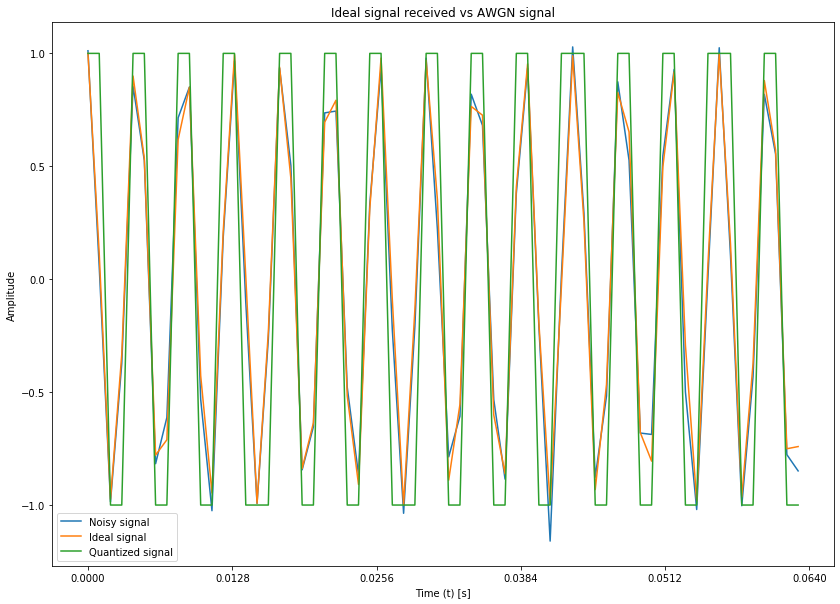

Mean Square error of quantizers is 0.1716 for linear


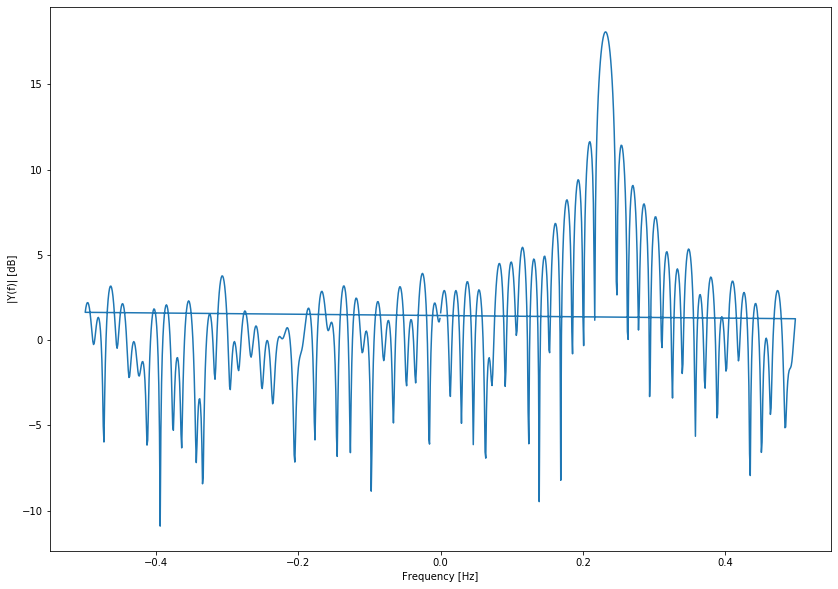

Periodogram peak frequency is 0.2321


/usr/local/lib/python3.6/dist-packages/scipy/signal/spectral.py:1969: UserWarning: nperseg = 256 is greater than input length  = 64, using nperseg = 64
  .format(nperseg, input_length))
/usr/local/lib/python3.6/dist-packages/scipy/signal/spectral.py:1818: UserWarning: Input data is complex, switching to return_onesided=False
  warnings.warn('Input data is complex, switching to '


20.28118558198117

In [14]:
# generate some ideal data
t = np.arange(0, n)/fs
x, _ = data_generator(min_fc=fc, max_fc=fc, amplitude=amplitude, n=n, digital_freq=1.0/sampling_ratio)

# add noise
x_rec, std = generate_noise(x, SNR)
# print(f"snr ={10**(calc_snr(x, x_rec)/10.0)}, also A^2/2o^2 = {amplitude**2/(2*std**2)}")

# quantize values
linear_x, _ = general_quantizer(x_rec, bits=bits, maximum=amplitude, minimum=-amplitude)

# plot for comparison
plt.plot(t, x_rec.real, t, x.real, t, linear_x.real)
plt.title("Ideal signal received vs AWGN signal")
plt.xticks(np.arange(0, tend+1e-8, step=0.2*tend))
plt.xlabel("Time (t) [s]")
plt.ylabel("Amplitude")
plt.legend(["Noisy signal", "Ideal signal", "Quantized signal"], loc="best")
plt.show()
print(f"Mean Square error of quantizers is {mean_squared_error(np.absolute(x), np.absolute(linear_x)):.4f} for linear")

plot_spectrum(x, x_rec)


### Evaluate Estimators

/usr/local/lib/python3.6/dist-packages/scipy/signal/spectral.py:1969: UserWarning: nperseg = 256 is greater than input length  = 64, using nperseg = 64
  .format(nperseg, input_length))
/usr/local/lib/python3.6/dist-packages/scipy/signal/spectral.py:1818: UserWarning: Input data is complex, switching to return_onesided=False
  warnings.warn('Input data is complex, switching to '


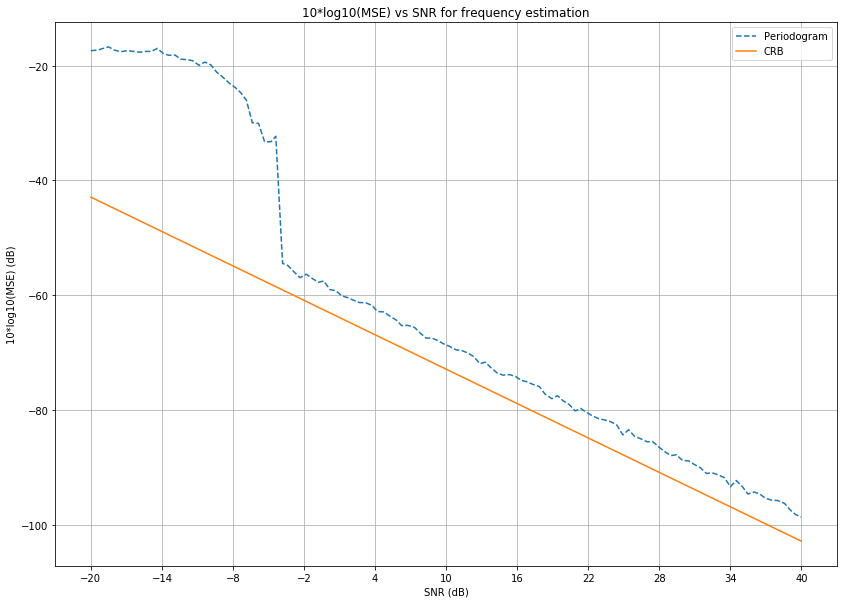

/usr/local/lib/python3.6/dist-packages/scipy/signal/spectral.py:1969: UserWarning: nperseg = 256 is greater than input length  = 64, using nperseg = 64
  .format(nperseg, input_length))
/usr/local/lib/python3.6/dist-packages/scipy/signal/spectral.py:1818: UserWarning: Input data is complex, switching to return_onesided=False
  warnings.warn('Input data is complex, switching to '


In [0]:
"""
First attempts at creating a script which can be used to compare how various estimators work
at measuring carrier frequency offset (and possible amplitude and phase).
"""
import pickle
msepath = "drive/My Drive/Colab Notebooks_UT/CFO/MSES/"+str(n)+"-point/"
recalc = True

classic_mse = msepath + "P_classic.pickle"

estimators = [Periodogram_estimator] #, WPA_estimator_1, WPA_estimator_2, WPA_estimator_3, WPA_estimator_4]
names = ["Periodogram"] #, "Weighted Phase Averager", "Unweighted Phase Averager", "Weighted Linear", "Unweighted Linear"]

if recalc is True:
    (snrs, mses) = plot_over_snr(x, -20, 40, fs=fs, fc=fc/fs, estimators=estimators, names=names, monte_carlos=MC//3)
    (quant_snrs, quant_mses) = plot_over_snr(x, -20, 40, fs=fs, fc=fc/fs, estimators=estimators, names=names, phase=True, quantizer=linear_quantizer, bits=bits, monte_carlos=MC)

    print(f"Estimations ={WPA_estimator_1(x_rec)}, {WPA_estimator_2(x_rec)}, {WPA_estimator_3(x_rec)}, {WPA_estimator_4(x_rec)} ")

    filen = open(classic_mse, "wb")
    pickle.dump([(snrs, mses), (quant_snrs, quant_mses)], filen )
    filen.close()
    
else:
    filen = open( classic_mse, "rb")
    (snrs, mses), (quant_snrs, quant_mses) = pickle.load(filen)
    filen.close()
    for i in range(len(mses)):
        plt.plot(snrs, mses[i])

    plt.legend(names)
    plt.title(f"10*log10(MSE) vs SNR for frequency estimation")
    plt.xlabel("SNR (dB)")
    plt.ylabel("10*log10(MSE) (dB)")
    plt.grid()
    plt.show()

    for i in range(len(quant_mses)):
        plt.plot(snrs, quant_mses[i])
        
    plt.title(f"10*log10(MSE) vs SNR with 1-Bit Quantization")
    plt.xlabel("SNR (dB)")
    plt.ylabel("10*log10(MSE) (dB)")
    plt.legend(names)
    plt.grid()
    plt.show()


/usr/local/lib/python3.6/dist-packages/scipy/signal/spectral.py:1969: UserWarning: nperseg = 256 is greater than input length  = 64, using nperseg = 64
  .format(nperseg, input_length))
/usr/local/lib/python3.6/dist-packages/scipy/signal/spectral.py:1818: UserWarning: Input data is complex, switching to return_onesided=False
  warnings.warn('Input data is complex, switching to '


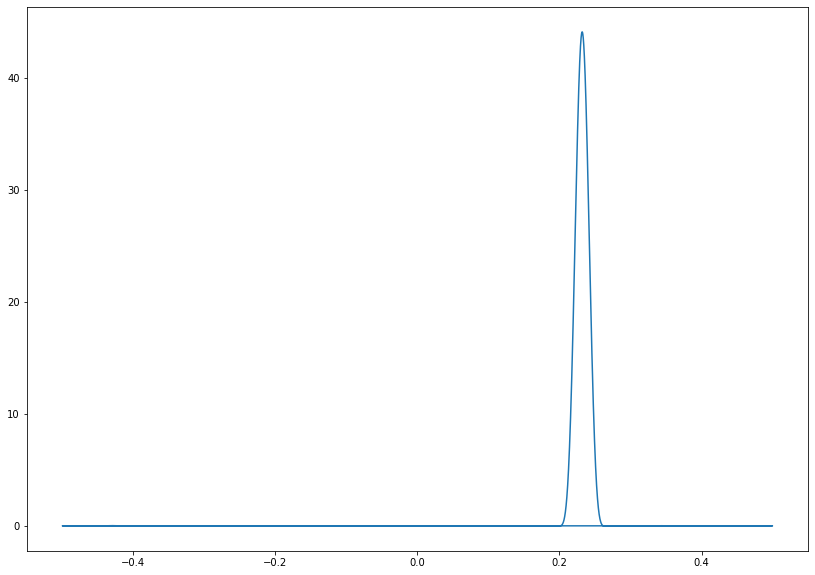

In [10]:
from scipy import signal

f, Pxx = signal.welch(x_rec, nfft=2**16)

plt.plot(f, Pxx)

### Timing

In [0]:
%timeit -n 30 [Periodogram_estimator(x_rec) for i in range(1000)]

30 loops, best of 3: 6.27 s per loop


In [0]:
main_path = 'drive/My Drive/Colab Notebooks_UT/CFO/Models/'
model_name = 'LSTM16_LSTM32_LSTM64_Res64-3_L32_Res32-3_L16_snr_0-10.h5py'
model_path = main_path + str(n)+'-point/' + model_name

model = keras.models.load_model(model_path)
x_rec2 = convert_complex_to_real(x_rec).reshape(1, n, 2)

datam = np.array([])
for i in range(1000):
    datam = np.append(datam, x_rec2)
datam = datam.reshape(1000, n, 2)

%timeit -n 50 model.predict(datam)

del model

50 loops, best of 3: 2.47 s per loop


# Deep Learning

In [26]:
# !pip install --upgrade pip
!pip install tensorflow-gpu==2.0
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras import backend as K

print(tf.__version__)

K.set_floatx('float64')
K.set_epsilon(1e-12)

     |████████████████████████████████| 380.8MB 35kB/s 
     |████████████████████████████████| 450kB 43.1MB/s 
     |████████████████████████████████| 3.8MB 30.6MB/s 
     |████████████████████████████████| 81kB 9.5MB/s 
ERROR: tensorflow 1.15.0 has requirement tensorboard<1.16.0,>=1.15.0, but you'll have tensorboard 2.0.2 which is incompatible.
ERROR: tensorflow 1.15.0 has requirement tensorflow-estimator==1.15.1, but you'll have tensorflow-estimator 2.0.1 which is incompatible.
ERROR: tensorboard 2.0.2 has requirement grpcio>=1.24.3, but you'll have grpcio 1.15.0 which is incompatible.
ERROR: google-colab 1.0.0 has requirement google-auth~=1.4.0, but you'll have google-auth 1.9.0 which is incompatible.
  Found existing installation: tensorflow-estimator 1.15.1
    Uninstalling tensorflow-estimator-1.15.1:
      Successfully uninstalled tensorflow-estimator-1.15.1
  Found existing installation: google-auth 1.4.2
    Uninstalling google-auth-1.4.2:
      Successfully uninstalled googl

2.0.0


In [0]:
size = 180000
min_snr = 0
max_snr=10

In [0]:
dataset, freqs = build_dataset(min_fc=1, max_fc=1000, size=size, min_digital_freq=0.01, max_digital_freq=0.4, n=n, min_snr=min_snr, max_snr=max_snr, split_real_imag=True, quantizer=True)
dataset = dataset.reshape(size, n, 2).astype(np.float64)
print(dataset.shape)
validation_size = 0.15             # 15% test size
x_train, x_test, y_train, y_test = model_selection.train_test_split(dataset, freqs, test_size= validation_size, random_state = seed)

(180000, 8, 2)


In [0]:
x_train.shape

(153000, 8, 2)

In [0]:
train = tf.data.Dataset.from_tensor_slices((x_train, y_train)).batch(32).shuffle(1000)
test = tf.data.Dataset.from_tensor_slices((x_test, y_test)).batch(32).shuffle(1000)
train = train.prefetch(tf.data.experimental.AUTOTUNE)
test = test.prefetch(tf.data.experimental.AUTOTUNE)

In [0]:
class resblock(keras.layers.Layer):
    def __init__(self, n_layers, n_neurons, **kwargs):
        super().__init__(**kwargs)
        self.hidden = [keras.layers.Dense(n_neurons,
                                          activation='relu',
                                          kernel_initializer='he_normal')
                       for _ in range(n_layers)]
    @tf.function    
    def call(self, inputs):
        z = inputs
        for layer in self.hidden:
            z = layer(z)
        return inputs + z
    
    def get_config(self):
        base_config = super().get_config()
        return {**base_config}
    

## Single Model Setup

In [0]:
from functools import partial

default_Dense = partial(keras.layers.Dense, activation='relu', kernel_initializer='he_normal')
default_Conv = partial(keras.layers.Conv1D, kernel_size=3, strides = 1, padding='SAME', activation='relu')

name1 = 'Test_RNN_snr_' + str(min_snr) + '-' + str(max_snr) + '.h5py'

model = keras.models.Sequential([
    keras.layers.InputLayer((n, 2)),
    keras.layers.GRU(16, return_sequences=True),
    keras.layers.GRU(32),
    keras.layers.Dense(1)
], name=name1)


optimizer = tf.keras.optimizers.Adam()
model.compile(loss='mse', optimizer=optimizer, metrics=['mae'])
model.summary()

Model: "Test_RNN_snr_0-10.h5py"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_2 (GRU)                  (None, 8, 16)             960       
_________________________________________________________________
gru_3 (GRU)                  (None, 32)                4800      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 33        
Total params: 5,793
Trainable params: 5,793
Non-trainable params: 0
_________________________________________________________________


In [0]:
early_stopping = keras.callbacks.EarlyStopping(patience=12, restore_best_weights = True)

# exponentially decaying learning rate
def scheduler(epoch):
    if epoch <= 15:
        return 0.001
    elif epoch <= 25:
        return 0.0005
    else:
        return 0.0001
    
    

lr_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)

model.fit(train, validation_data=test, epochs=200, callbacks=[early_stopping, lr_callback])
model.evaluate(test)

model_path = 'drive/My Drive/Colab Notebooks_UT/CFO/Models/'+str(n)+"-point/"
print(model_path)

model_name1 = model_path + name1
model.save(model_name1)

Epoch 1/200
4782/4782 [==============================] - 56s 12ms/step - loss: 0.0014 - mae: 0.0242 - val_loss: 0.0000e+00 - val_mae: 0.0000e+00
Epoch 2/200
4782/4782 [==============================] - 42s 9ms/step - loss: 6.3901e-04 - mae: 0.0147 - val_loss: 5.8240e-04 - val_mae: 0.0136
Epoch 3/200
4782/4782 [==============================] - 41s 9ms/step - loss: 5.0607e-04 - mae: 0.0124 - val_loss: 4.9176e-04 - val_mae: 0.0113
Epoch 4/200
4782/4782 [==============================] - 41s 9ms/step - loss: 4.6845e-04 - mae: 0.0116 - val_loss: 4.8347e-04 - val_mae: 0.0117
Epoch 5/200
4782/4782 [==============================] - 41s 9ms/step - loss: 4.4190e-04 - mae: 0.0111 - val_loss: 4.6100e-04 - val_mae: 0.0108
Epoch 6/200
4782/4782 [==============================] - 41s 9ms/step - loss: 4.2753e-04 - mae: 0.0108 - val_loss: 4.5453e-04 - val_mae: 0.0109
Epoch 7/200
4782/4782 [==============================] - 42s 9ms/step - loss: 4.1710e-04 - mae: 0.0106 - val_loss: 4.6124e-04 - val_mae

### Model Evaluation

In [0]:
def model_est(data):
    data = convert_complex_to_real(data)
    model1 = keras.models.load_model(model_name1)
    y = model1.predict(data.reshape(1, n, 2))
    del model1
    return y

model_est(x_rec)

def multi_est_model(data):
    data = np.array(data)
    # model1 = keras.models.load_model(model_name1)
    datam = np.array([])
    for i in range(len(data)):
        datam = np.append(datam, convert_complex_to_real(data[i]))
    results = model1.predict(datam.reshape(len(data), n, 2))
    del model1
    return results

multi_est_model([x_rec, x_rec, x_rec])
        


array([[0.23124656],
       [0.23124656],
       [0.23124656]])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


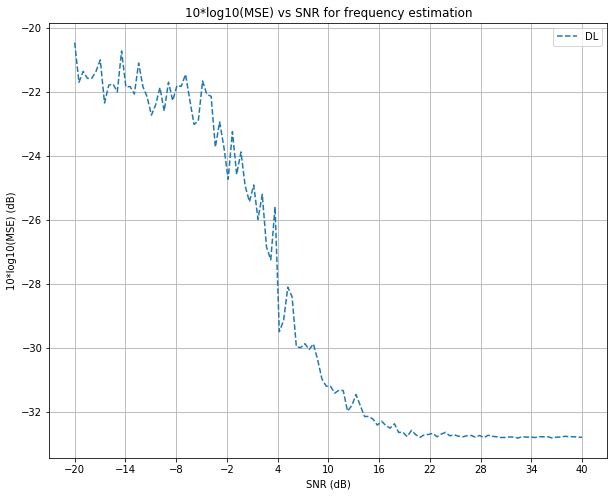

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


In [0]:
estimators = [Periodogram_estimator, WPA_estimator_1, WPA_estimator_2, WPA_estimator_3, WPA_estimator_4, model_est]
names = ["Periodogram", "Weighted Phase Averager", "Unweighted Phase Averager", "Weighted Linear", "Unweighted Linear", "DL"]

msepath = "drive/My Drive/Colab Notebooks_UT/CFO/MSES/"+str(n)+"-point/"
DL_path = msepath + name1[:-4] + "pickle"

recalc = True

if recalc is True:

    (dlsnrs, dlmses) = plot_over_snr_DL(x, -20, 40, fs=fs, fc=fc/fs, estimators=[multi_est_model], names=["DL"], monte_carlos=200)
    (quant_dlsnrs, quant_dlmses) = plot_over_snr_DL(x, -20, 40, fs=fs, fc=fc/fs, estimators=[multi_est_model], names=["DL"], quantizer=linear_quantizer, bits=bits, monte_carlos=200)

   
    print(f"Estimations ={WPA_estimator_1(x_rec)}, {WPA_estimator_2(x_rec)}, {WPA_estimator_3(x_rec)}, {WPA_estimator_4(x_rec)}, {model_est(x_rec)} ")
    
    filen = open(DL_path, "wb")
    pickle.dump([(dlsnrs, dlmses), (quant_dlsnrs, quant_dlmses)], filen )
    filen.close()
else:
    filen = open( DL_path, "rb")
    (dlsnrs, dlmses), (quant_dlsnrs, quant_dlmses) = pickle.load(filen)
    filen.close()
    
    for i in range(len(mses)):
        plt.plot(snrs, mses[i])
        
    plt.plot(dlsnrs.reshape(120, 1), dlmses.reshape(120, 1))

    plt.legend(names, loc='best')
    plt.title(f"10*log10(MSE) vs SNR for frequency estimation")
    plt.xlabel("SNR (dB)")
    plt.ylabel("10*log10(MSE) (dB)")
    plt.grid()
    plt.show()

    for i in range(len(quant_mses)):
        plt.plot(snrs, quant_mses[i])
        
    plt.plot(quant_dlsnrs.reshape(120, 1), quant_dlmses.reshape(120, 1))
    
    plt.title(f"10*log10(MSE) vs SNR with 1-Bit Quantization")
    plt.xlabel("SNR (dB)")
    plt.ylabel("10*log10(MSE) (dB)")
    plt.legend(names, loc='upper right')
    plt.grid()
    plt.show()

## Automated Model Training

Starting n=8
(200000, 8, 2)
Model: "L1024_L256_L64_snr_0-10.h5py"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_15 (Flatten)         (None, 16)                0         
_________________________________________________________________
dense_140 (Dense)            (None, 1024)              17408     
_________________________________________________________________
dense_141 (Dense)            (None, 256)               262400    
_________________________________________________________________
dense_142 (Dense)            (None, 64)                16448     
_________________________________________________________________
dense_143 (Dense)            (None, 1)                 65        
Total params: 296,321
Trainable params: 296,321
Non-trainable params: 0
_________________________________________________________________
Epoch 1/500
5313/5313 - 14s - loss: 0.0088 - mae: 0.0328 - val_loss: 0

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:297: ComplexWarning: Casting complex values to real discards the imaginary part


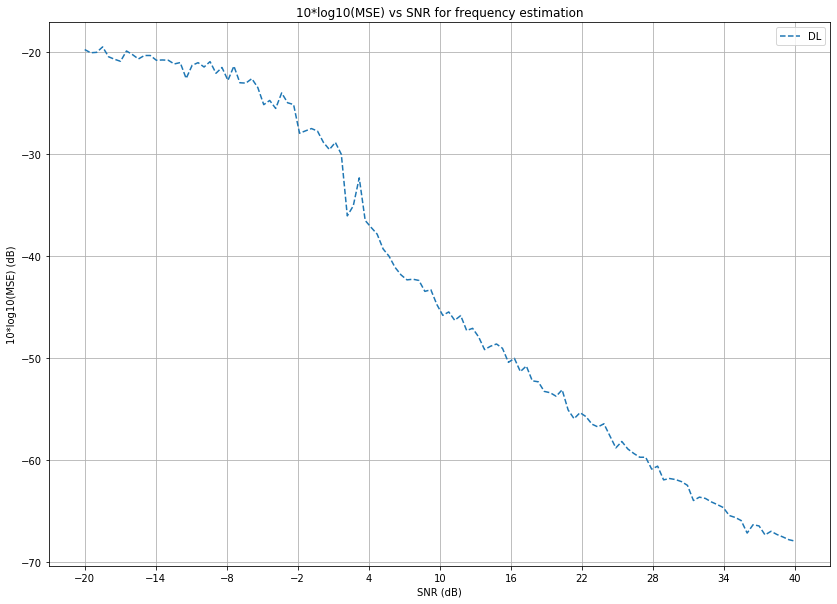

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:297: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:300: ComplexWarning: Casting complex values to real discards the imaginary part


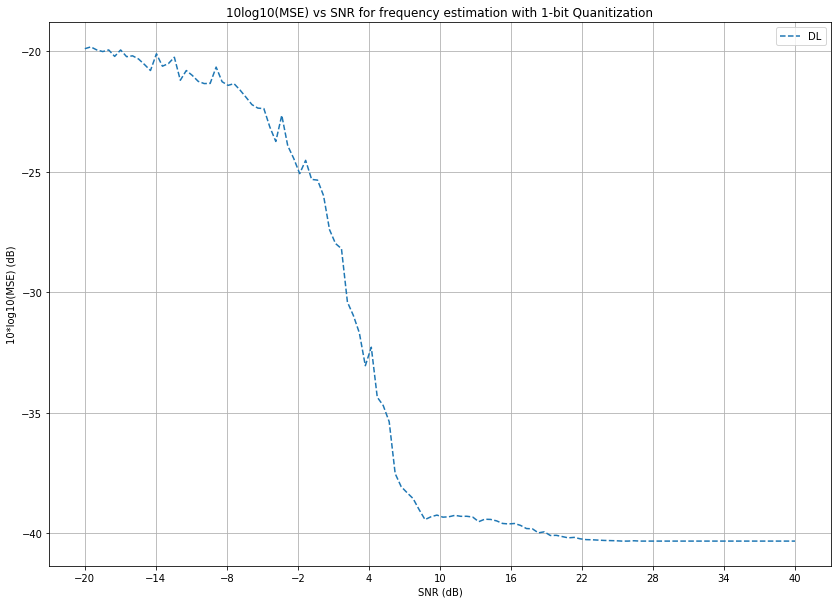

Starting n=16
(200000, 16, 2)
Model: "L1024_L256_L64_snr_0-10.h5py"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_16 (Flatten)         (None, 32)                0         
_________________________________________________________________
dense_144 (Dense)            (None, 1024)              33792     
_________________________________________________________________
dense_145 (Dense)            (None, 256)               262400    
_________________________________________________________________
dense_146 (Dense)            (None, 64)                16448     
_________________________________________________________________
dense_147 (Dense)            (None, 1)                 65        
Total params: 312,705
Trainable params: 312,705
Non-trainable params: 0
_________________________________________________________________
Epoch 1/500
5313/5313 - 15s - loss: 0.0051 - mae: 0.0252 - val_loss:

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:297: ComplexWarning: Casting complex values to real discards the imaginary part


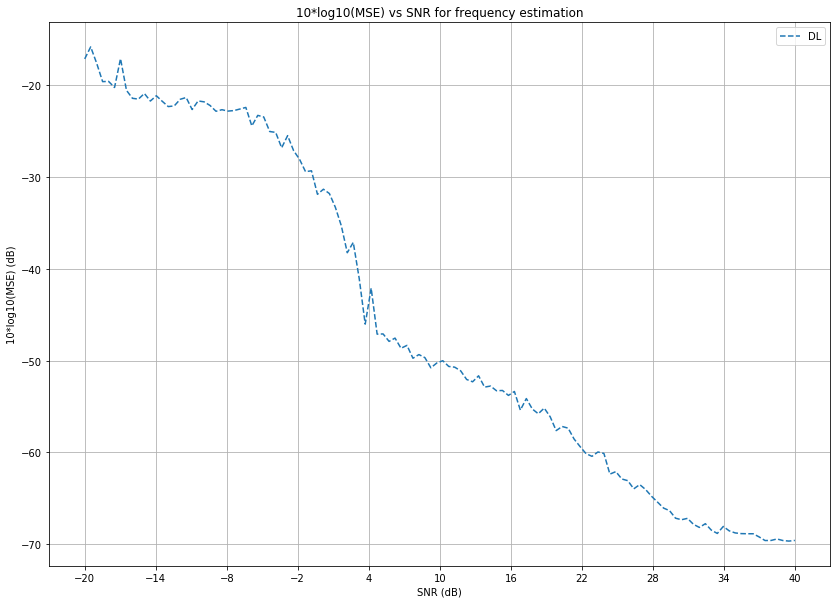

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:297: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:300: ComplexWarning: Casting complex values to real discards the imaginary part


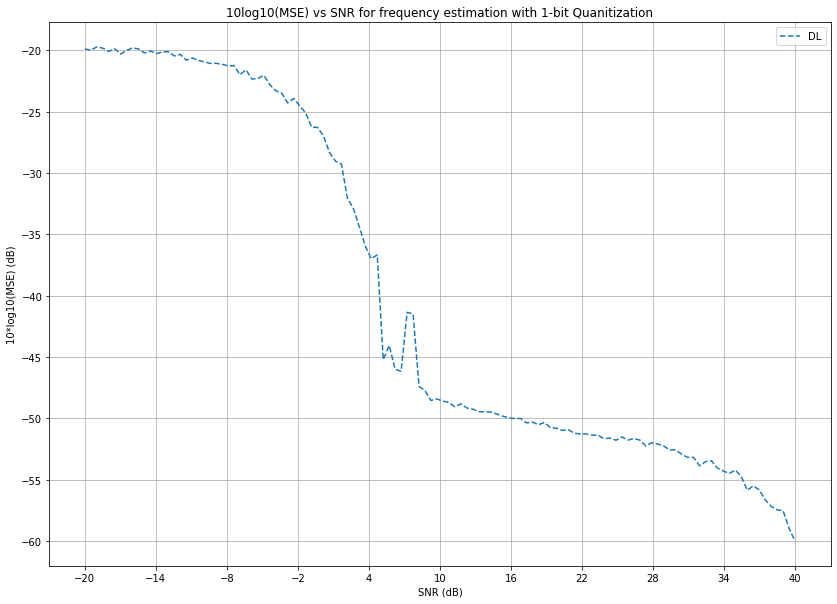

Starting n=32
(200000, 32, 2)
Model: "L1024_L256_L64_snr_0-10.h5py"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_17 (Flatten)         (None, 64)                0         
_________________________________________________________________
dense_148 (Dense)            (None, 1024)              66560     
_________________________________________________________________
dense_149 (Dense)            (None, 256)               262400    
_________________________________________________________________
dense_150 (Dense)            (None, 64)                16448     
_________________________________________________________________
dense_151 (Dense)            (None, 1)                 65        
Total params: 345,473
Trainable params: 345,473
Non-trainable params: 0
_________________________________________________________________
Epoch 1/500
5313/5313 - 14s - loss: 0.0042 - mae: 0.0245 - val_loss:

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:297: ComplexWarning: Casting complex values to real discards the imaginary part


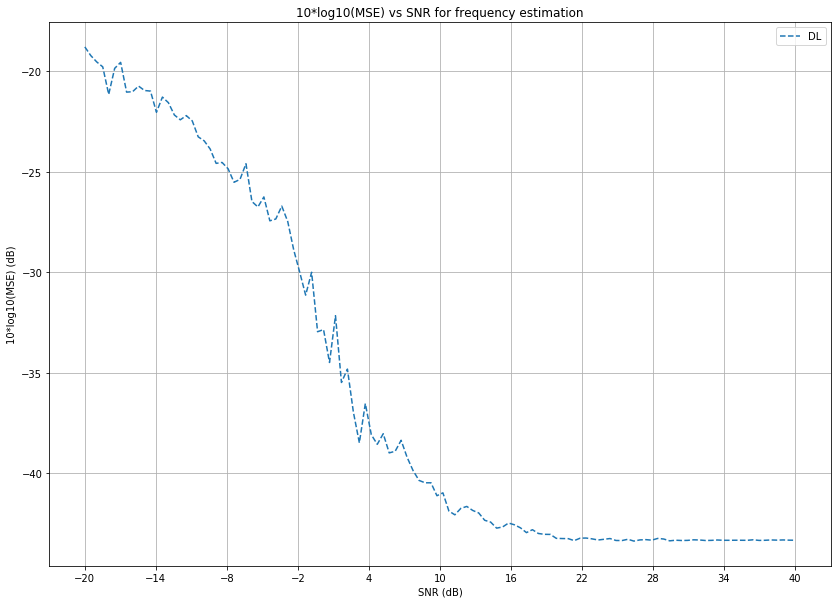

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:297: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:300: ComplexWarning: Casting complex values to real discards the imaginary part


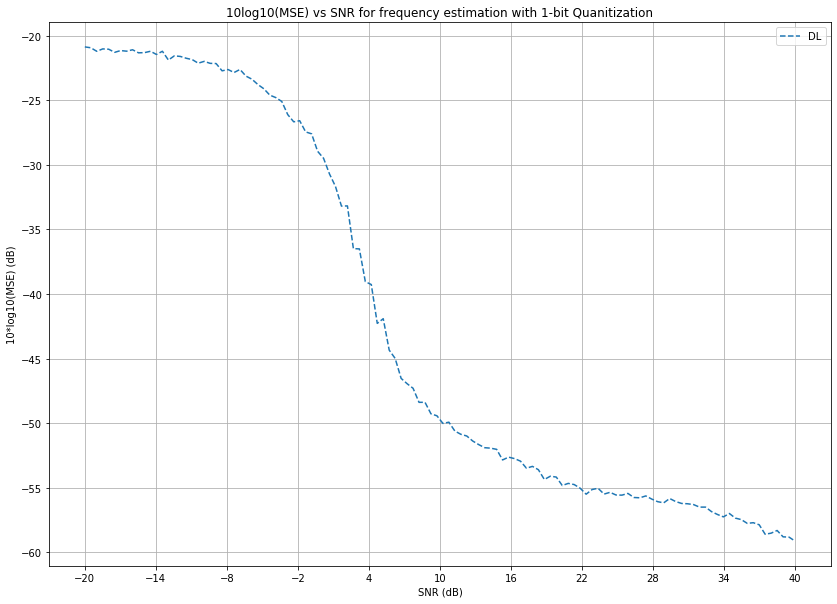

Starting n=64
(200000, 64, 2)
Model: "L1024_L256_L64_snr_0-10.h5py"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_18 (Flatten)         (None, 128)               0         
_________________________________________________________________
dense_152 (Dense)            (None, 1024)              132096    
_________________________________________________________________
dense_153 (Dense)            (None, 256)               262400    
_________________________________________________________________
dense_154 (Dense)            (None, 64)                16448     
_________________________________________________________________
dense_155 (Dense)            (None, 1)                 65        
Total params: 411,009
Trainable params: 411,009
Non-trainable params: 0
_________________________________________________________________
Epoch 1/500
5313/5313 - 14s - loss: 0.0045 - mae: 0.0255 - val_loss:

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:297: ComplexWarning: Casting complex values to real discards the imaginary part


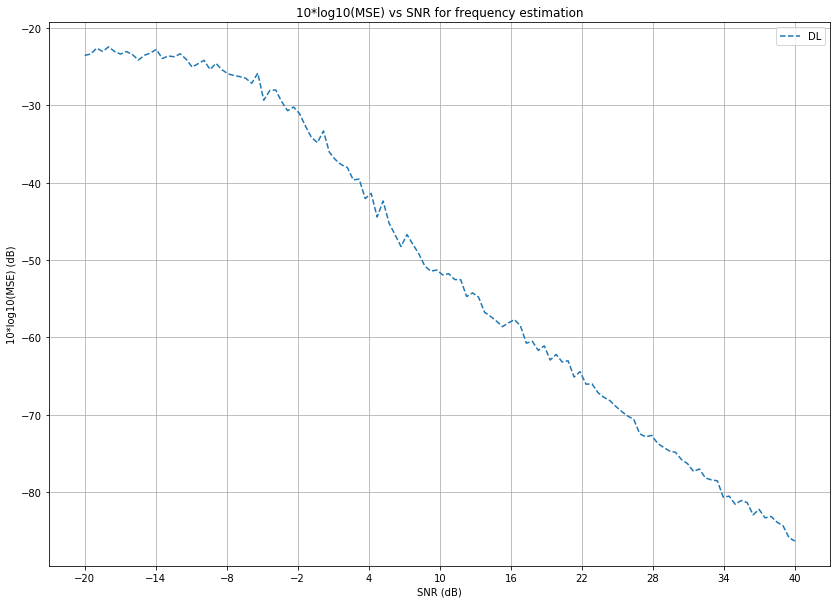

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:297: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:300: ComplexWarning: Casting complex values to real discards the imaginary part


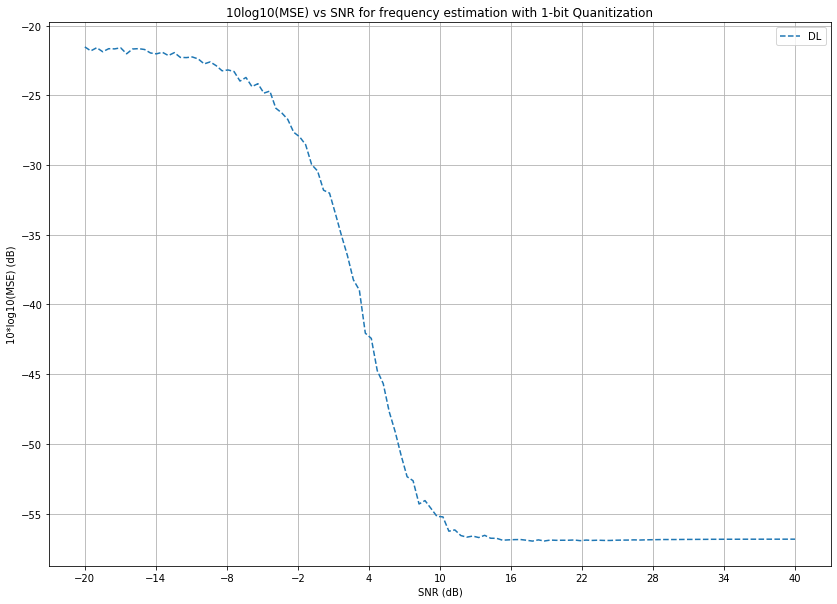

Starting n=128
(200000, 128, 2)
Model: "L1024_L256_L64_snr_0-10.h5py"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_19 (Flatten)         (None, 256)               0         
_________________________________________________________________
dense_156 (Dense)            (None, 1024)              263168    
_________________________________________________________________
dense_157 (Dense)            (None, 256)               262400    
_________________________________________________________________
dense_158 (Dense)            (None, 64)                16448     
_________________________________________________________________
dense_159 (Dense)            (None, 1)                 65        
Total params: 542,081
Trainable params: 542,081
Non-trainable params: 0
_________________________________________________________________
Epoch 1/500
5313/5313 - 14s - loss: 0.0048 - mae: 0.0255 - val_los

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:297: ComplexWarning: Casting complex values to real discards the imaginary part


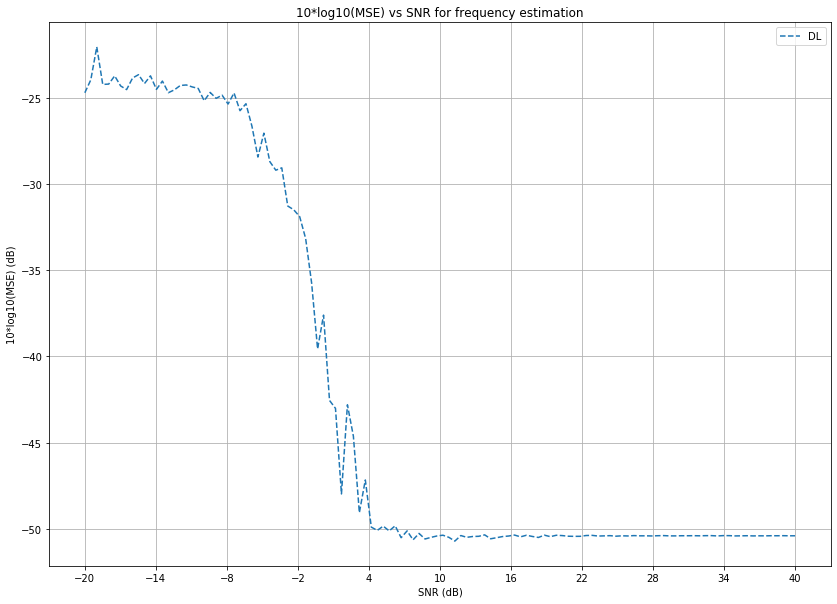

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:297: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:300: ComplexWarning: Casting complex values to real discards the imaginary part


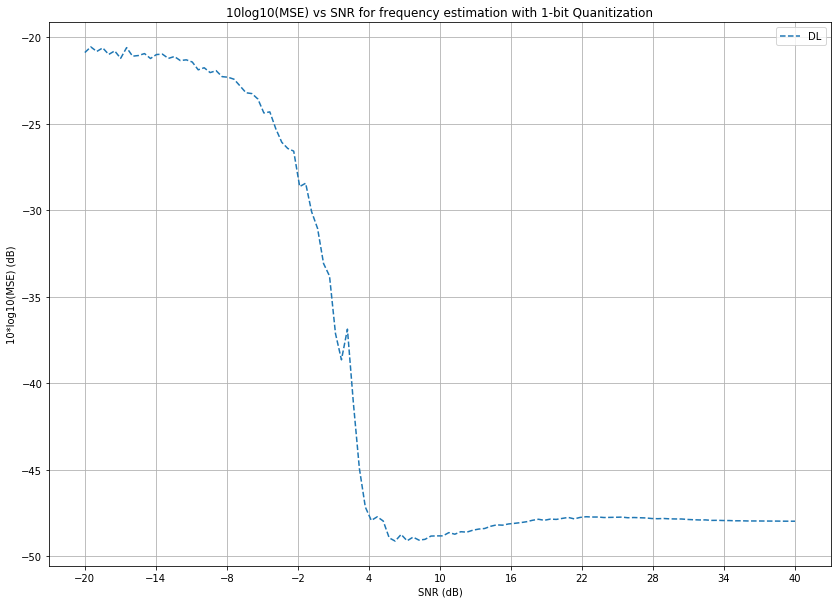

In [0]:
## Automated Model Training for each n
nset = [8, 16, 32, 64, 128]

size = 200000
min_snr = 0
max_snr=10

default_Dense = partial(keras.layers.Dense, activation='relu', kernel_initializer='he_normal')
default_Conv = partial(keras.layers.Conv1D, kernel_size=3, strides = 1, padding='SAME', activation='relu')

early_stopping = keras.callbacks.EarlyStopping(patience=12, restore_best_weights = True)
lr_reduc = tf.keras.callbacks.ReduceLROnPlateau(patience=6, factor=0.5, verbose=0, min_lr=4e-6)
callbacks = [early_stopping, lr_reduc]


def model_est(data):
    data = convert_complex_to_real(data)
    model1 = keras.models.load_model(model_name1)
    y = model1.predict(data.reshape(1, n, 2))
    del model1
    return y


def multi_est_model(data):
    data = np.array(data)
    # model1 = keras.models.load_model(model_name1)
    datam = np.array([])
    for i in range(len(data)):
        datam = np.append(datam, convert_complex_to_real(data[i]))
    results = model.predict(datam.reshape(len(data), ni, 2))
    # del model1
    return results

    
for ni in nset:
    # Data generation
    print(f"Starting n={ni}")
    x, _ = data_generator(min_fc=fc, max_fc=fc, amplitude=amplitude, n=ni, digital_freq=1.0/sampling_ratio)
    
    dataset, freqs = build_dataset(min_fc=1, max_fc=1000, size=size, min_digital_freq=1.0/10.0, max_digital_freq=1.0/2.2, n=ni, min_snr=min_snr, max_snr=max_snr, split_real_imag=True)
    dataset = dataset.reshape(size, ni, 2).astype(np.float64)
    print(dataset.shape)
    validation_size = 0.15             # 15% test size
    x_train, x_test, y_train, y_test = model_selection.train_test_split(dataset, freqs, test_size= validation_size, random_state = seed)
    train = tf.data.Dataset.from_tensor_slices((x_train, y_train)).batch(32).shuffle(1000)
    test = tf.data.Dataset.from_tensor_slices((x_test, y_test)).batch(32).shuffle(1000)
    train = train.prefetch(tf.data.experimental.AUTOTUNE)
    test = test.prefetch(tf.data.experimental.AUTOTUNE)
    
    # Model definition
    name1 = 'L1024_L256_L64_snr_' + str(min_snr) + '-' + str(max_snr) + '.h5py'

    model = keras.models.Sequential([
        keras.layers.InputLayer((ni, 2)),
        keras.layers.Flatten(),
        default_Dense(1024),
        default_Dense(256),
        default_Dense(64),
        keras.layers.Dense(1)
    ], name=name1)


    optimizer = tf.keras.optimizers.Adam()
    model.compile(loss='mse', optimizer=optimizer, metrics=['mae'])
    model.summary()
    

    # Model Training
    model.fit(train, validation_data=test, epochs=500, callbacks=callbacks, verbose=2)
    model.evaluate(test)

    model_path = 'drive/My Drive/Colab Notebooks_UT/CFO/Models/'+str(ni)+"-point/"
    print(model_path)

    model_name1 = model_path + name1
    model.save(model_name1)
    
    msepath = "drive/My Drive/Colab Notebooks_UT/CFO/MSES/"+str(ni)+"-point/"
    DL_path = msepath + name1[:-4] + "pickle"
    # DL_path = 'drive/My Drive/Colab Notebooks_UT/CFO/'+ "n" +str(n)+"-" + name1[:-4] + "pickle"

    (dlsnrs, dlmses) = plot_over_snr_DL(x, -20, 40, fs=fs, fc=fc/fs, estimators=[multi_est_model], names=["DL"], monte_carlos=200)
    (quant_dlsnrs, quant_dlmses) = plot_over_snr_DL(x, -20, 40, fs=fs, fc=fc/fs, estimators=[multi_est_model], names=["DL"], quantizer=linear_quantizer, bits=bits, monte_carlos=700)
    
    filen = open(DL_path, "wb")
    pickle.dump([(dlsnrs, dlmses), (quant_dlsnrs, quant_dlmses)], filen )
    filen.close()
    
    # from google.colab import files
    
    # files.download(DL_path)

### Fix Plot Information

In [0]:
## Rerun the simulation if it was too noisy
n = 8

name1 = 'Q_LSTM16_LSTM32_Res32-3_L128_L64_L32_snr_10-20.h5py'
model_path = 'drive/My Drive/Colab Notebooks_UT/CFO/Models/'+str(n)+'-point/'
model_name = model_path + name1
msepath = 'drive/My Drive/Colab Notebooks_UT/CFO/MSES/'+str(n)+'-point/'
DL_path = msepath + name1[:-4] + "pickle"
model = keras.models.load_model(model_name)

def update_snrs(modelname, n):
    # name1 = 'Q_L64_Res64-4_L128_Res128-3_L256_Res256-2_L64_snr_0-10.h5py'
    model_path = 'drive/My Drive/Colab Notebooks_UT/CFO/Models/'+str(n)+'-point/'
    model_name = model_path + modelname
    msepath = 'drive/My Drive/Colab Notebooks_UT/CFO/MSES/'+str(n)+'-point/'
    DL_path = msepath + modelname[:-4] + "pickle"
    model = keras.models.load_model(model_name)

    def multi_est_model(data):
        data = np.array(data)
        # model1 = keras.models.load_model(model_name1)
        datam = np.array([])
        for i in range(len(data)):
            datam = np.append(datam, convert_complex_to_real(data[i]))
        results = model.predict(datam.reshape(len(data), n, 2))
        # del model1
        return results

    x, _ = data_generator(min_fc=fc, max_fc=fc, amplitude=amplitude, n=n, digital_freq=1.0/sampling_ratio)

    (dlsnrs, dlmses) = plot_over_snr_DL(x, -20, 40, fs=fs, fc=fc/fs, estimators=[multi_est_model], names=["DL"], monte_carlos=200)
    (quant_dlsnrs, quant_dlmses) = plot_over_snr_DL(x, -20, 40, fs=fs, fc=fc/fs, estimators=[multi_est_model], names=["DL"], quantizer=linear_quantizer, bits=bits, monte_carlos=1100, )

    filen = open(DL_path, "wb")
    pickle.dump([(dlsnrs, dlmses), (quant_dlsnrs, quant_dlmses)], filen )
    filen.close()

# update_snrs(name1, n)


Working on n=64
Starting Q_C8_C16_C32_C64_C_128_L128_L64_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


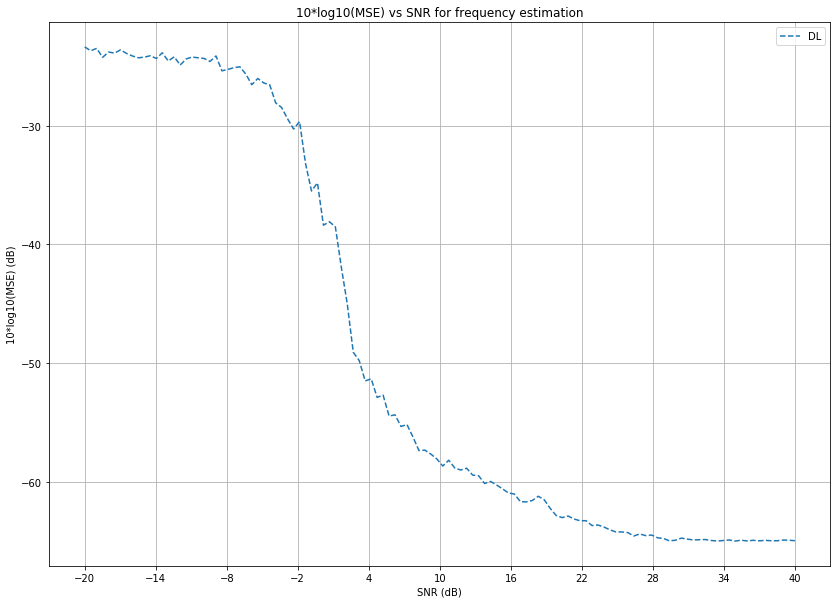

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


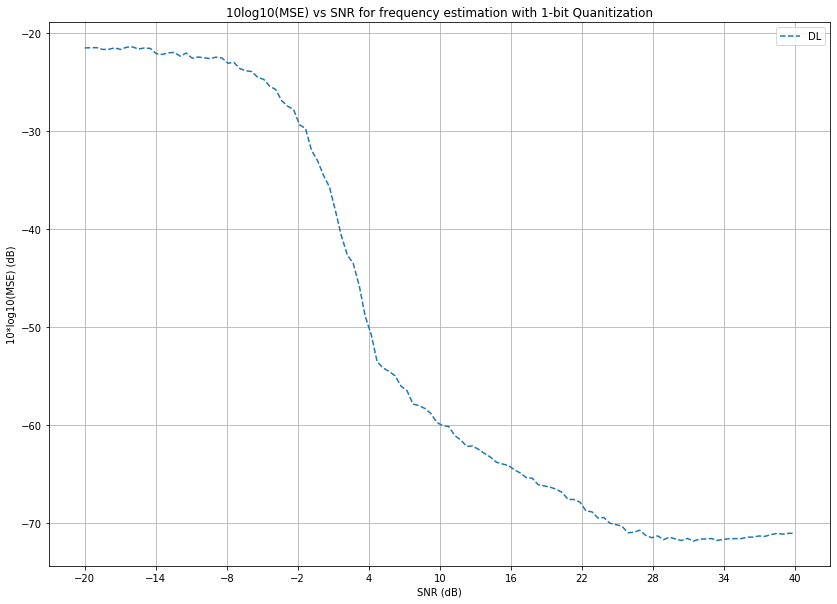

Starting Q_C16_C32_C64_C128_C256_L128_L64_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


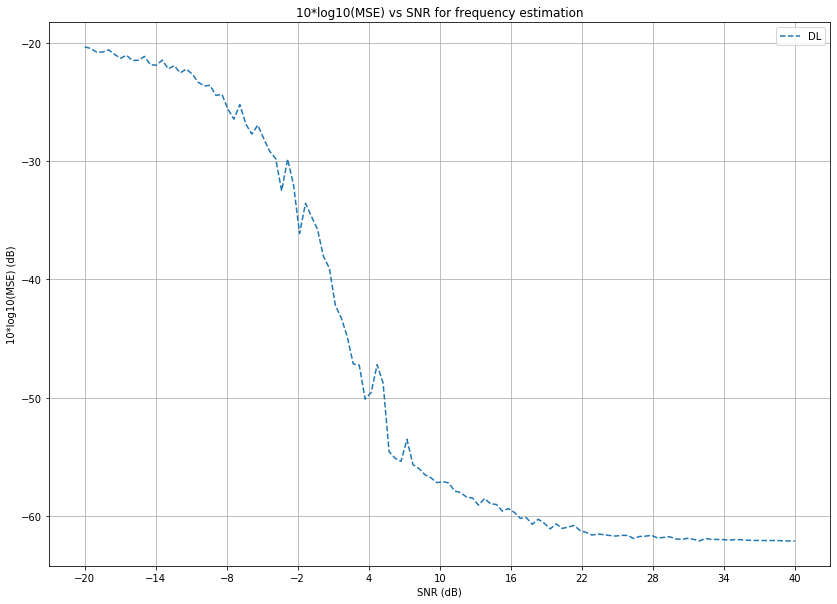

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


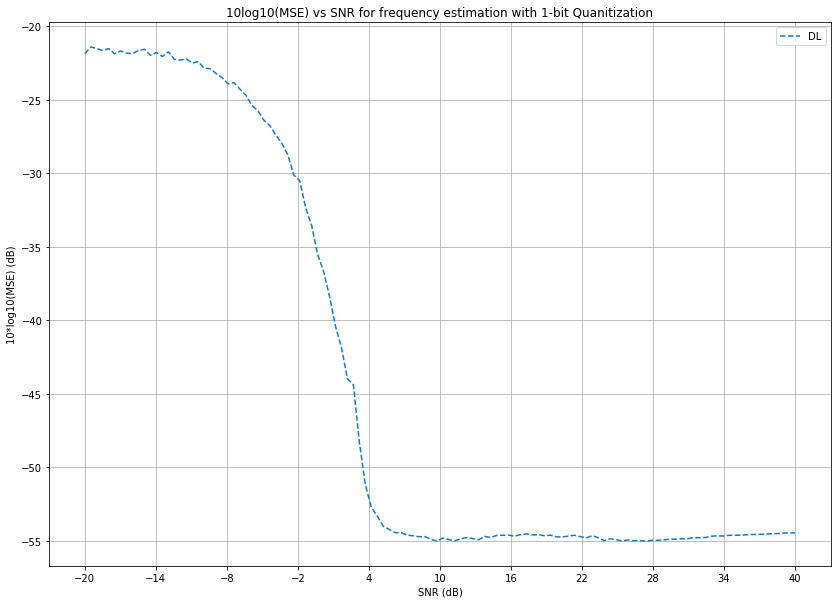

Starting Q_L64_Res64-3_L128_Res128-2_L64_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


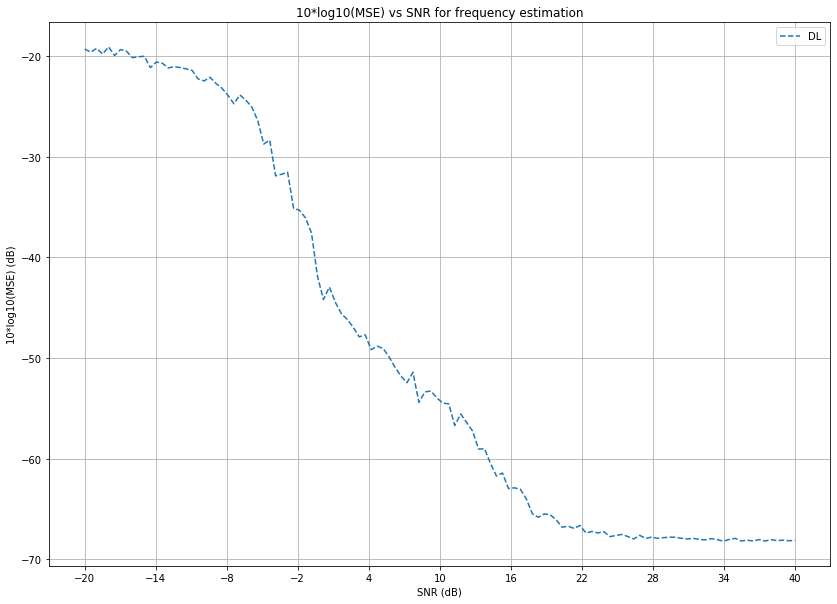

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


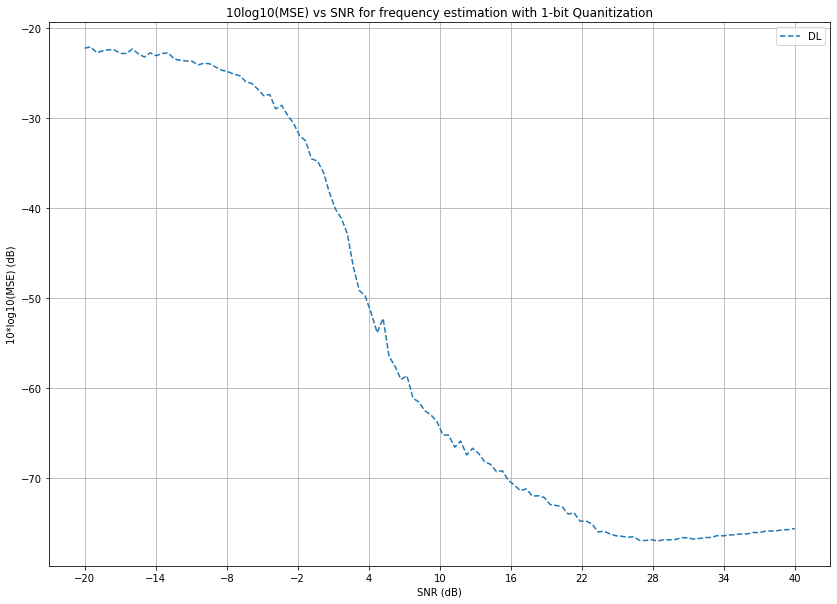

Starting Q_L64_Res64-3_L128_Res128-2_L64_snr_10-20.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


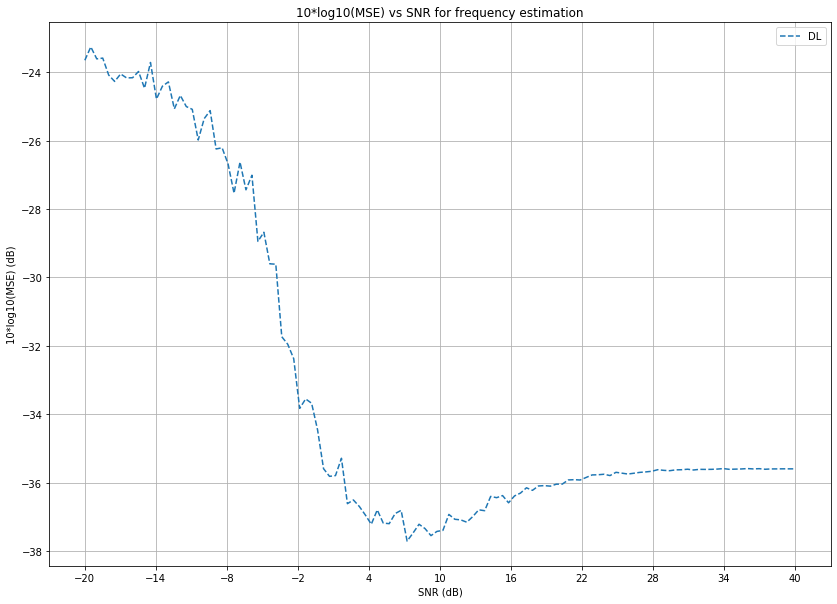

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


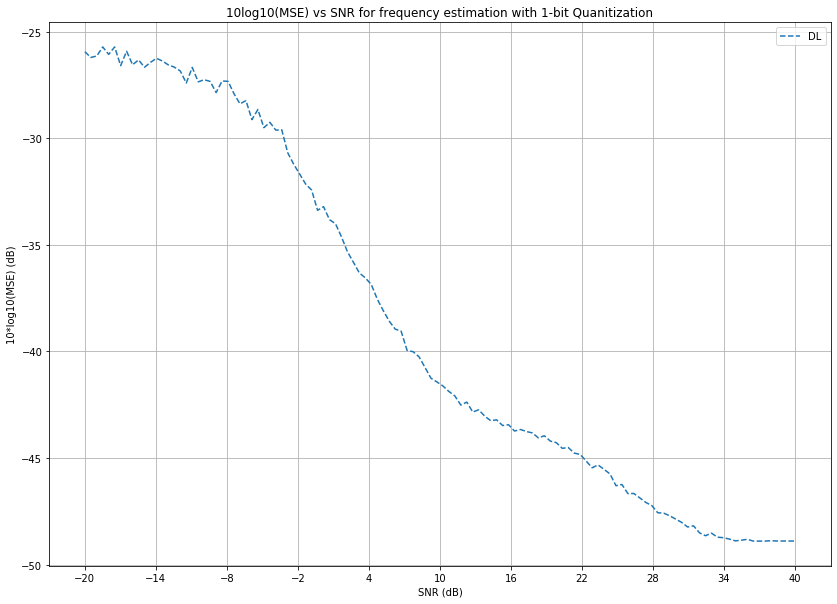

Starting Q_L64_Res64-4_L128_Res128-3_L256_Res256-2_L64_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


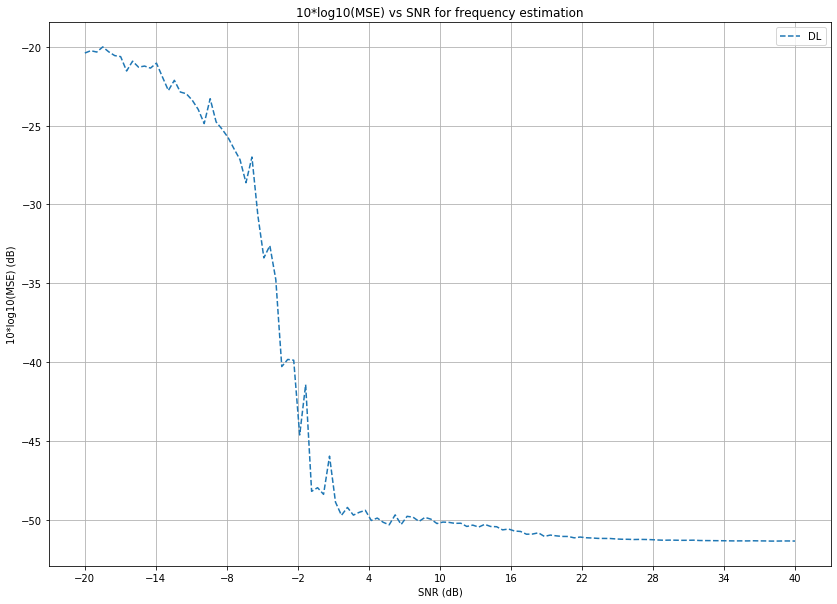

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


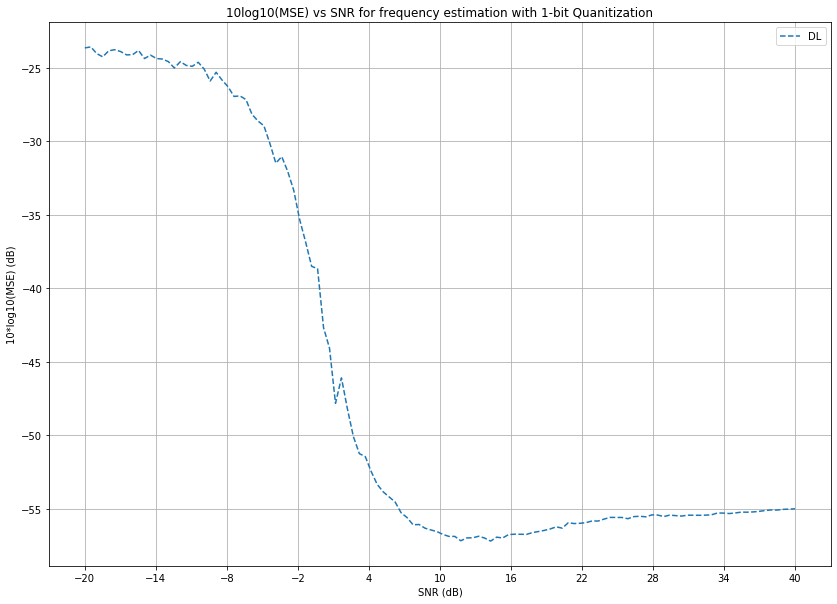

Starting L64_Res64-4_L128_Res128-4_L256_Res256-4_L64_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


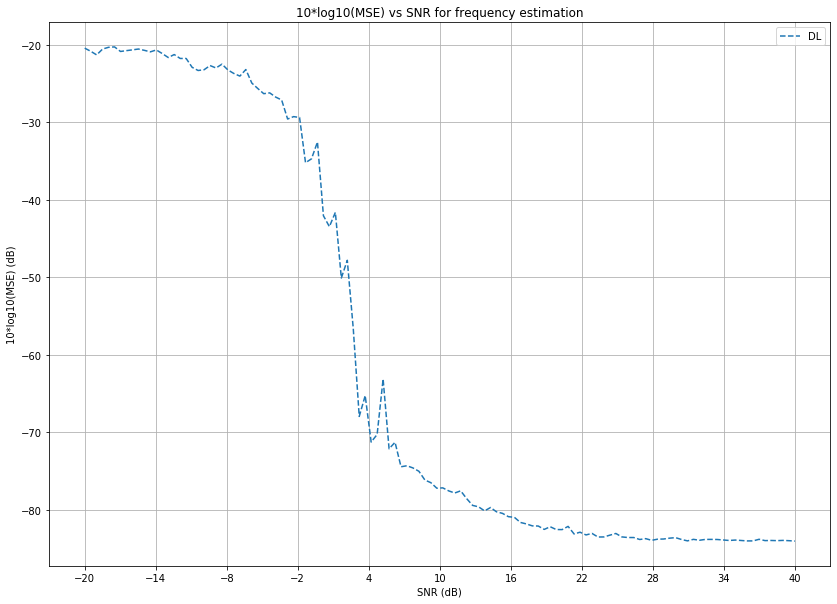

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


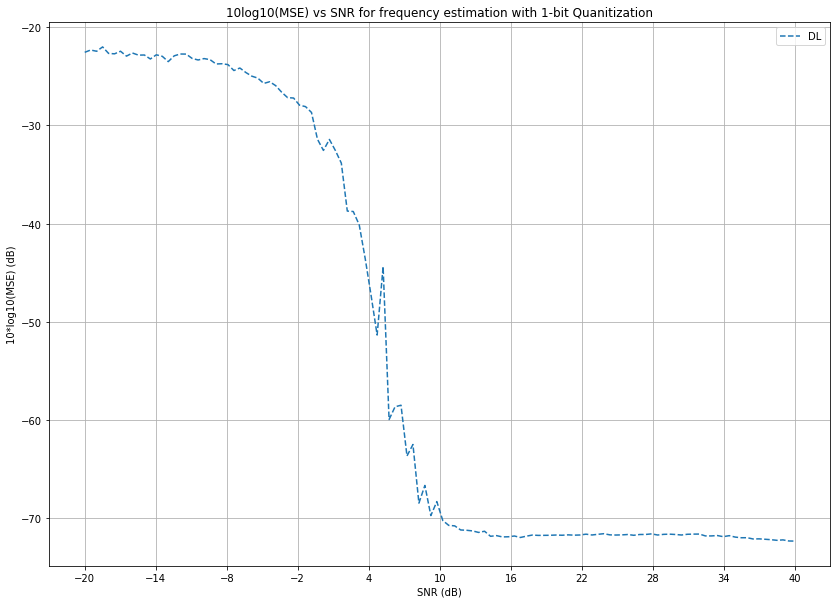

Starting C8_C16_C32_C64_C128_C256_L128_L64_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


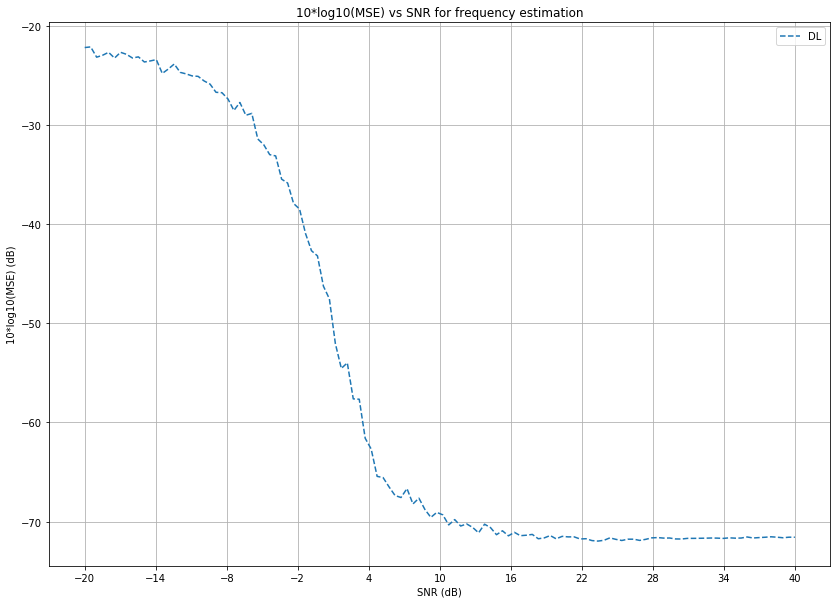

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


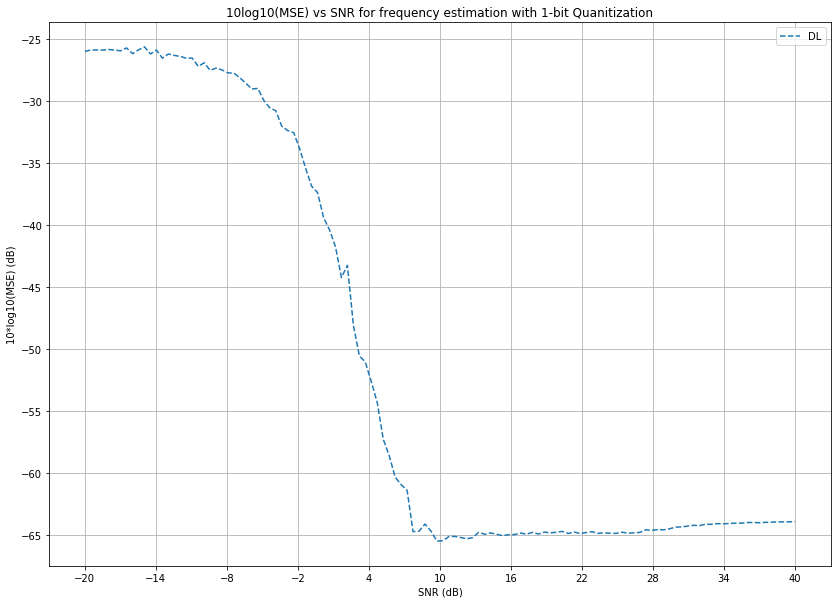

Starting GRU16_GRU32_GRU64_L128_L64_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


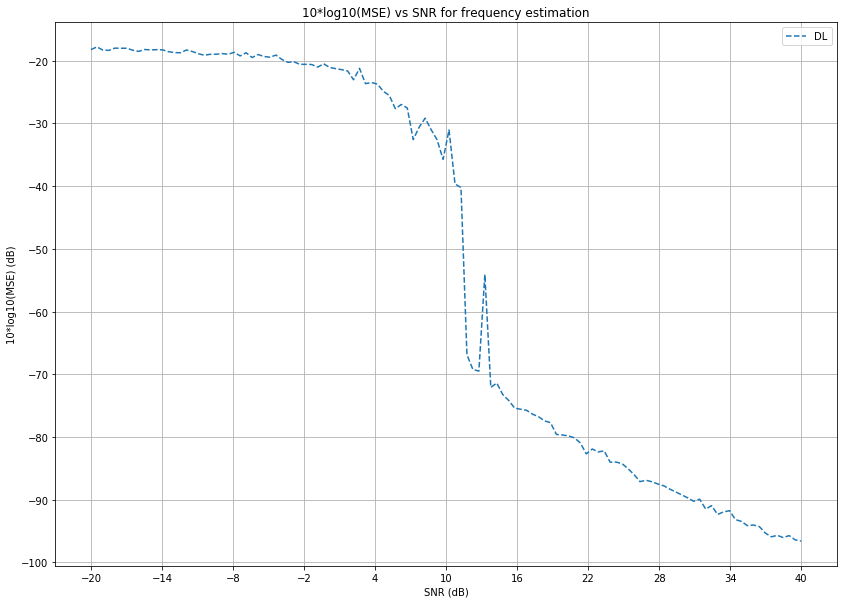

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


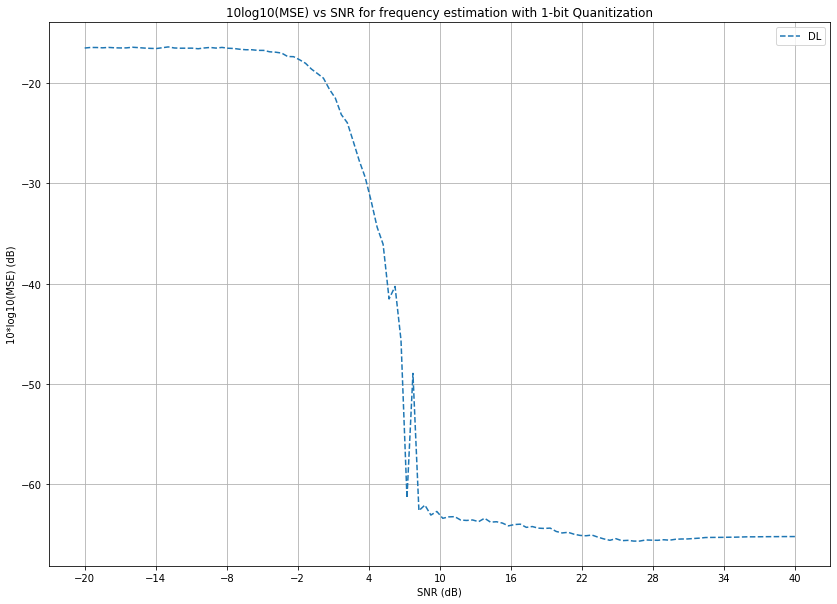

Starting Q_C8_C16_C32_LSTM16_LSTM32_C64_L64_L128_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


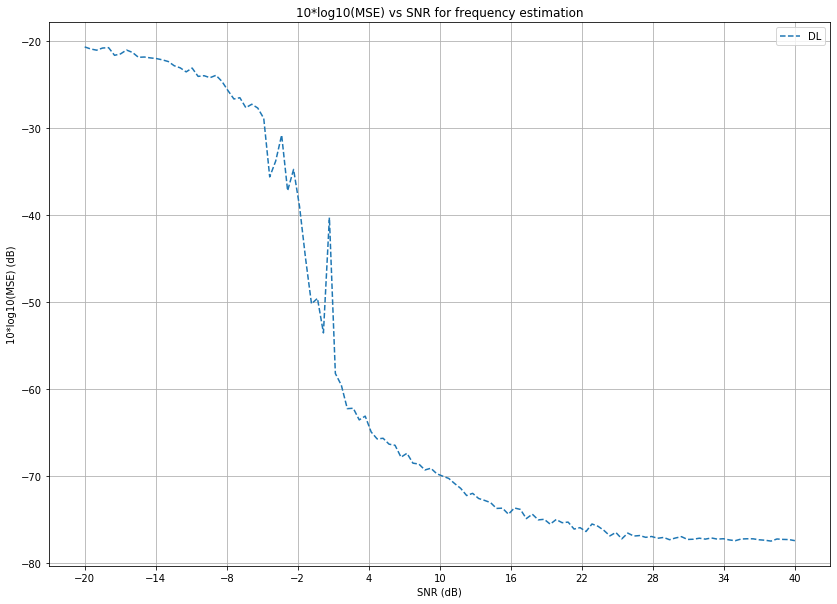

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


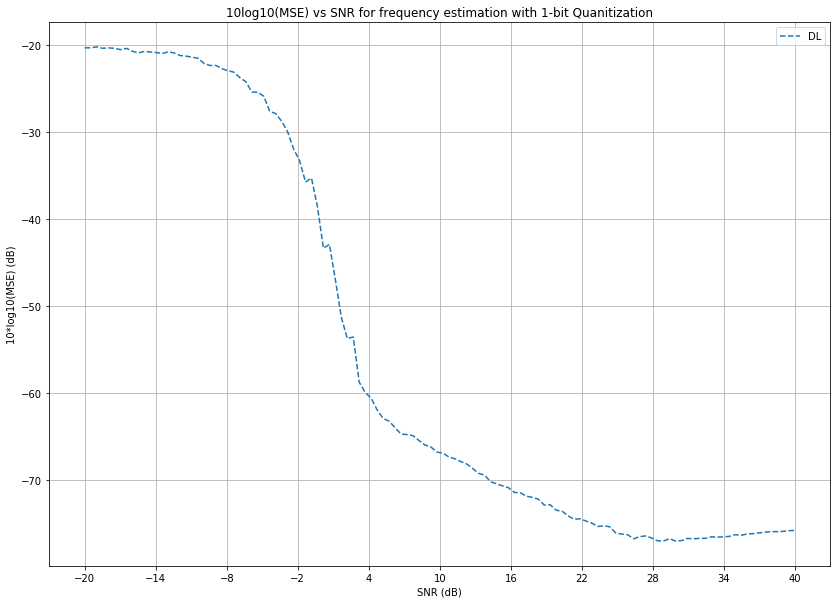

Starting C8_C16_C32_LSTM16_LSTM32_C64_L64_L128_snr_10-20.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


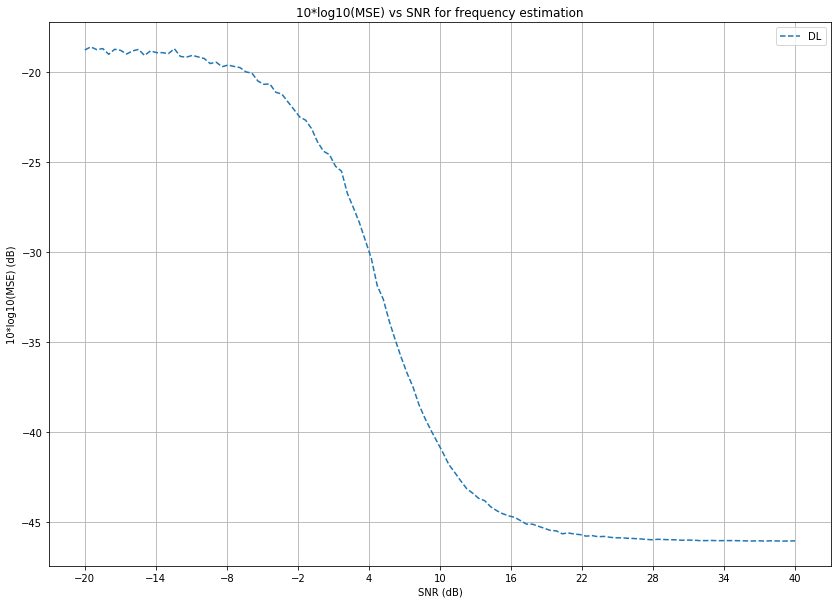

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


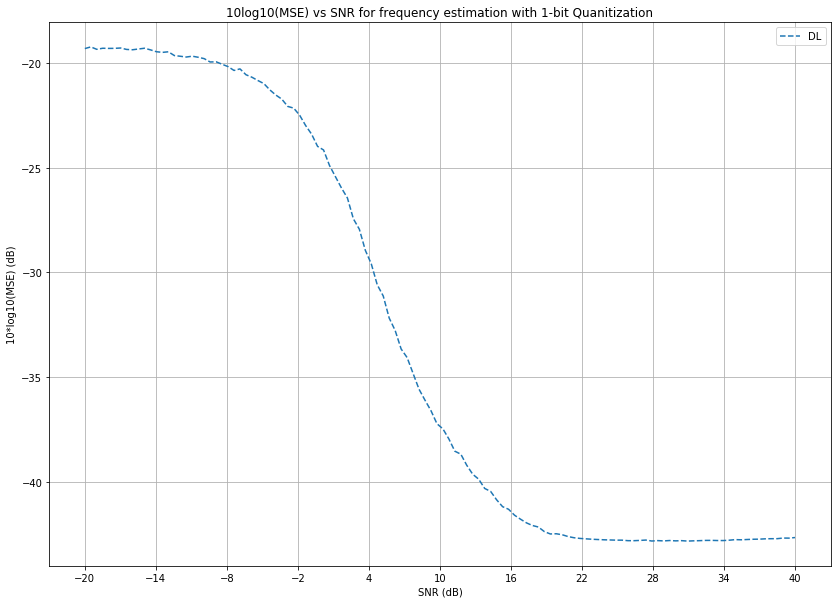

Starting Q_C8_C16_C32_C64_C128_L128_L64_snr_10-20.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


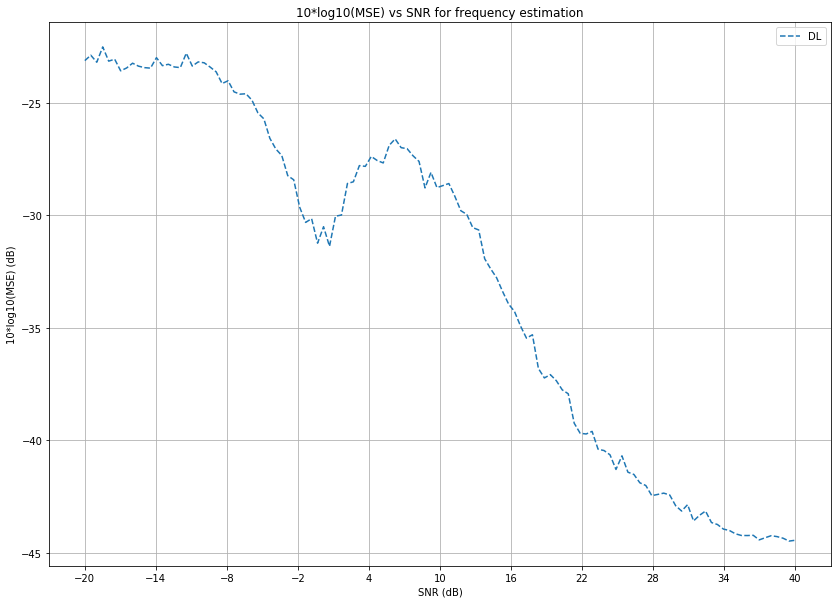

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


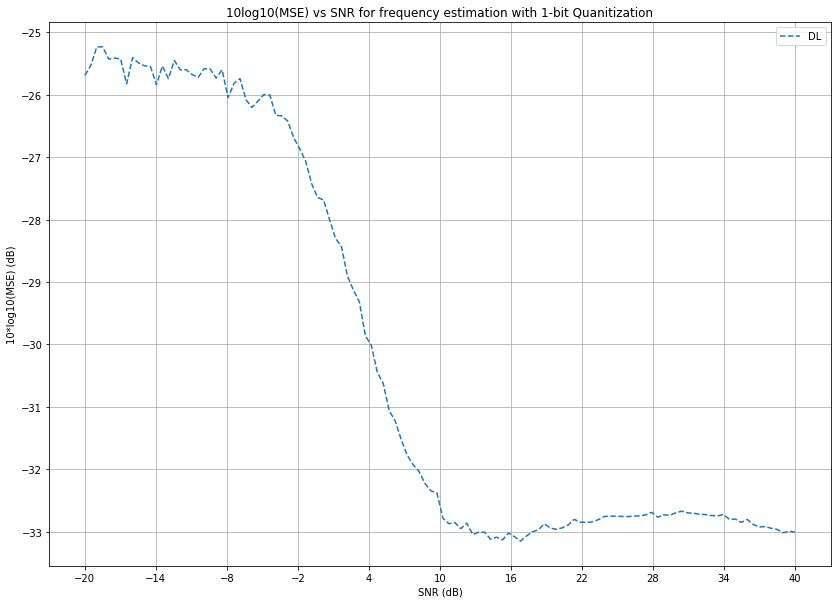

Starting L16_L32_L64__L128_L256_L512_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


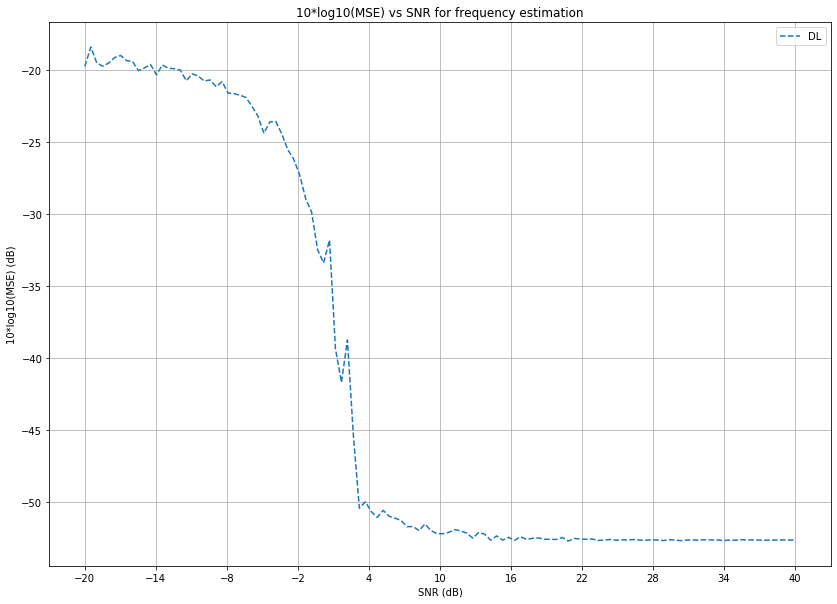

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


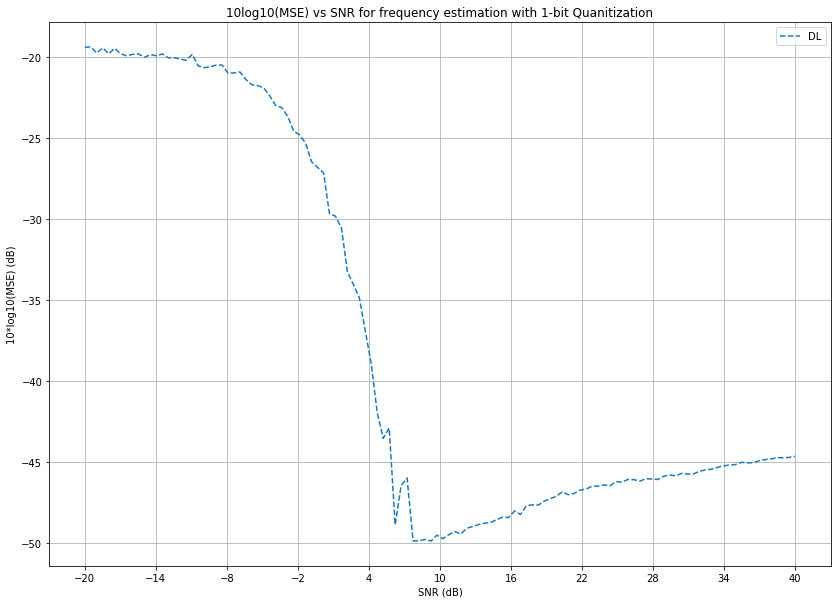

Starting LSTM16_LSTM32_Res32-3_L128_L64_snr_10-20.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


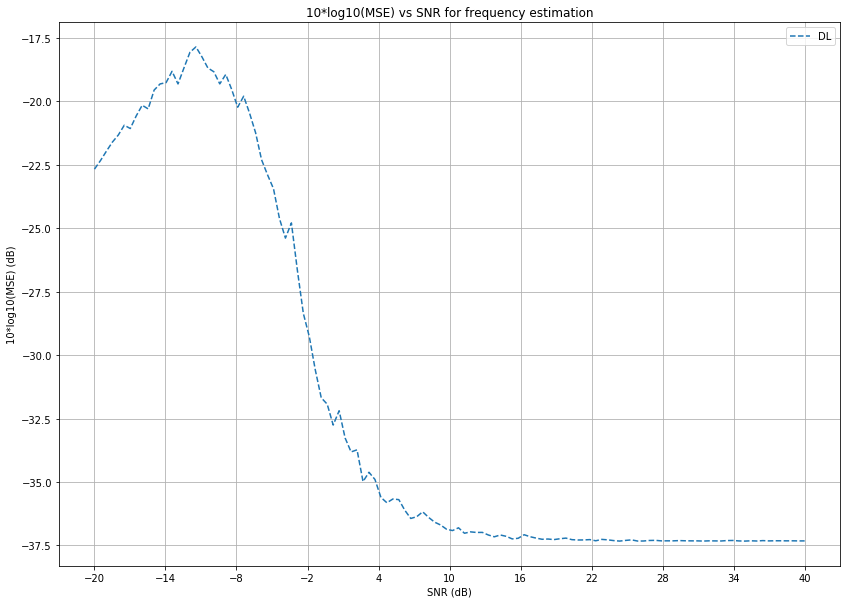

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


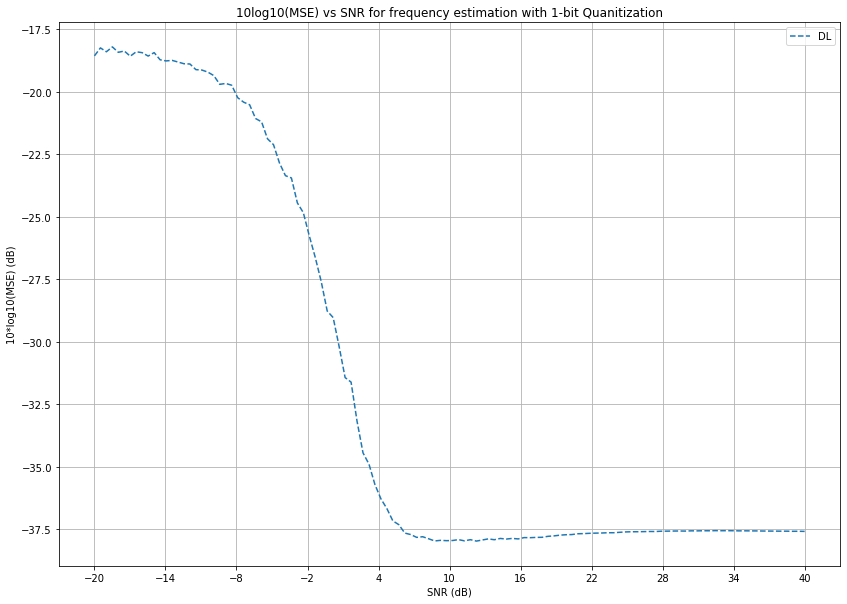

Starting LSTM16_LSTM32_LSTM64_L128_L64_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


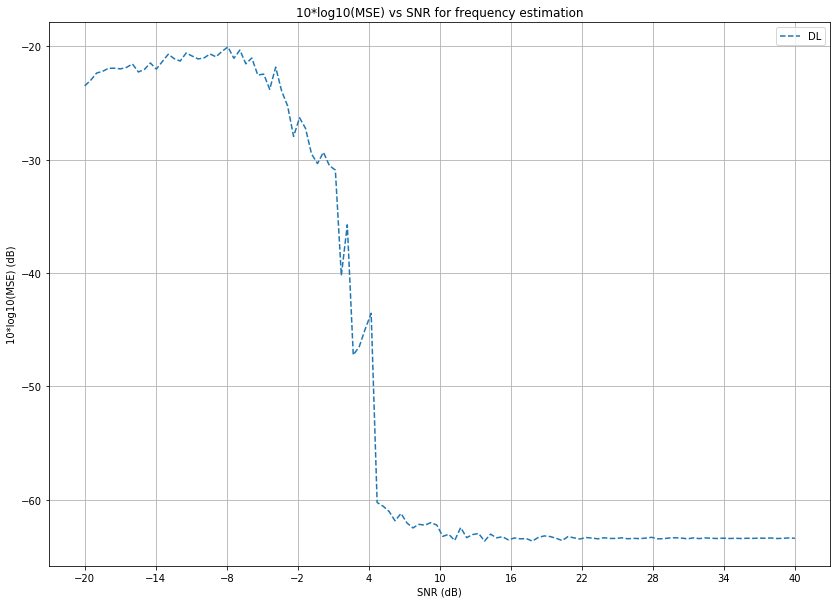

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


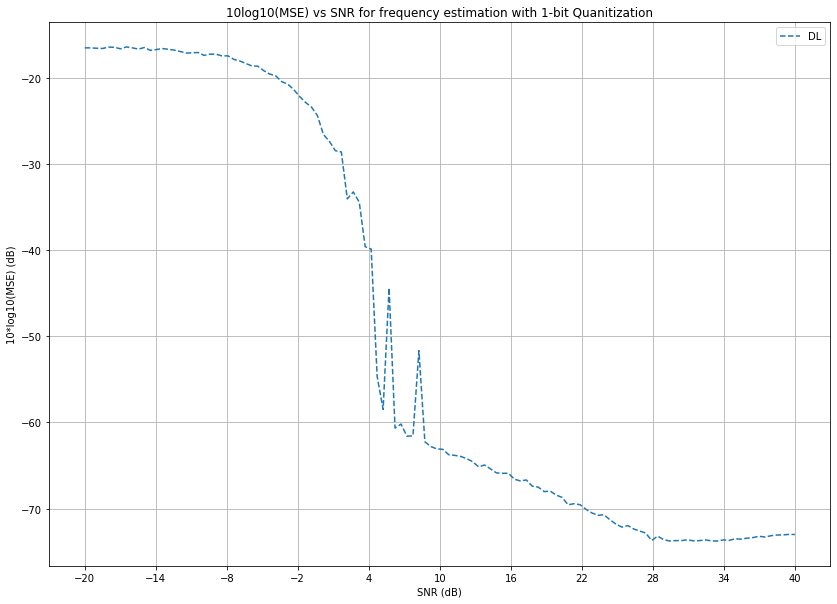

Starting C8_C16_C32_L64_Res64-3_L128_Res128-2_L64_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


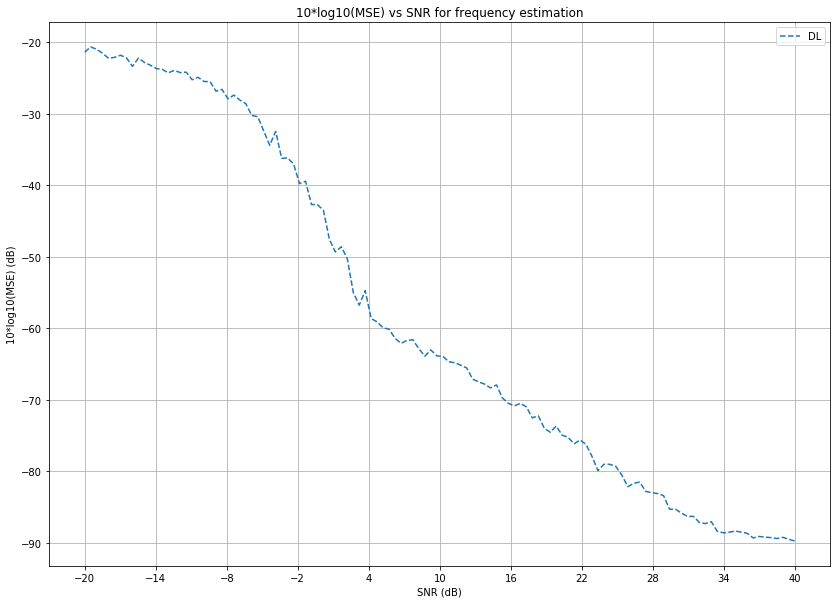

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


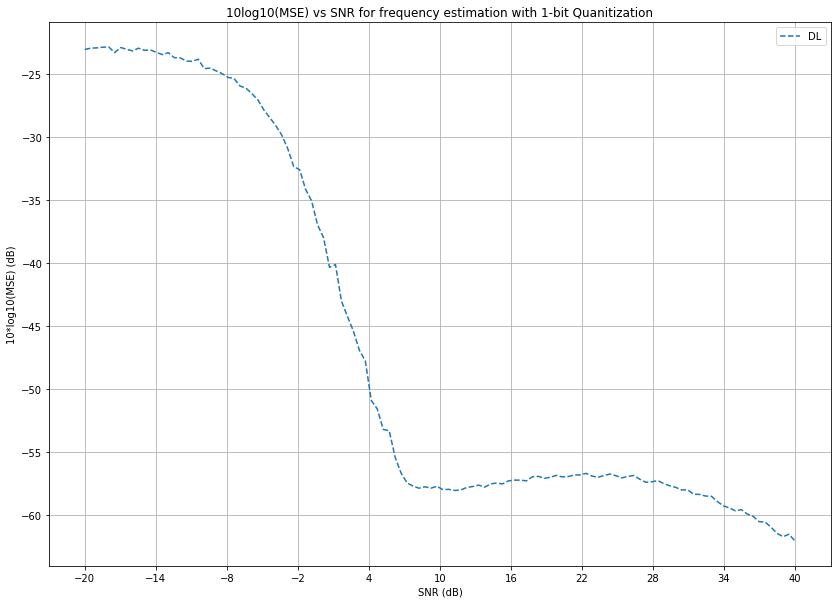

Starting M-Q_C16_C32_C64_C128_C256_L128_L64_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


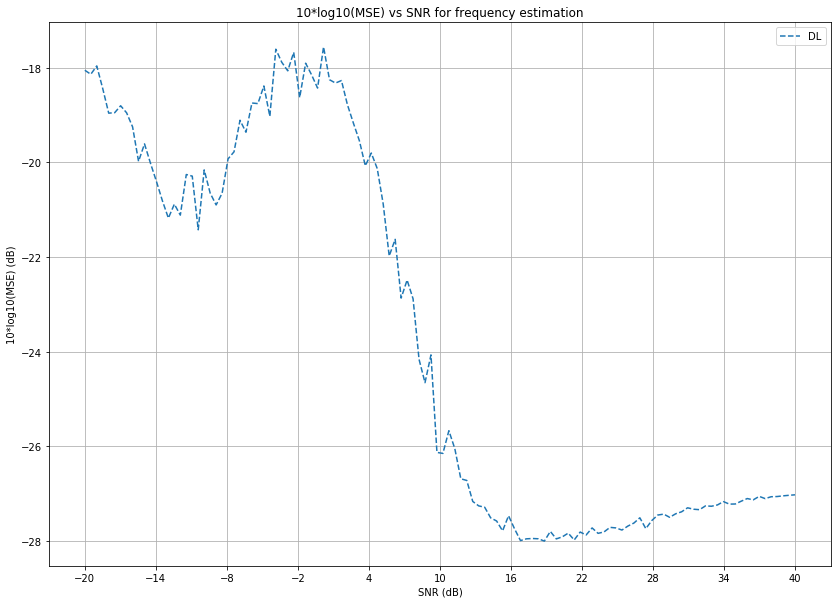

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


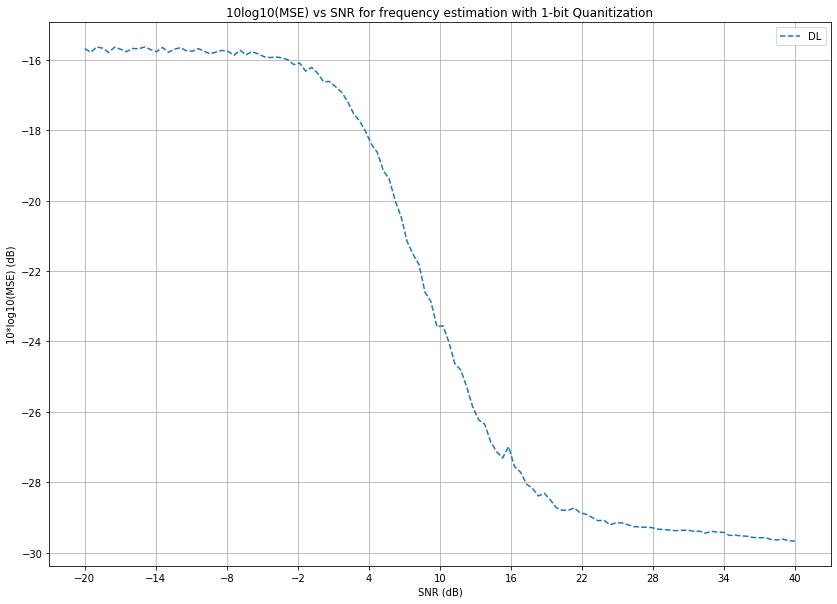

Starting C8_C16_C32_LSTM16_LSTM32_C64_L64_L128_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


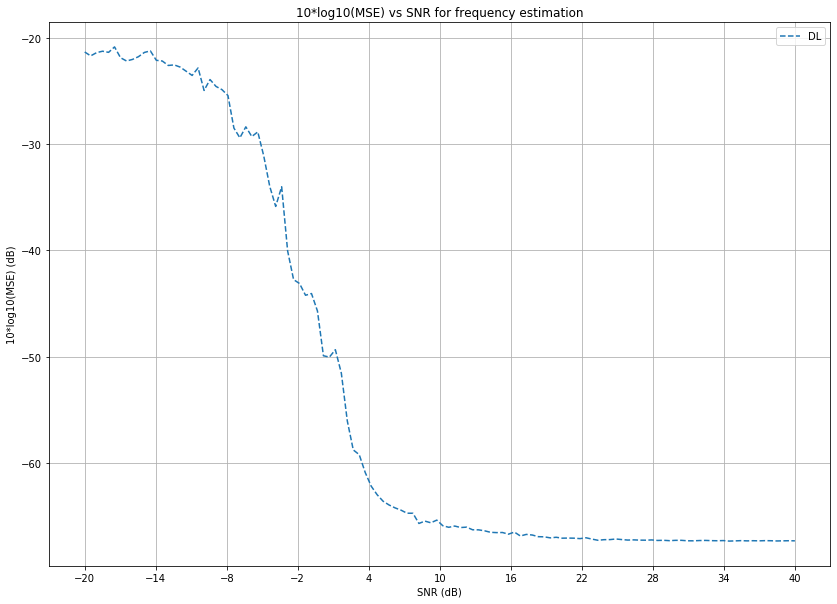

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


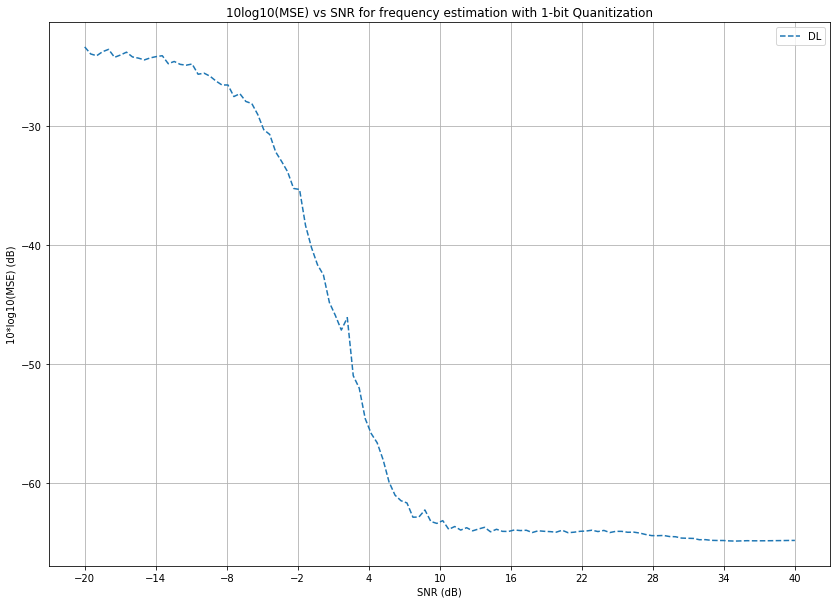

Starting Q_C16_C32_C64_C128_C256_L128_L64_snr_10-20.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


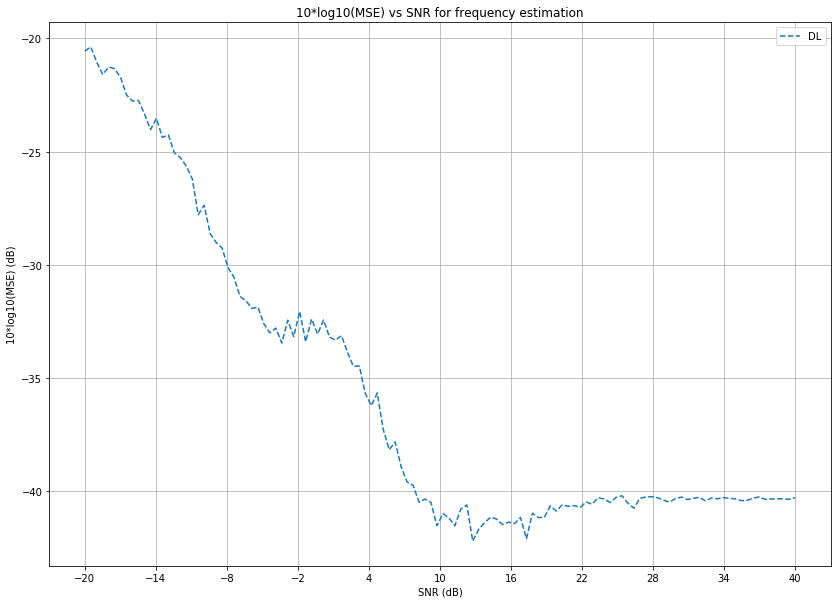

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


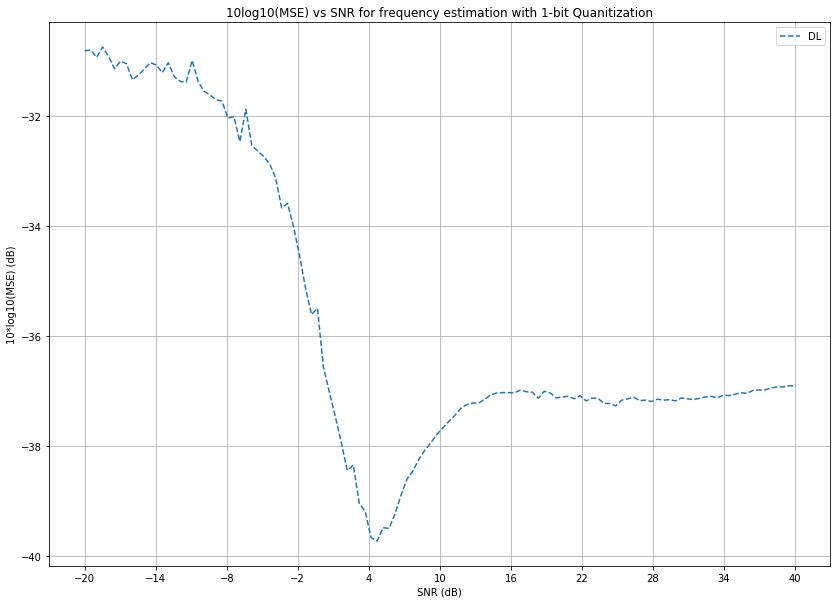

Starting L64_Res64-3_L128_Res128-2_L64_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


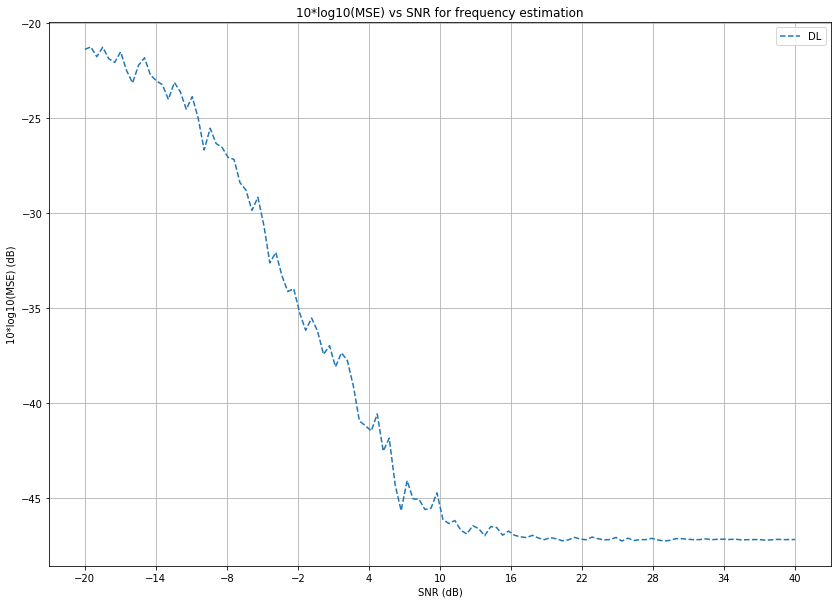

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


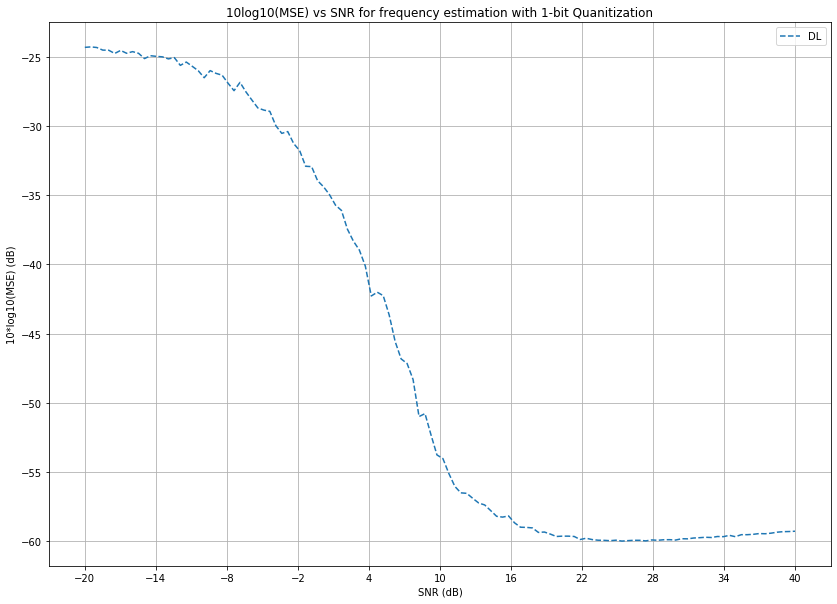

Starting Q_LSTM16_LSTM32_Res32-3_L128_L64_L32_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


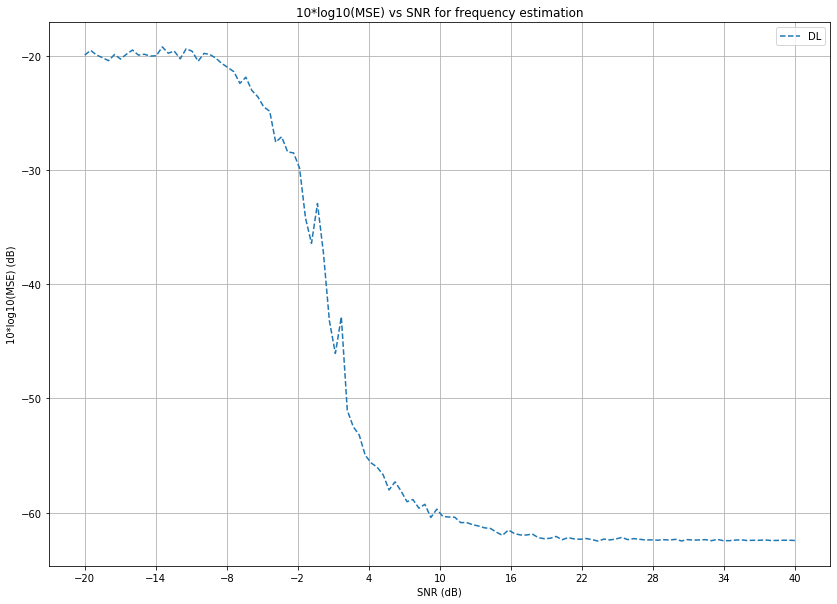

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


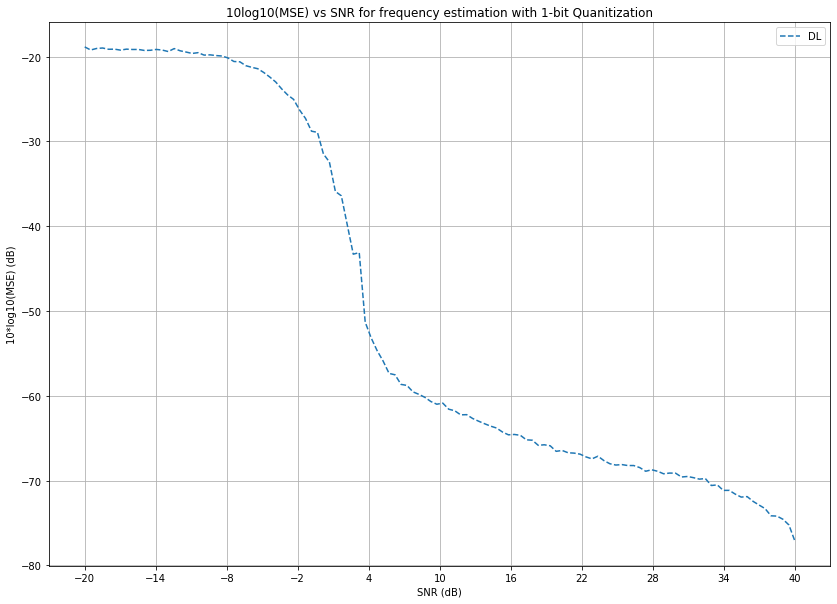

Starting Q_L16_L32_L64__L128_L256_L512_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


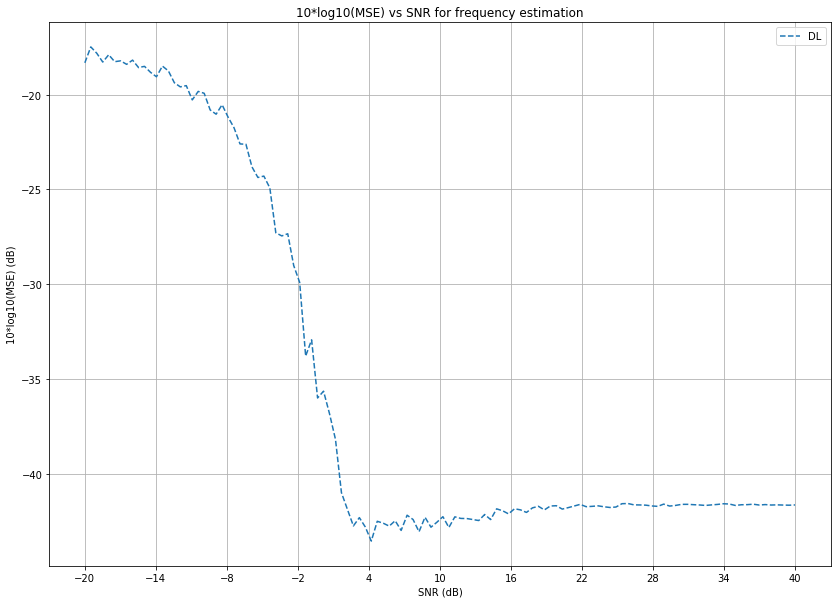

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


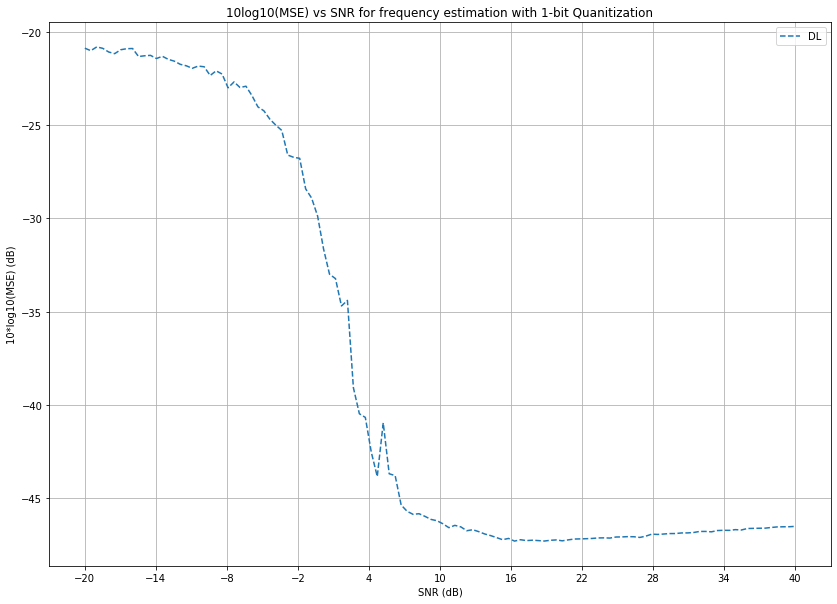

Starting Q_CB8_CB16_CB32_CB64_L128_L64_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part



If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.



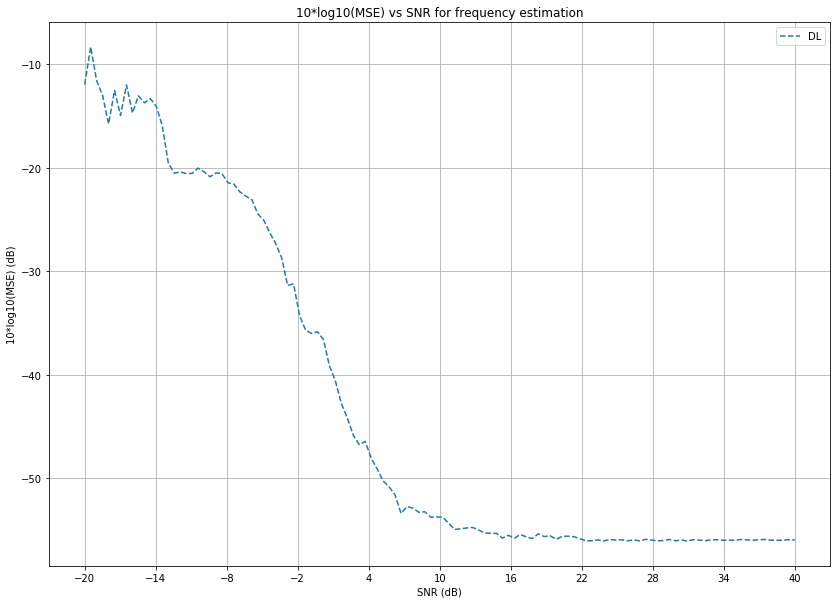

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


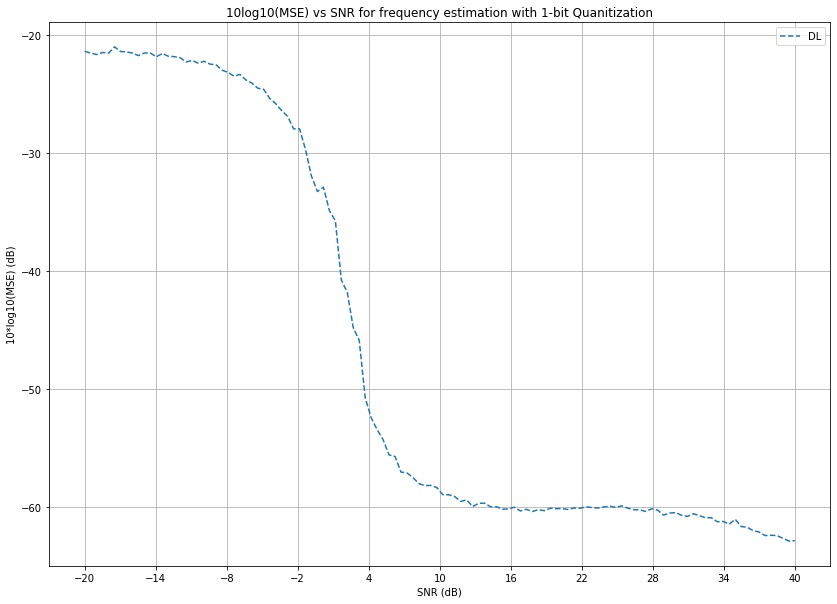

Starting Q_L128_L64_L32_L16_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part



If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.



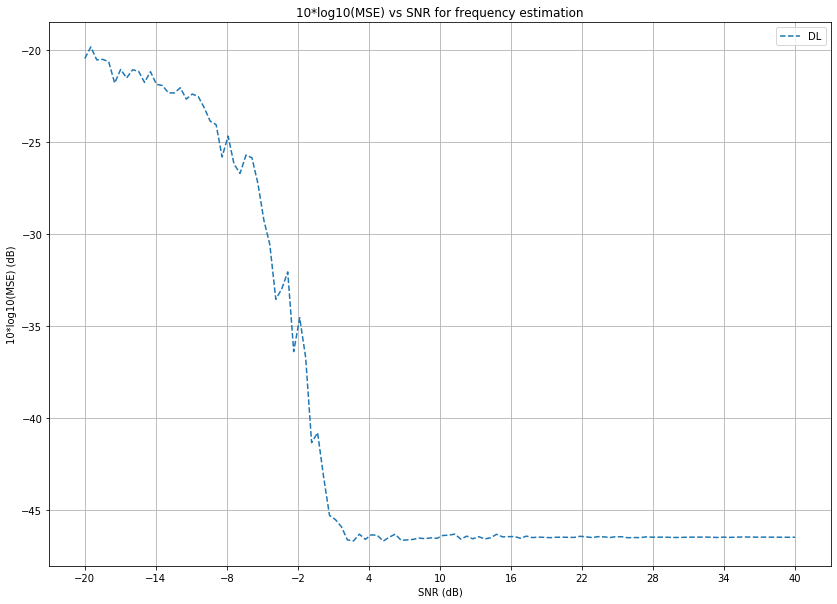

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


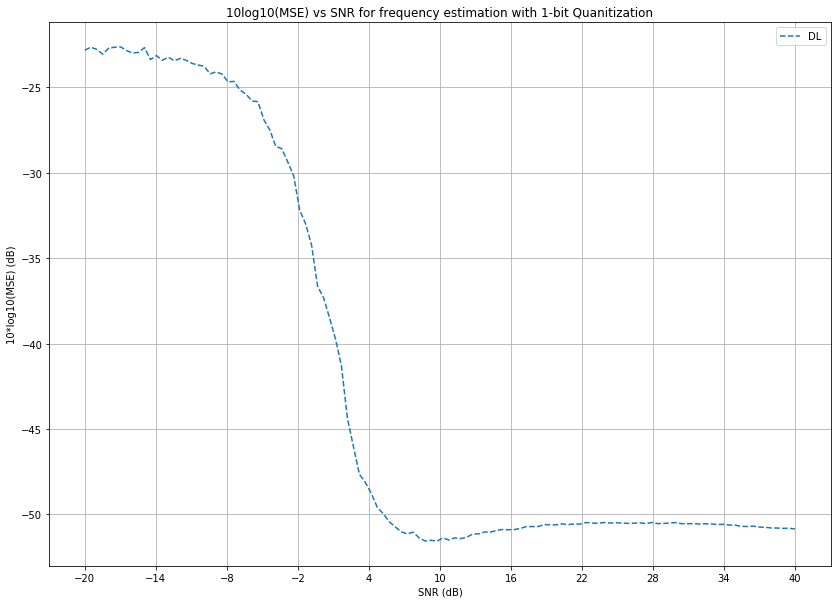

Starting Q_GRU16_GRU32_GRU64_L128_L64_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


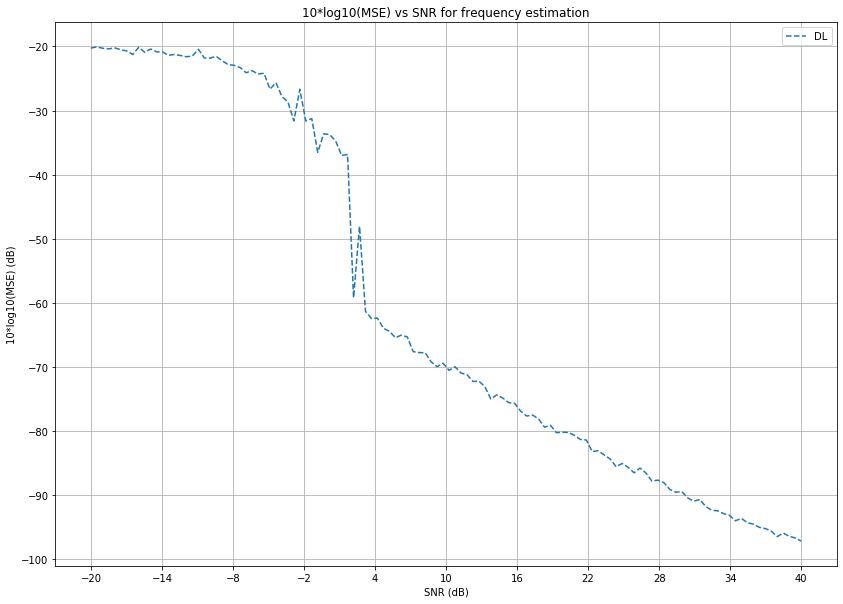

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


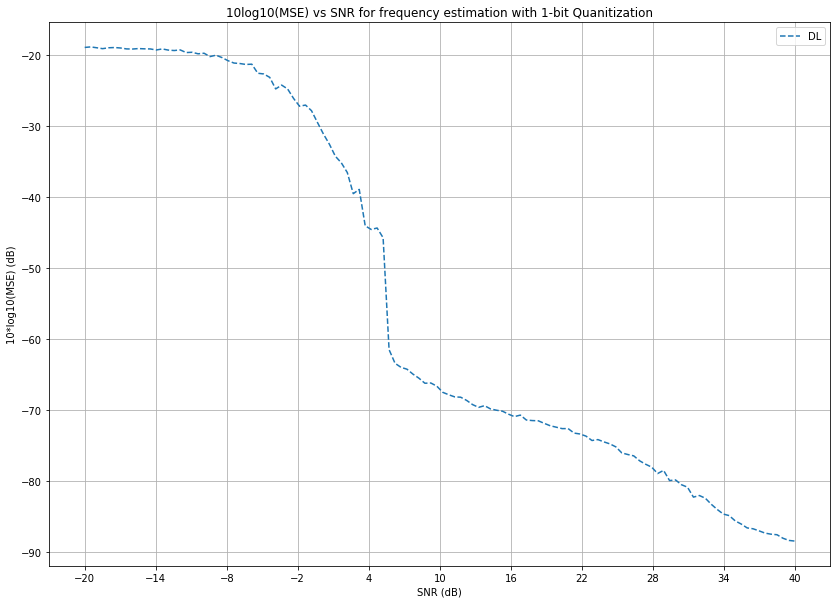

Starting Q_LSTM16_LSTM32_Res32-3_L128_L64_L32_snr_10-20.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


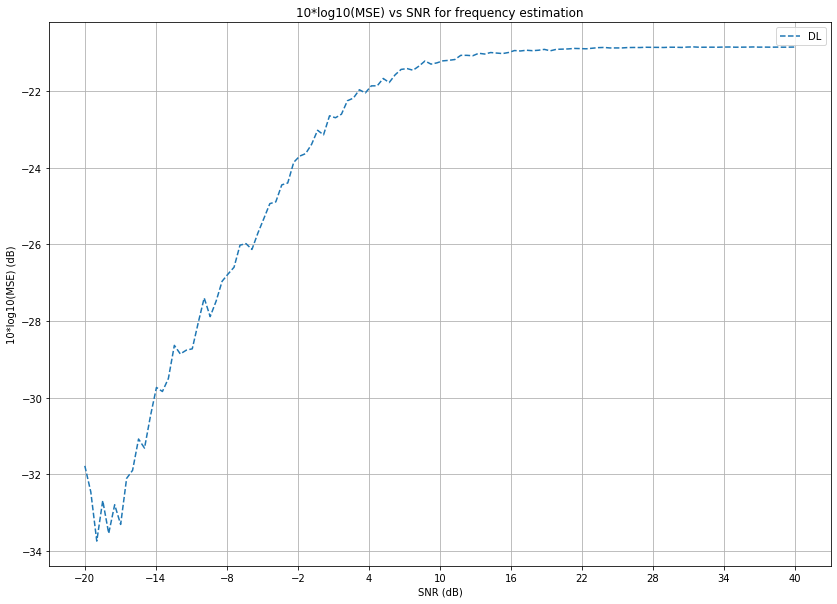

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


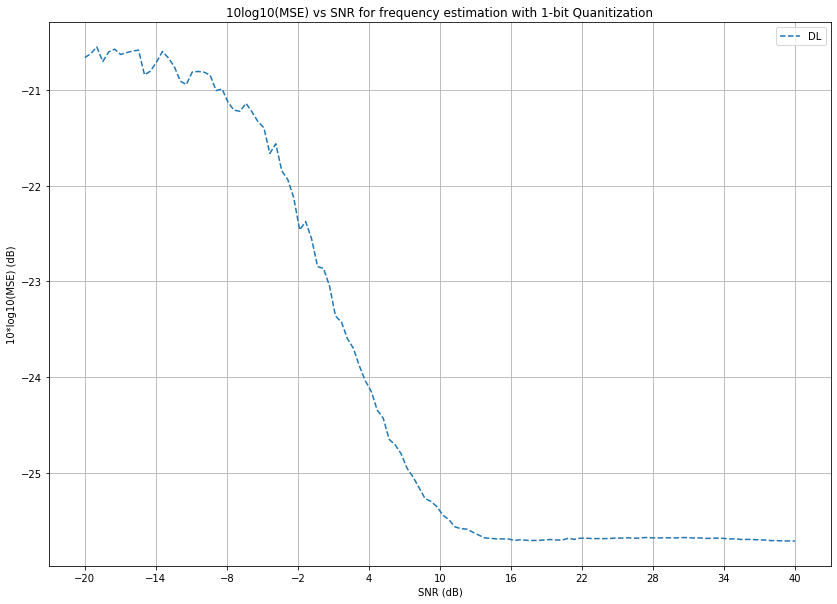

Starting Q_LSTM16_LSTM32_LSTM64_L128_L64_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


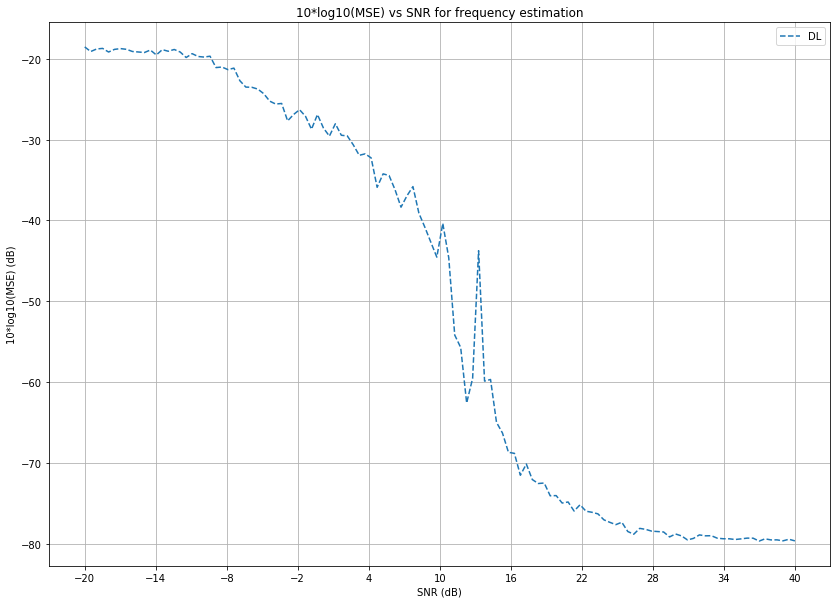

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


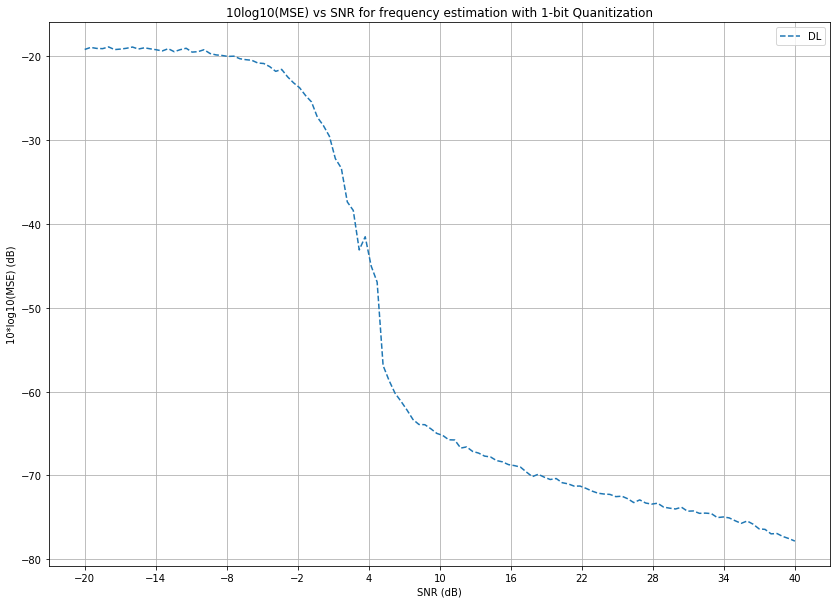

Starting LSTM16_LSTM32_LSTM64_Res64-3_L32_Res32-3_L16_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


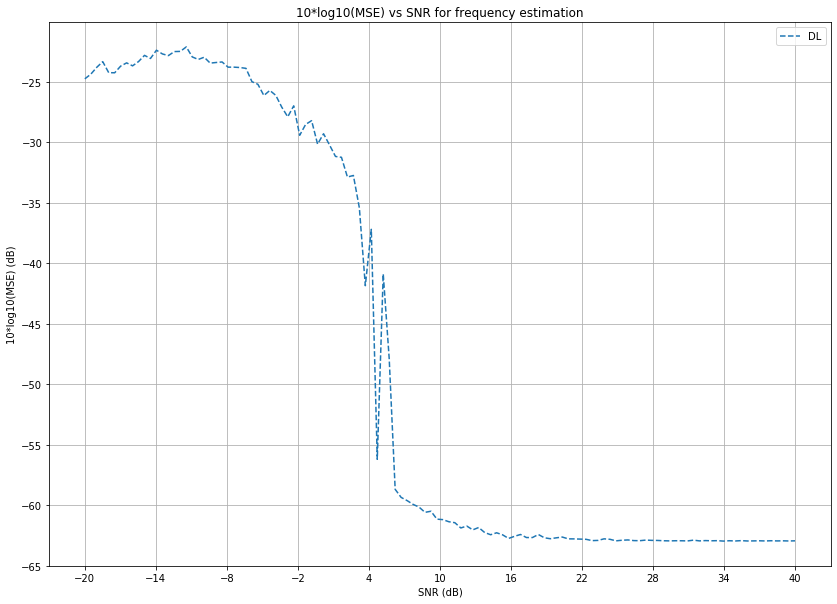

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


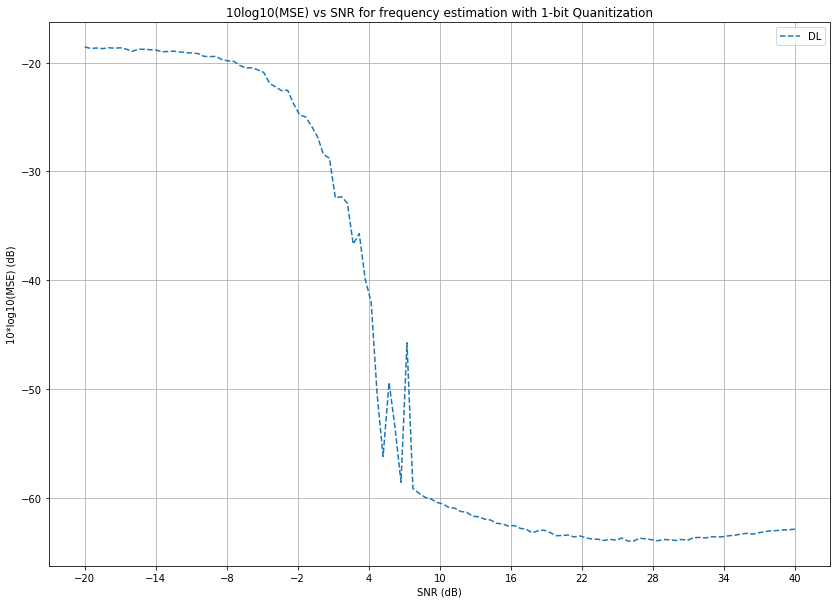

Starting C8_C16_C32_C64_C128_L128_L64_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


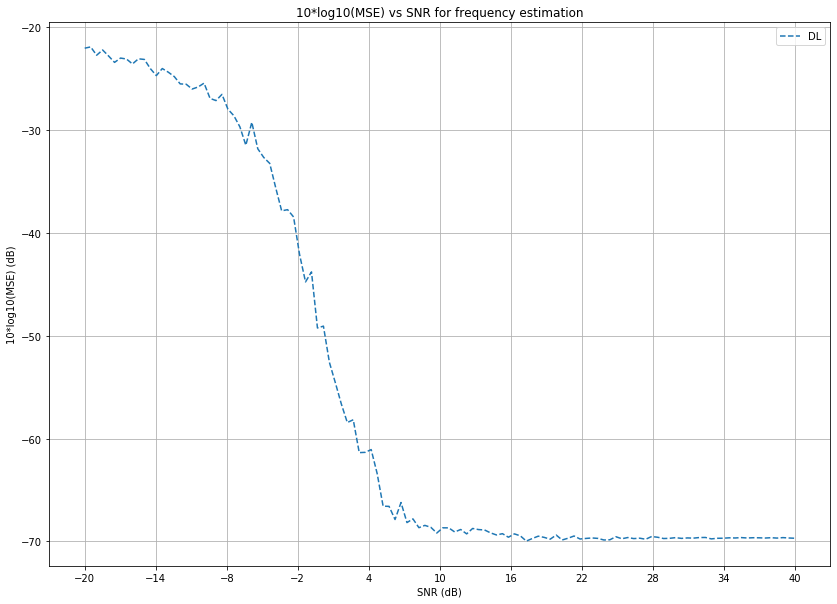

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


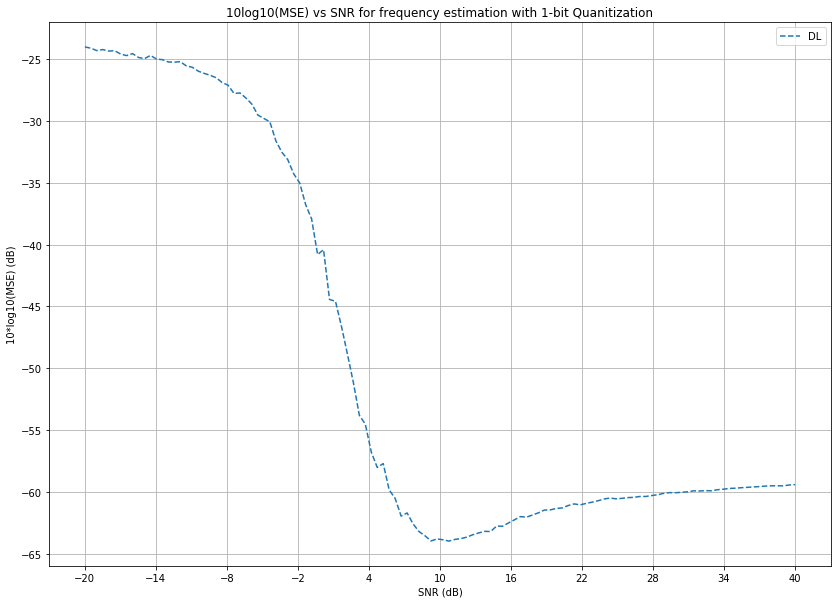

Working on n=128
Starting Q_C16_C32_C64_C128_C256_L128_L64_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


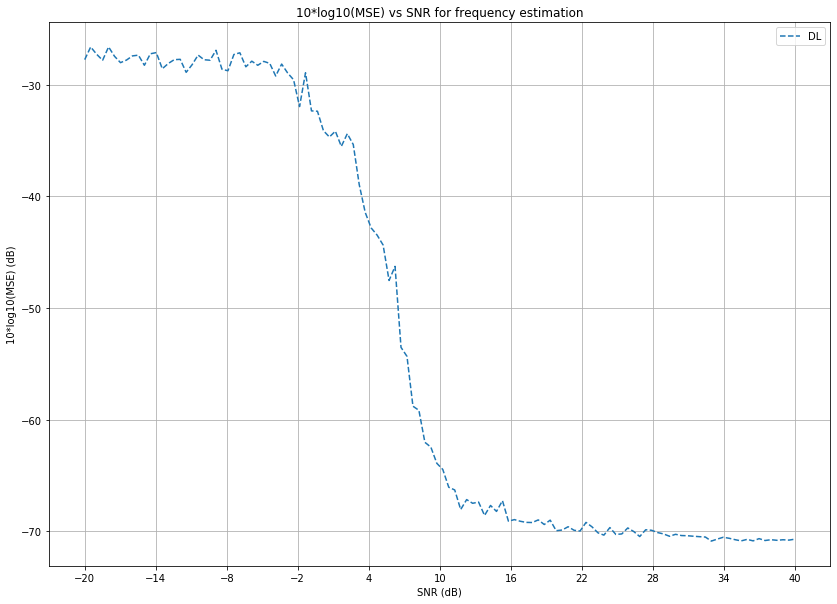

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


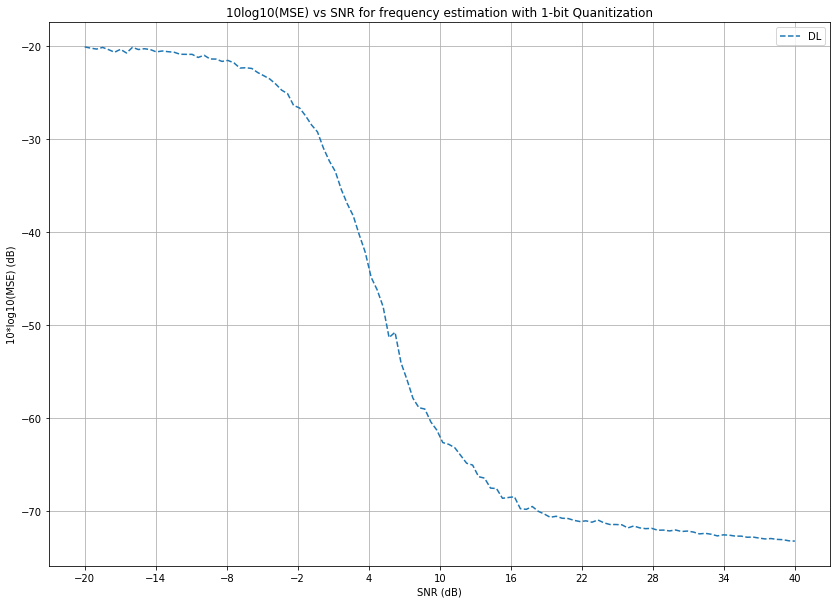

Starting Q_L64_Res64-3_L128_Res128-2_L64_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


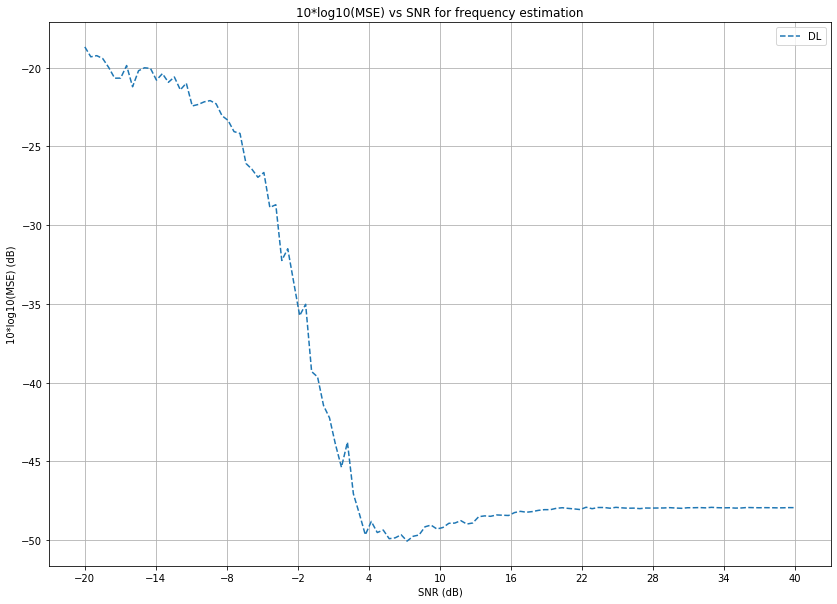

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


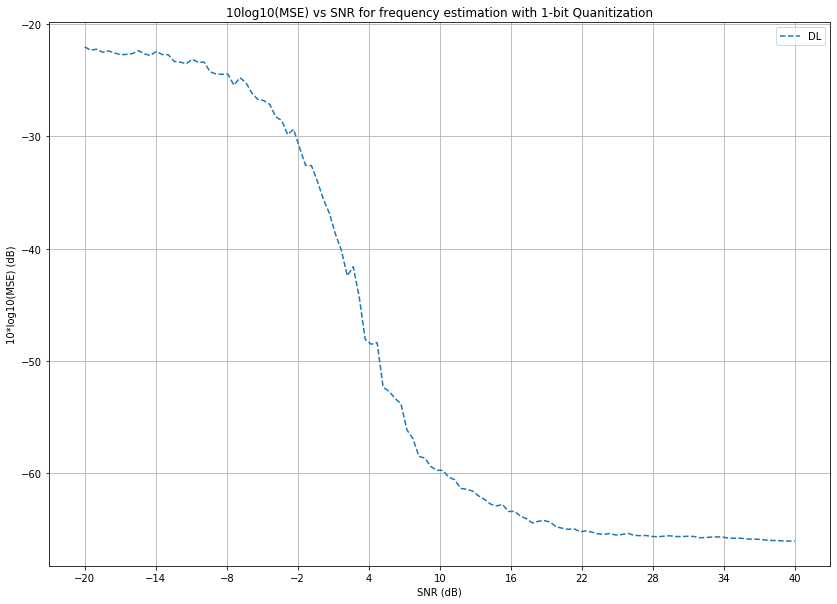

Starting Q_L64_Res64-3_L128_Res128-2_L64_snr_10-20.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


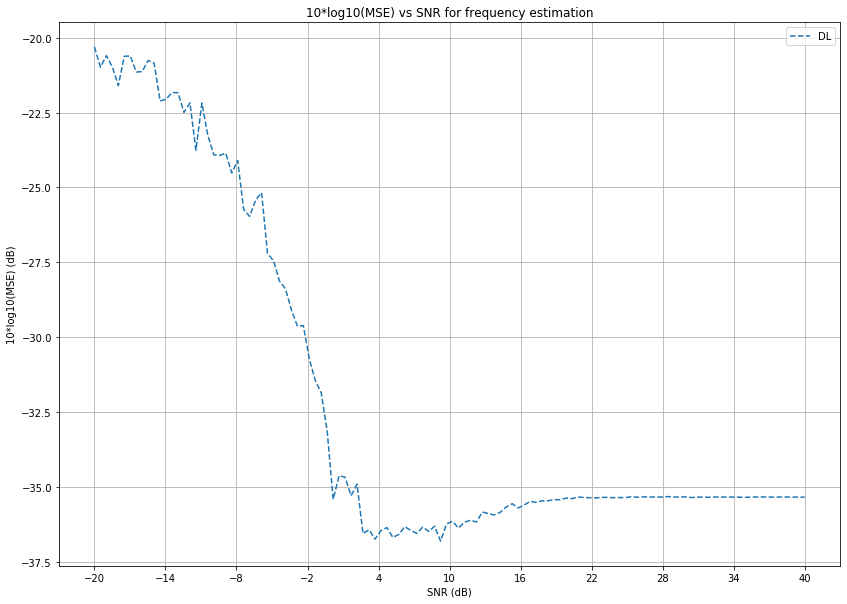

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


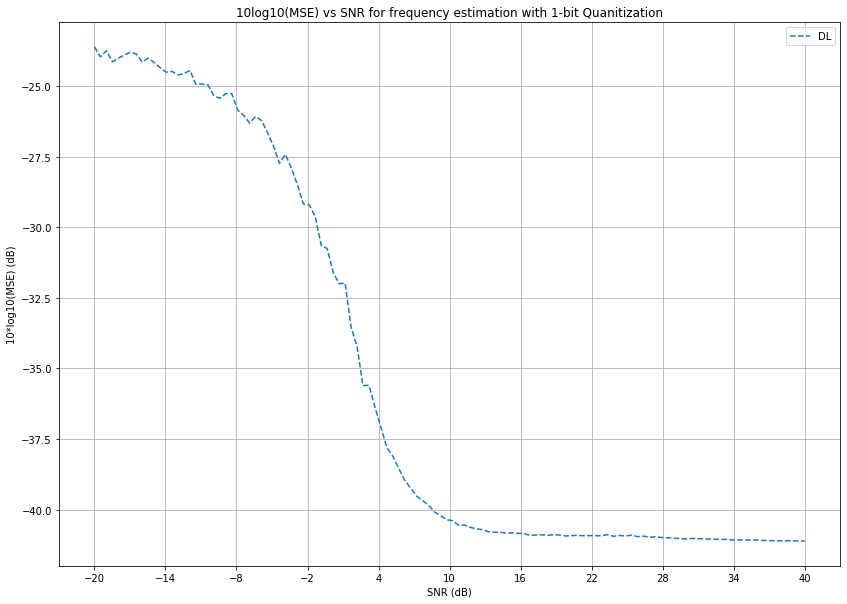

Starting L64_Res64-4_L128_Res128-4_L256_Res256-4_L64_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


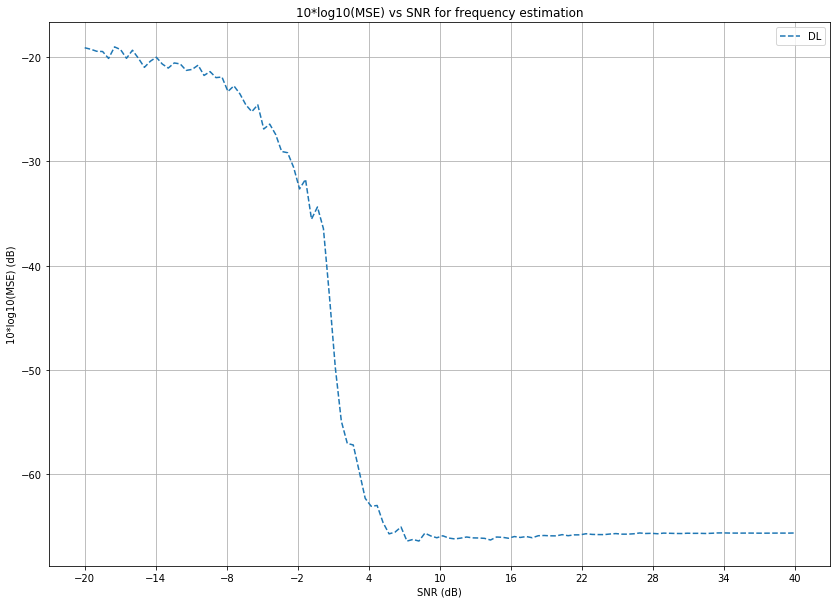

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


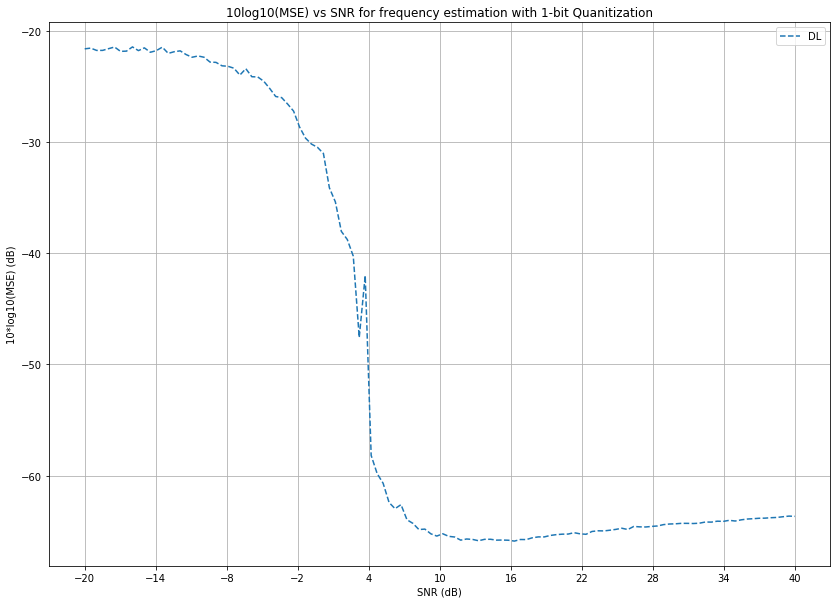

Starting C8_C16_C32_C64_C128_C256_L128_L64_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


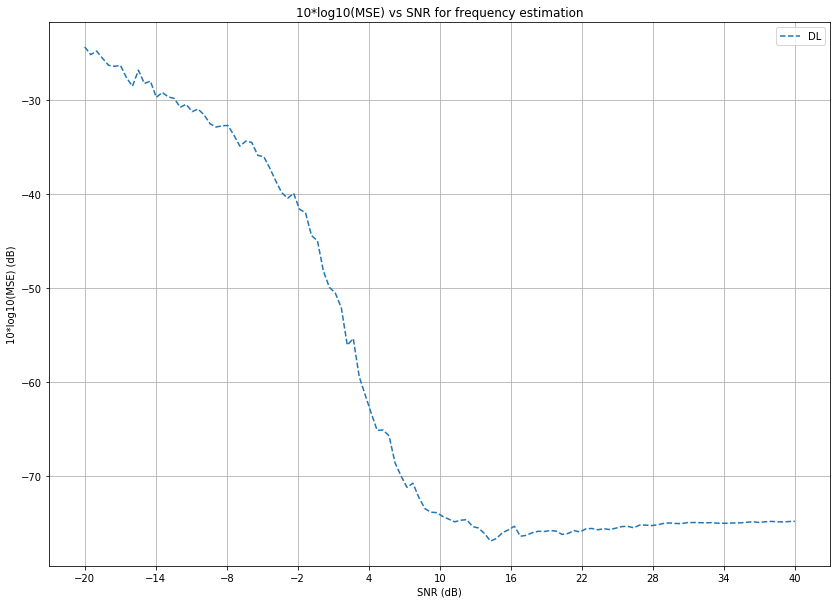

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


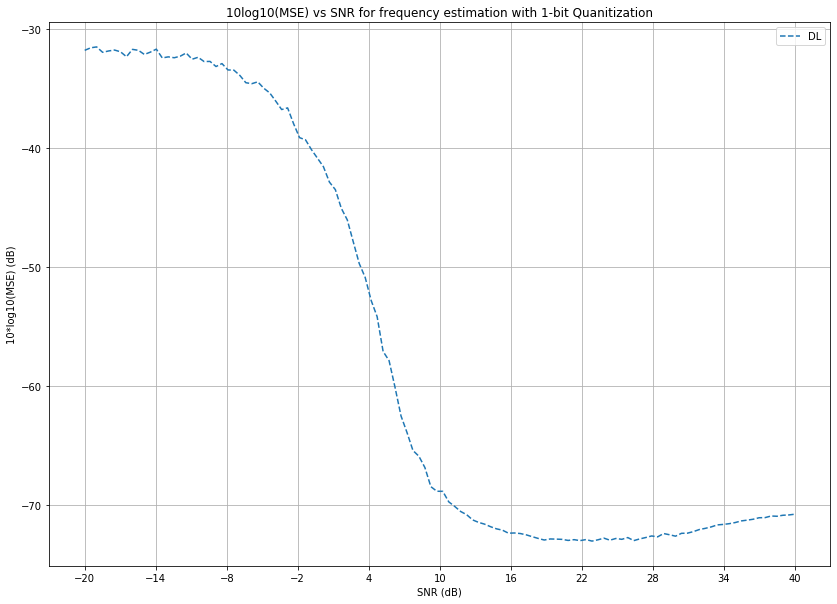

Starting Q_C8_C16_C32_LSTM16_LSTM32_C64_L64_L128_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


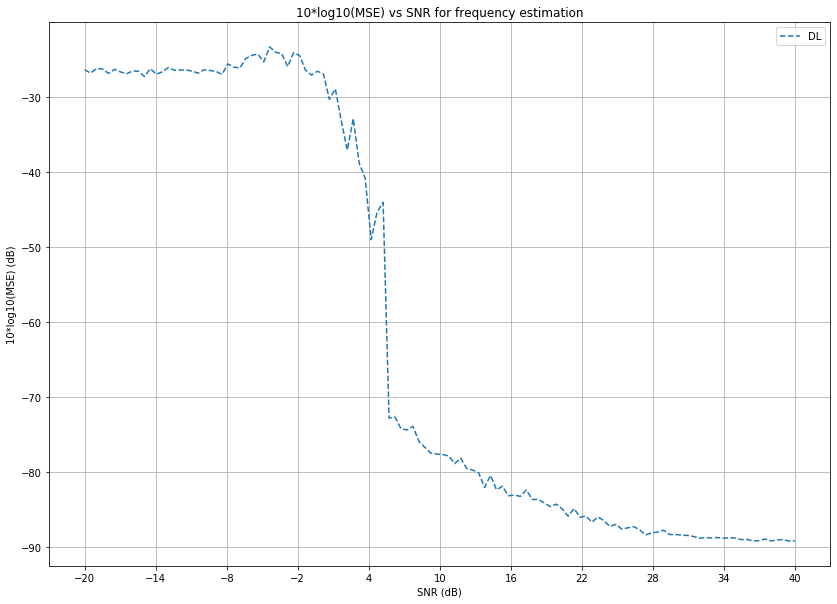

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


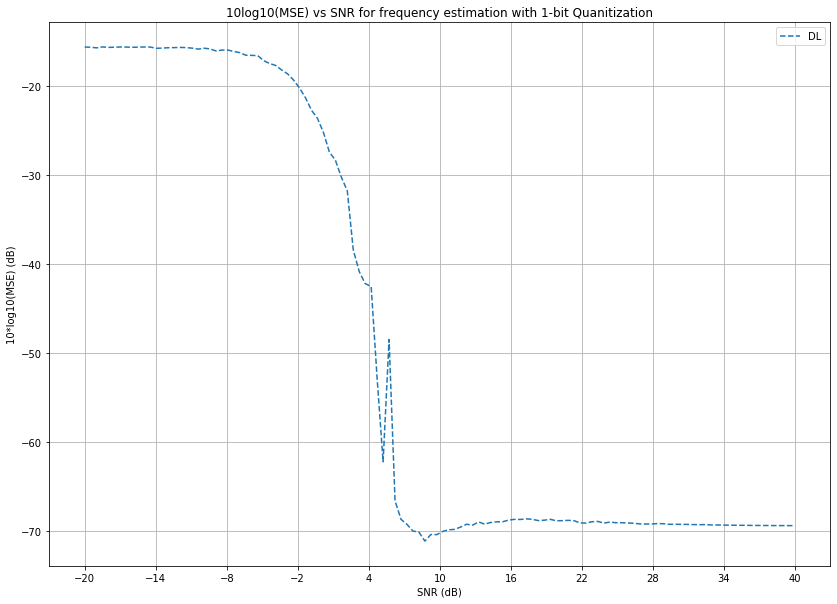

Starting C8_C16_C32_LSTM16_LSTM32_C64_L64_L128_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


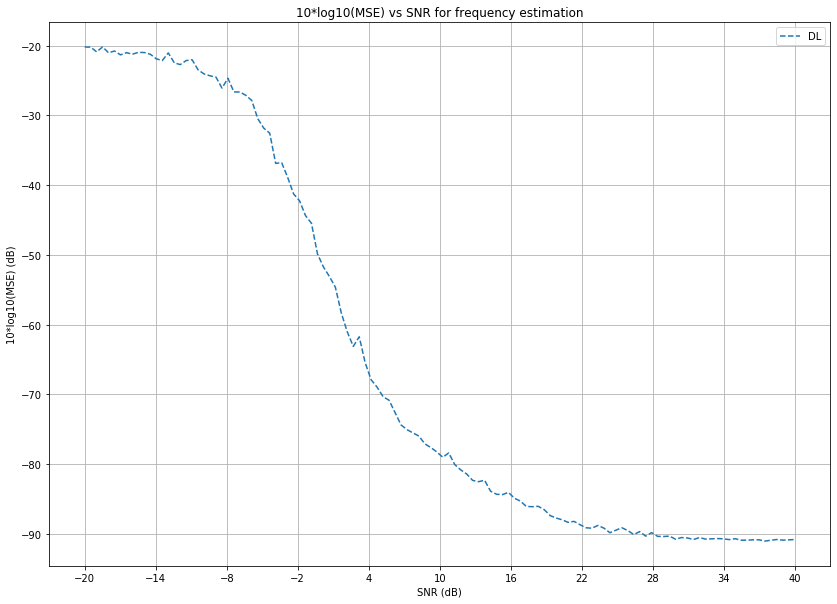

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


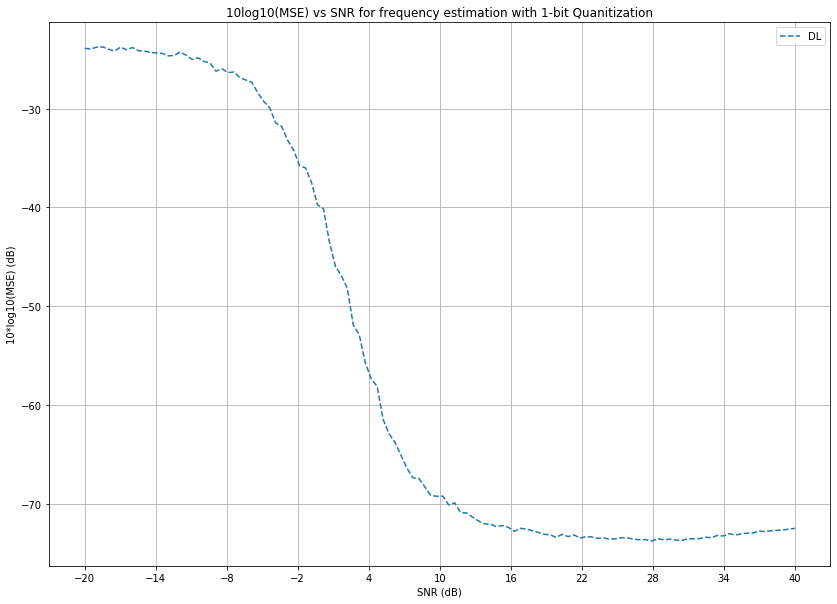

Starting LSTM16_LSTM32_LSTM64_L128_L64_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


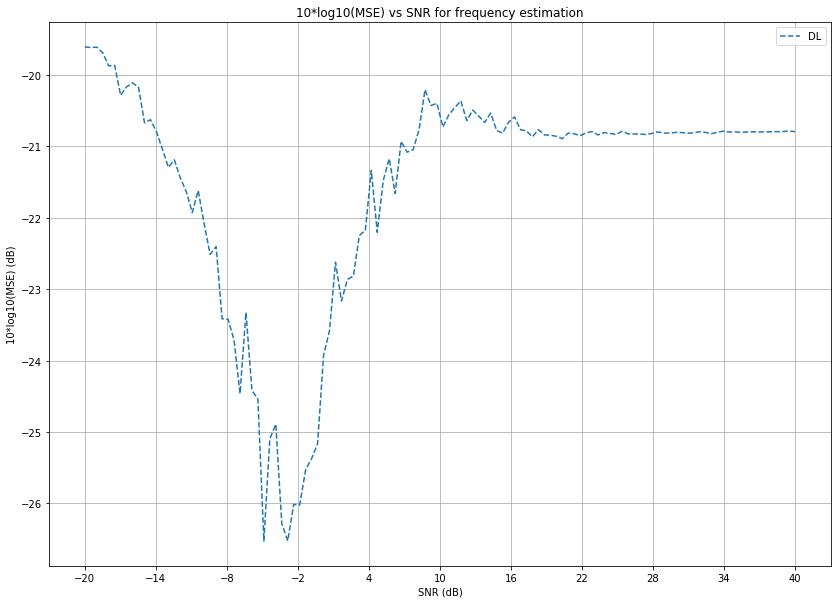

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


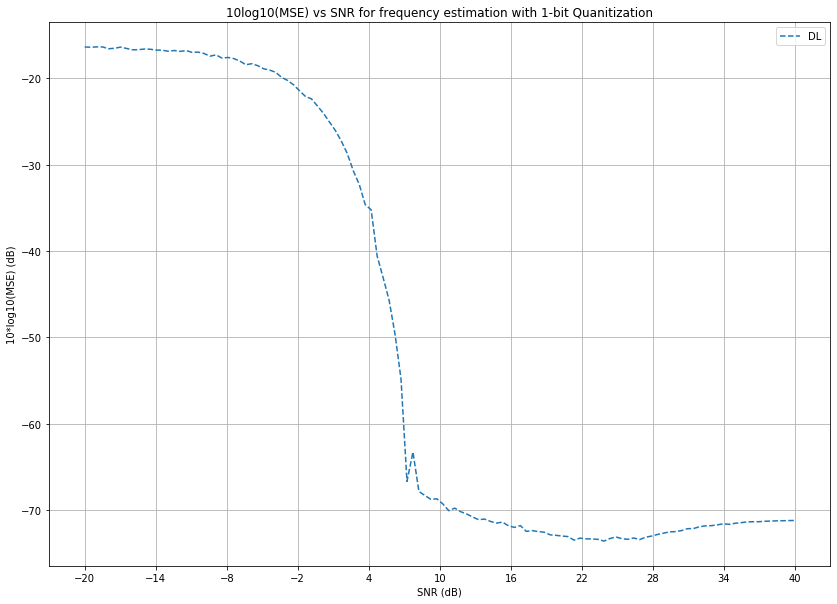

Starting Q_C16_C32_C64_C128_C256_L128_L64_snr_10-20.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


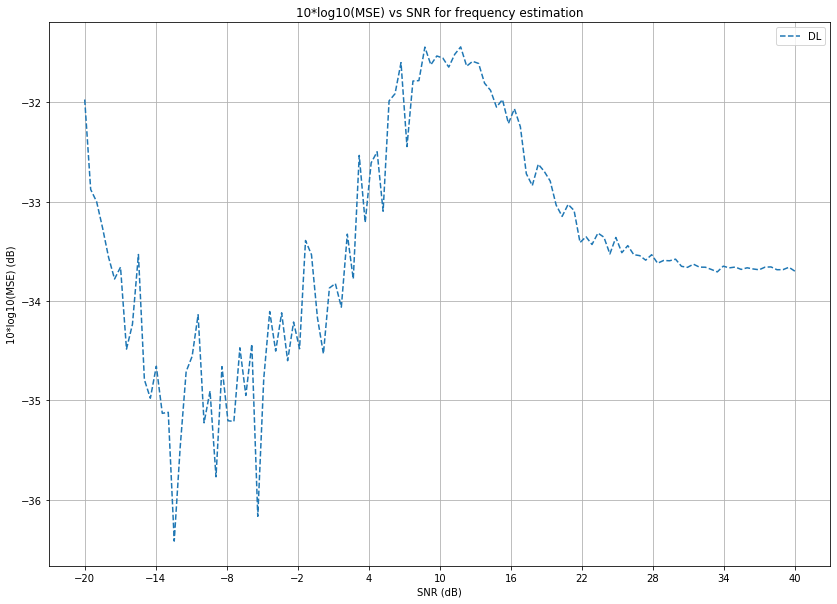

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


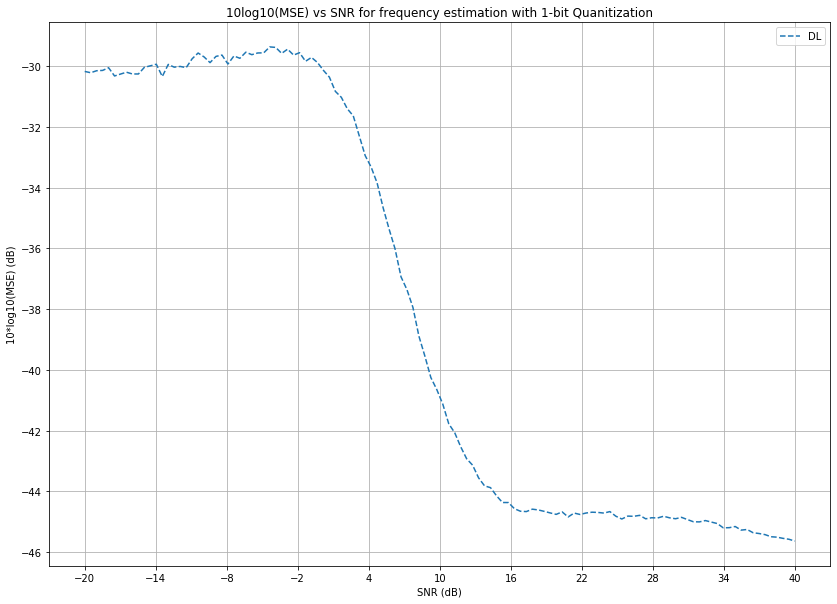

Starting L64_Res64-3_L128_Res128-2_L64_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


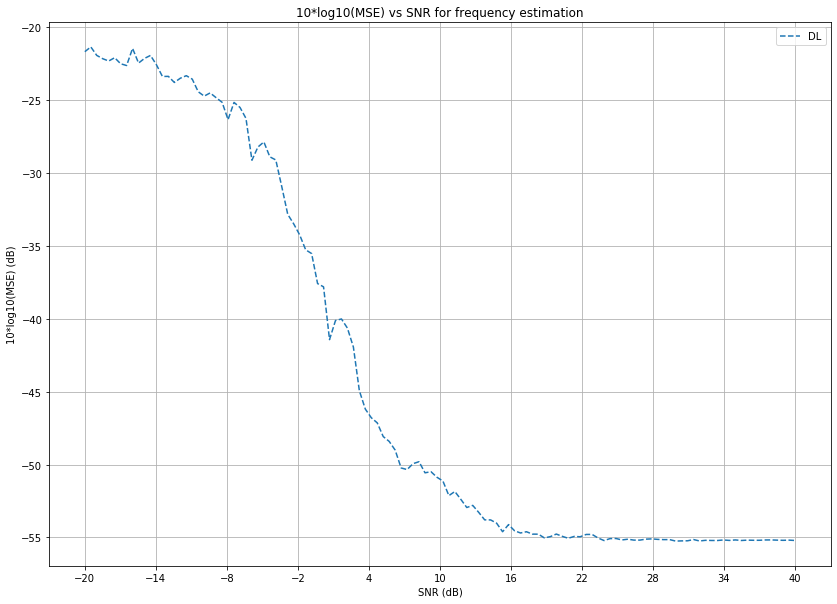

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


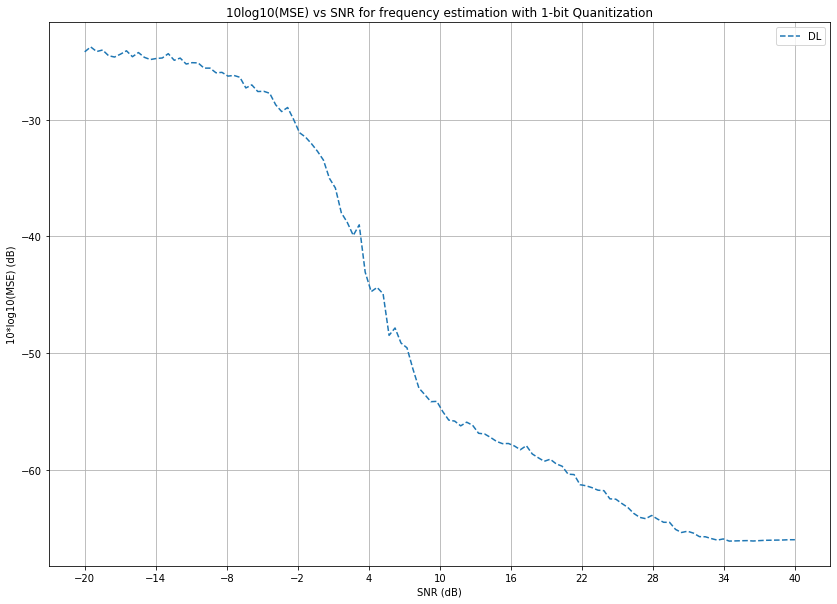

Starting Q_C8_C16_C32_C64_C128_L128_L64_snr_10-20.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part



If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.



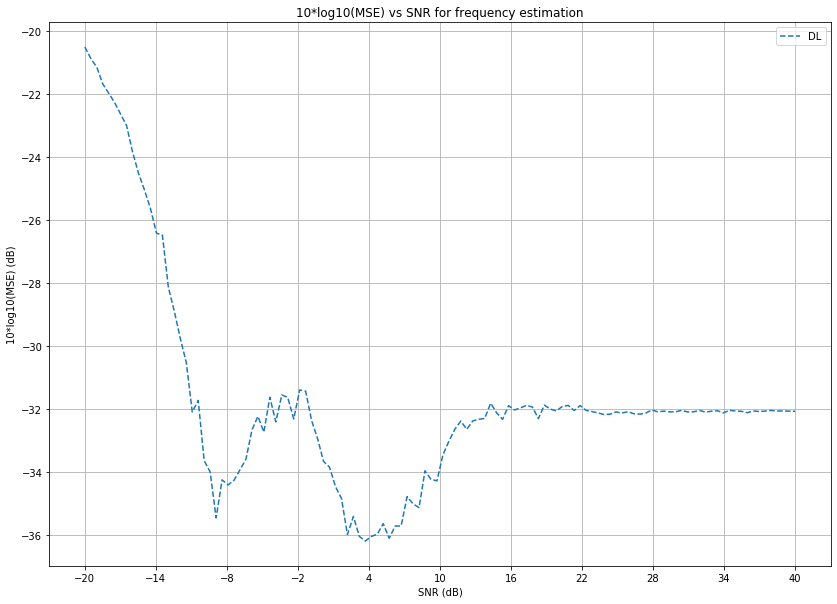

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


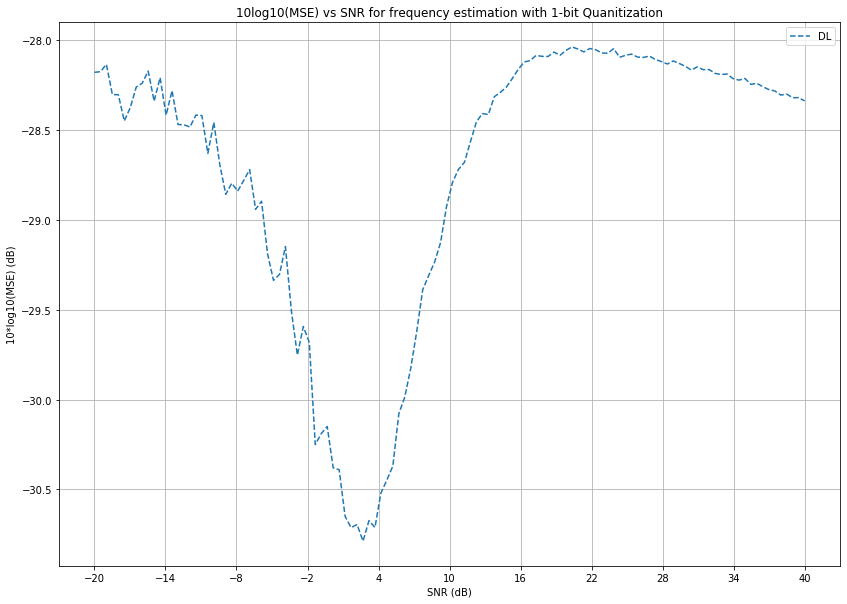

Starting L16_L32_L64__L128_L256_L512_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


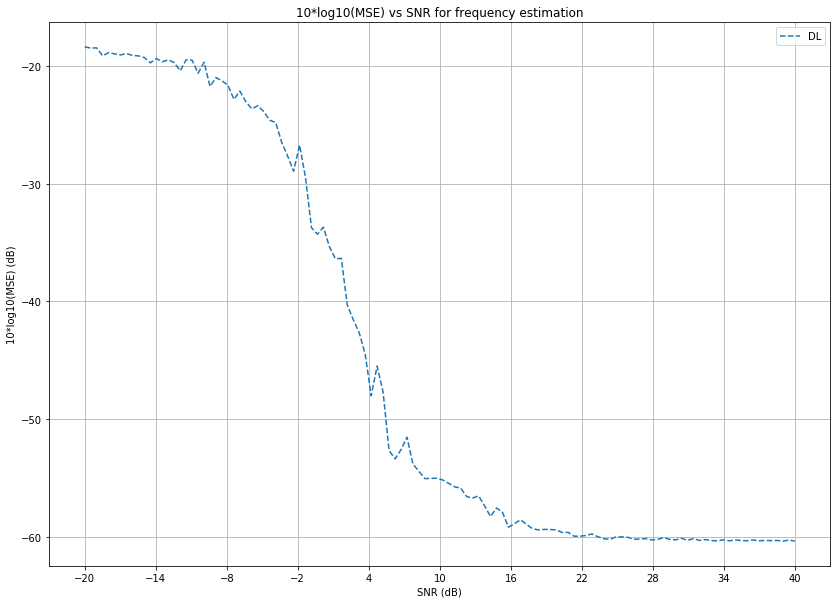

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


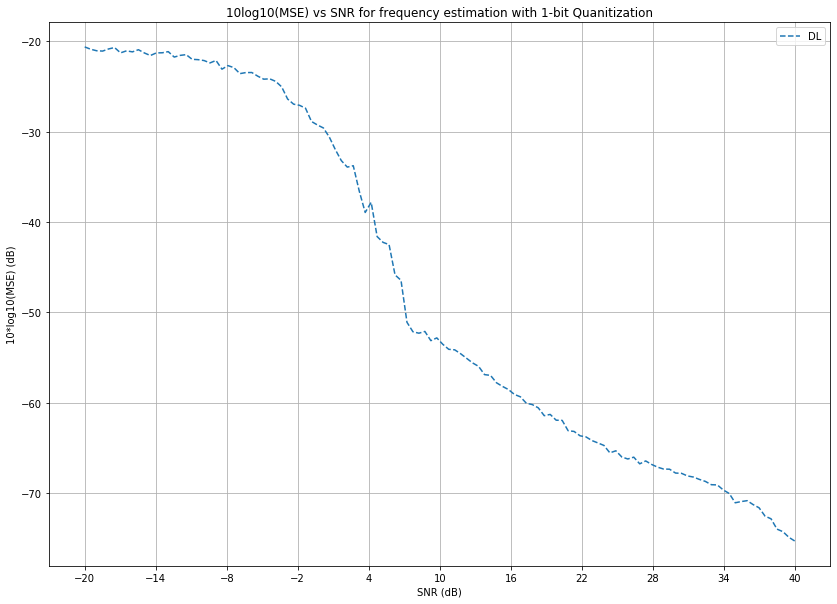

Starting C8_C16_C32_LSTM16_LSTM32_C64_L64_L128_snr_10-20.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


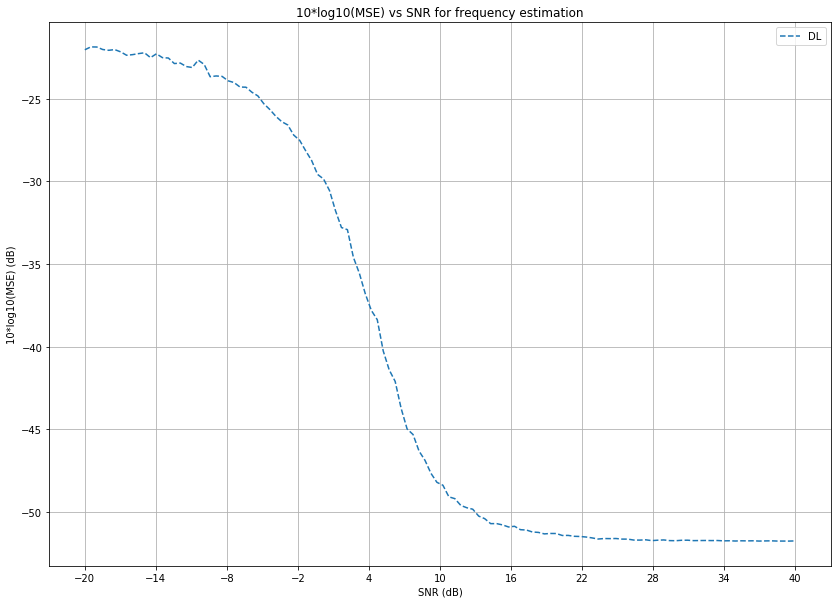

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


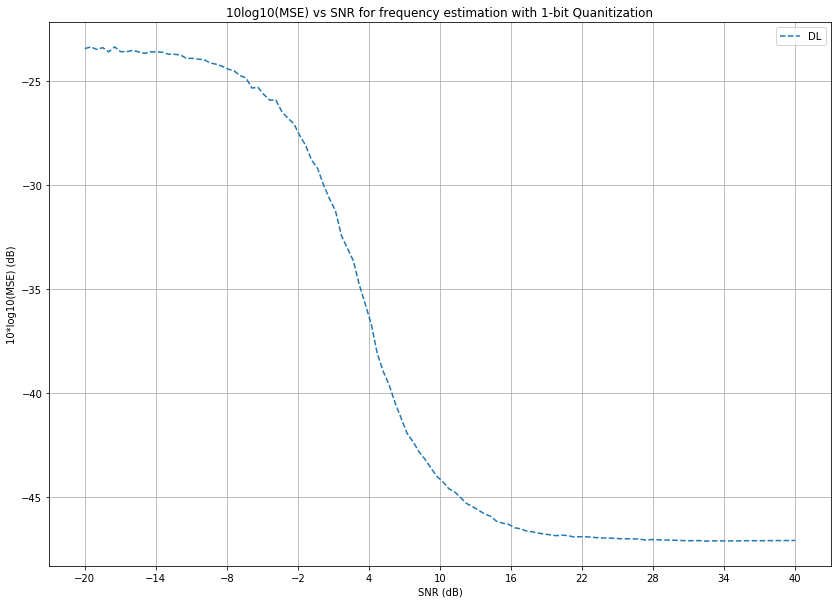

Starting C8_C16_C32_L64_Res64-3_L128_Res128-2_L64_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


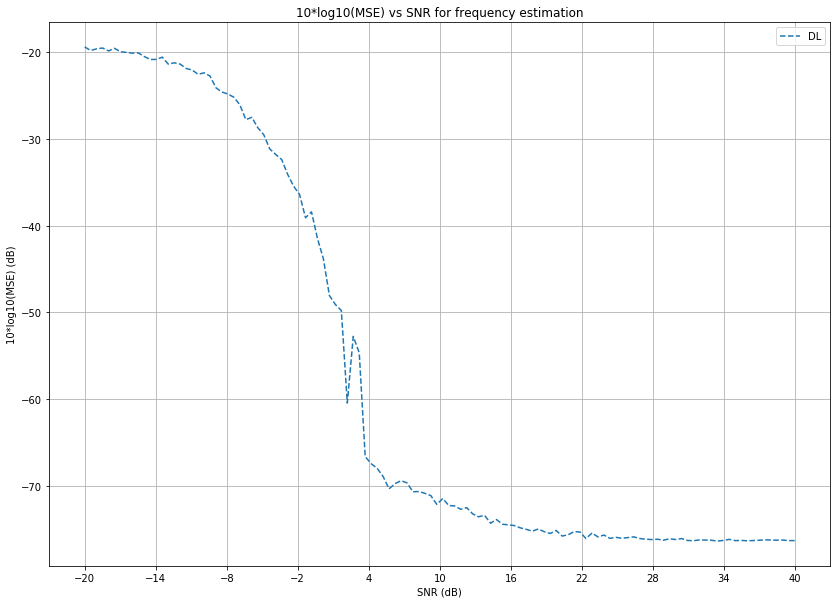

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


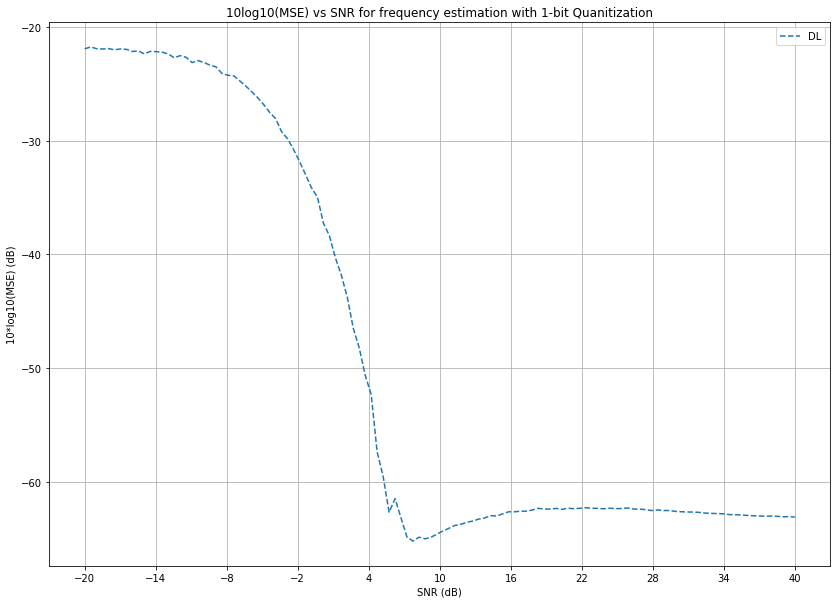

Starting LSTM16_LSTM32_Res32-3_L128_L64_snr_10-20.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


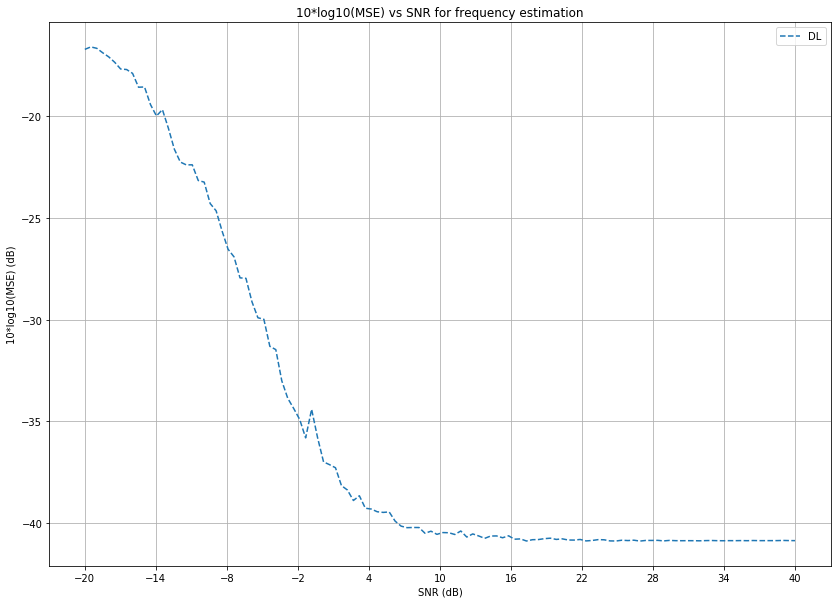

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


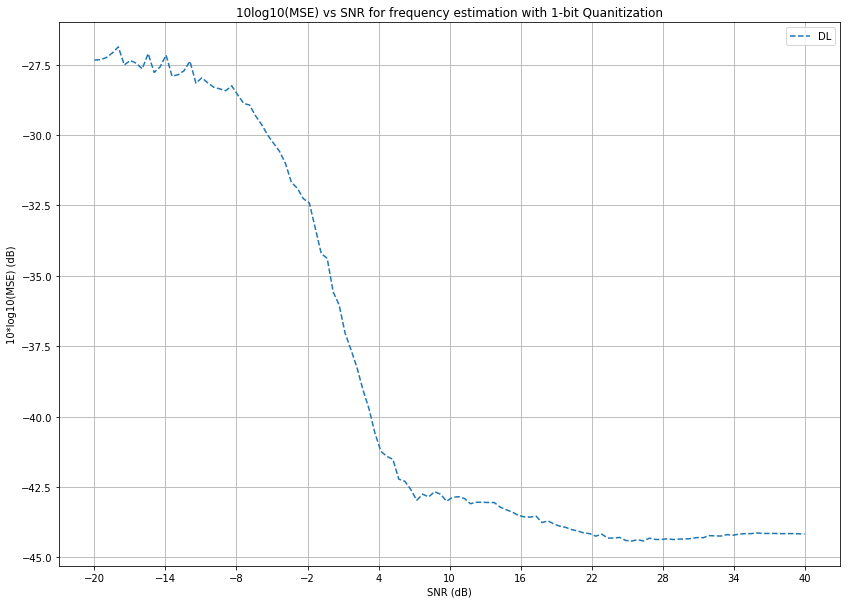

Starting M-Q_C16_C32_C64_C128_C256_L128_L64_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


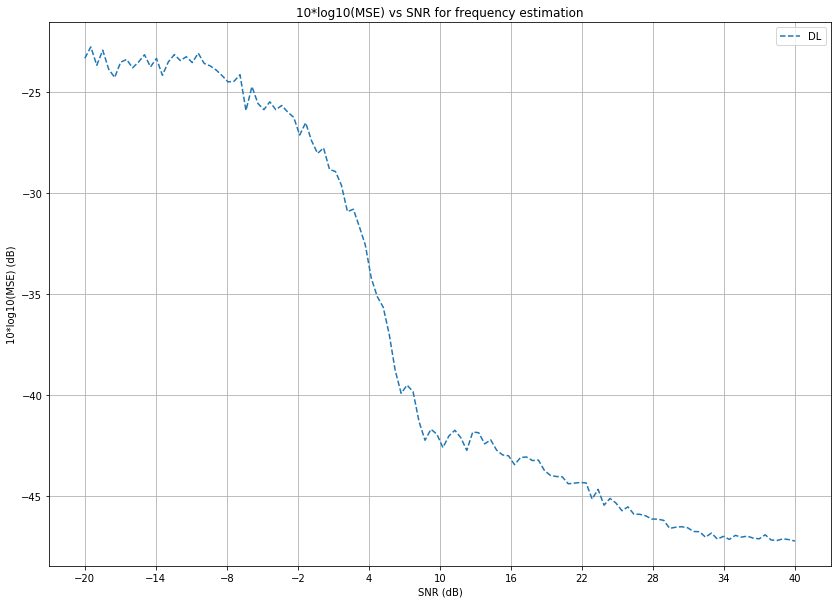

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


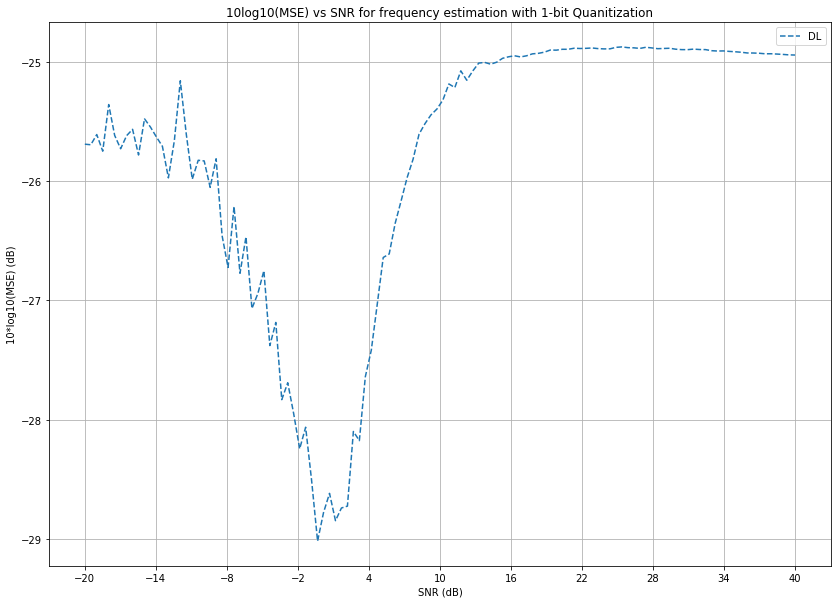

Starting Q_CB8_CB16_CB32_CB64_L128_L64_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part



If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.



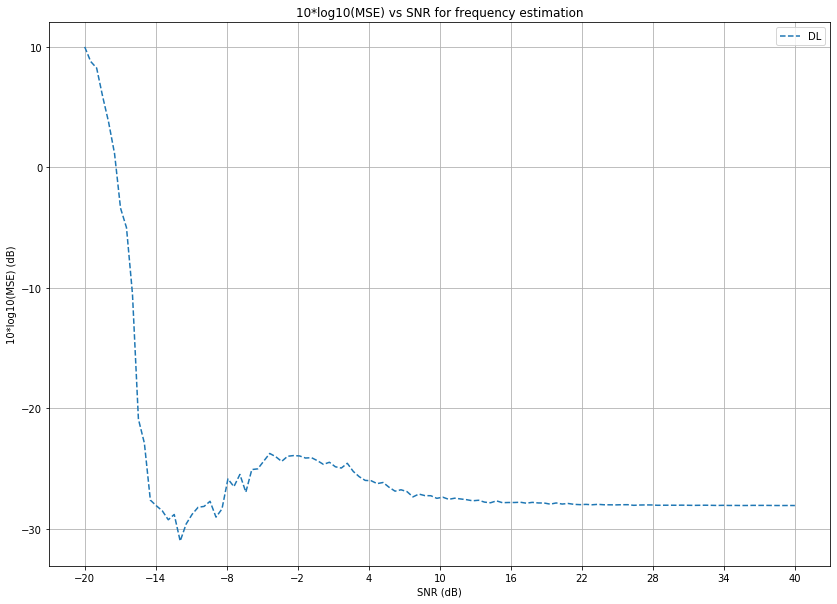

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


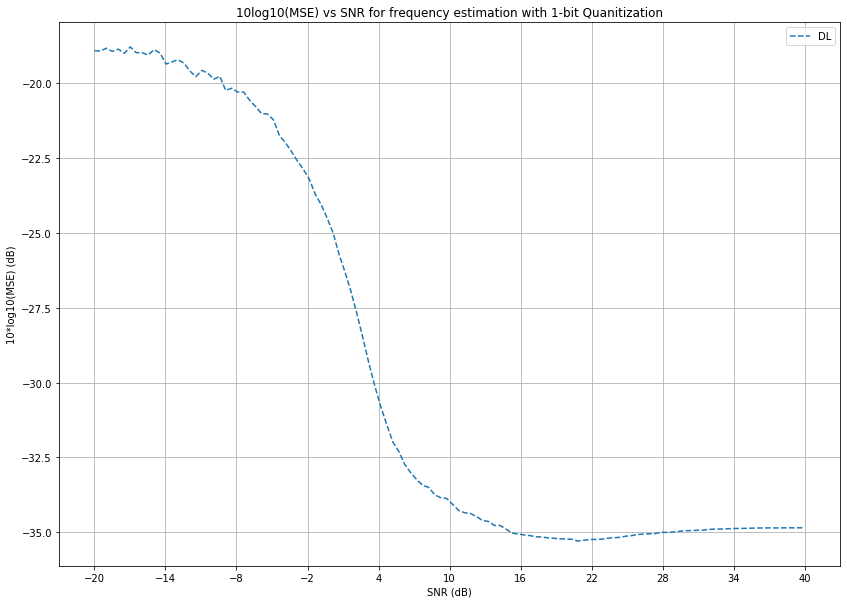

Starting Q_LSTM16_LSTM32_Res32-3_L128_L64_L32_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


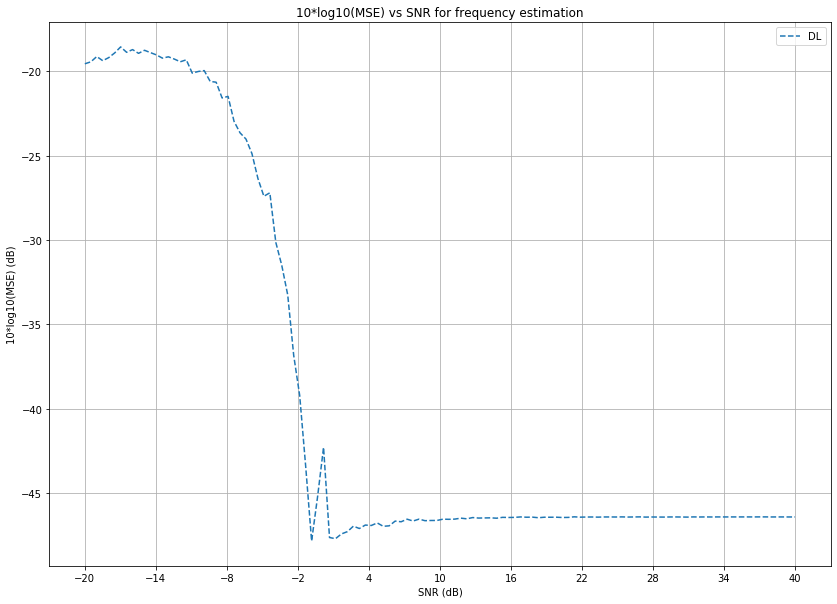

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


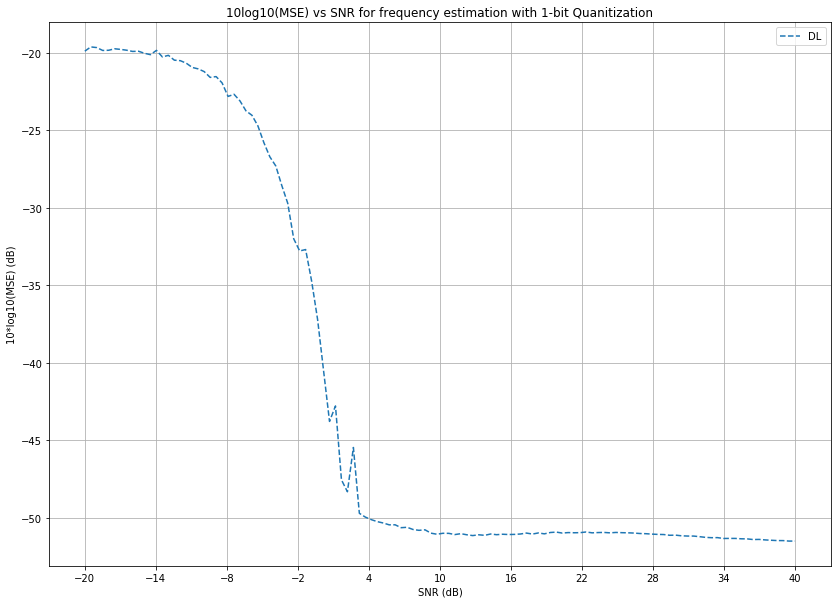

Starting Q_LSTM16_LSTM32_Res32-3_L128_L64_L32_snr_10-20.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


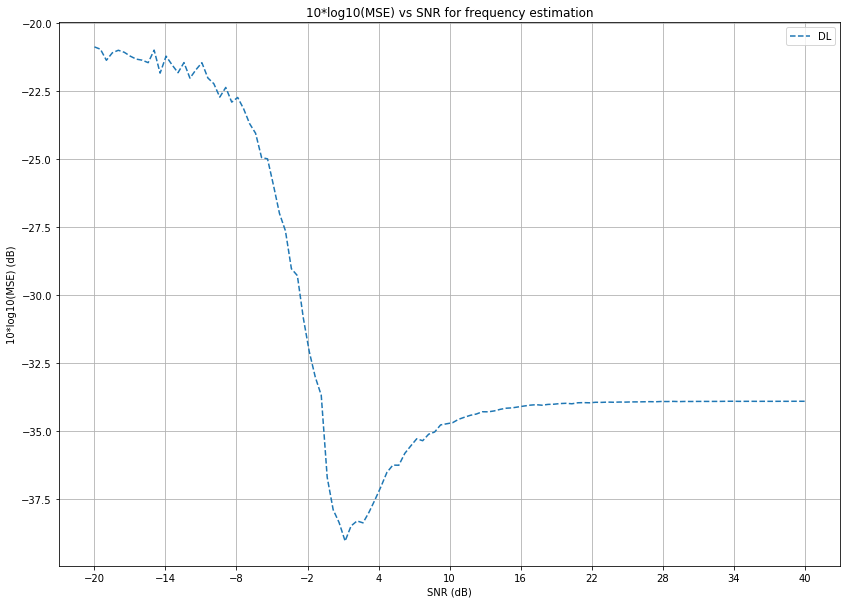

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


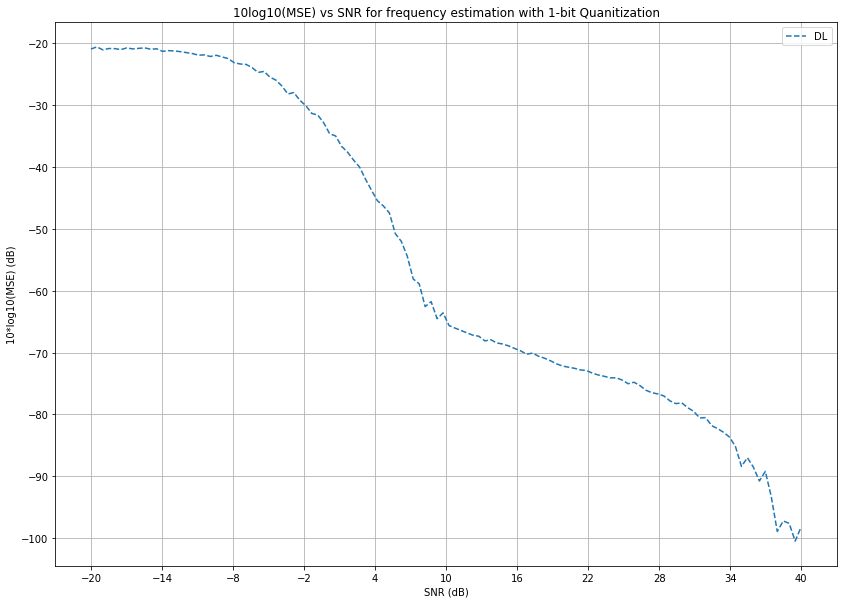

Starting Q_L128_L64_L32_L16_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part



If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.



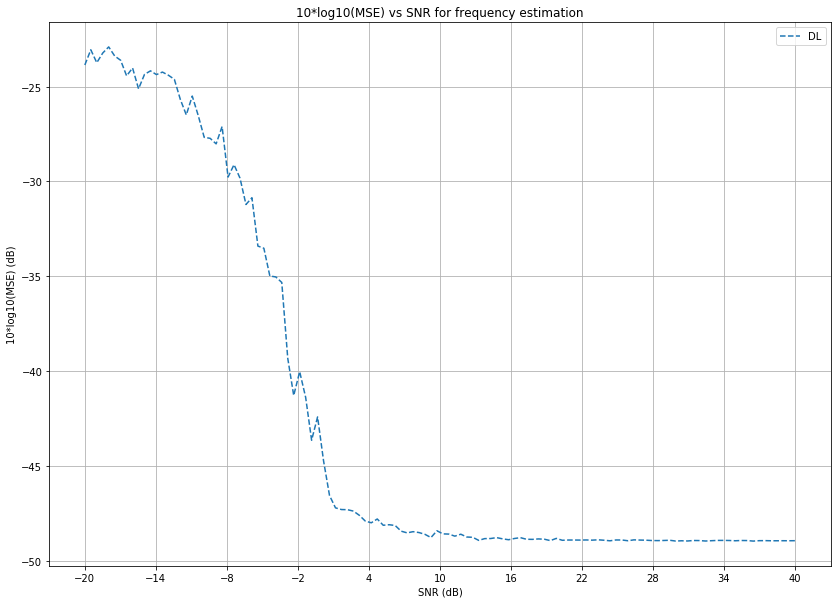

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


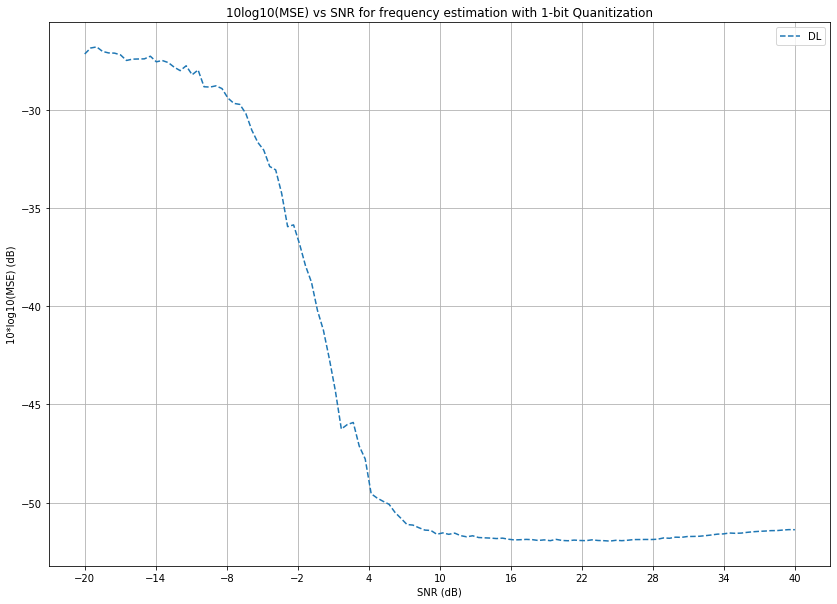

Starting Q_L16_L32_L64__L128_L256_L512_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


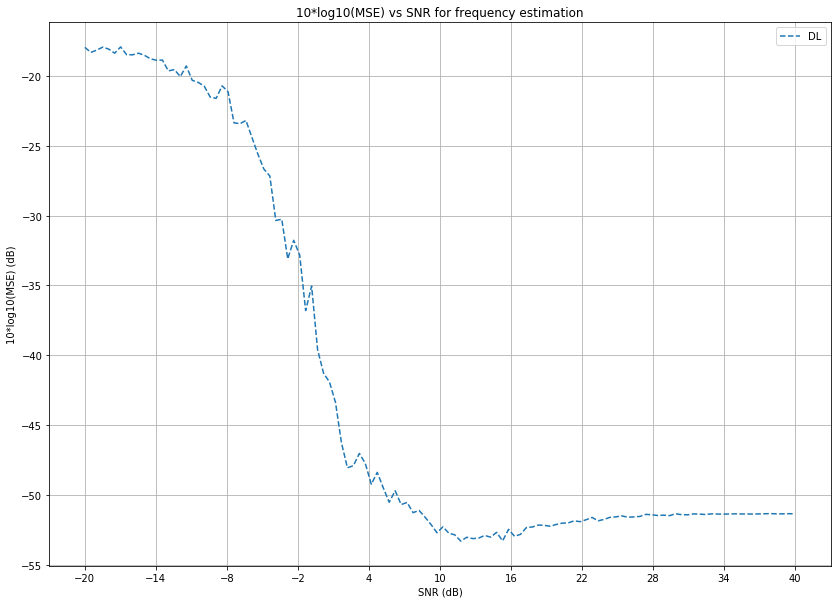

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


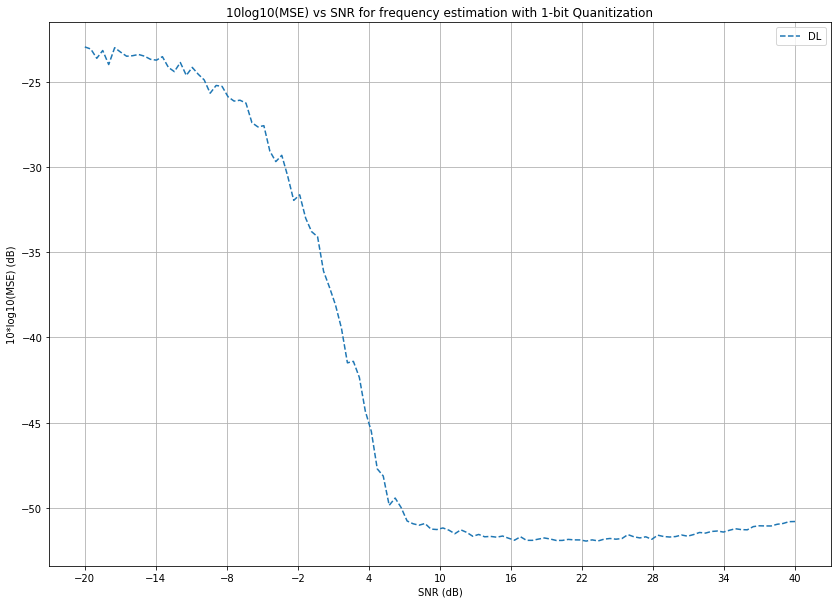

Starting LSTM16_LSTM32_LSTM64_Res64-3_L32_Res32-3_L16_snr_0-10.h5py


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part


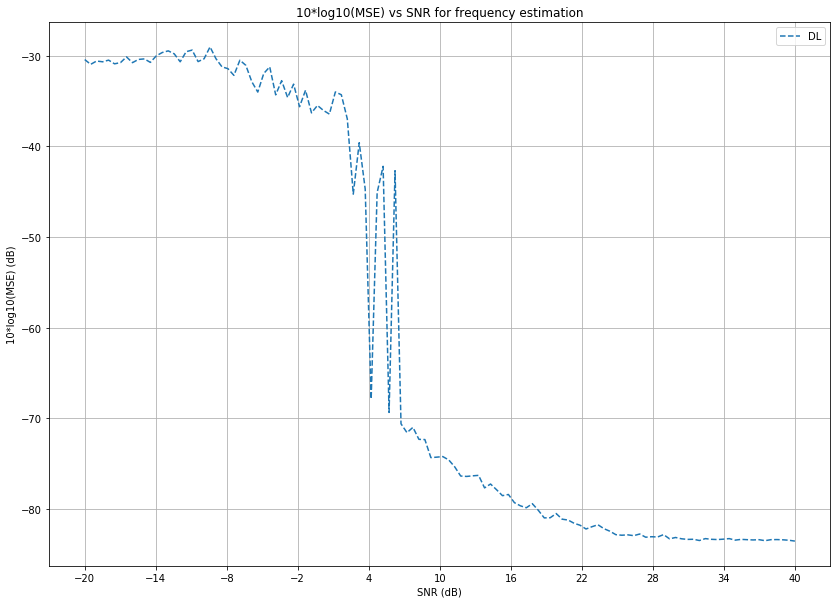

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:289: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:292: ComplexWarning: Casting complex values to real discards the imaginary part


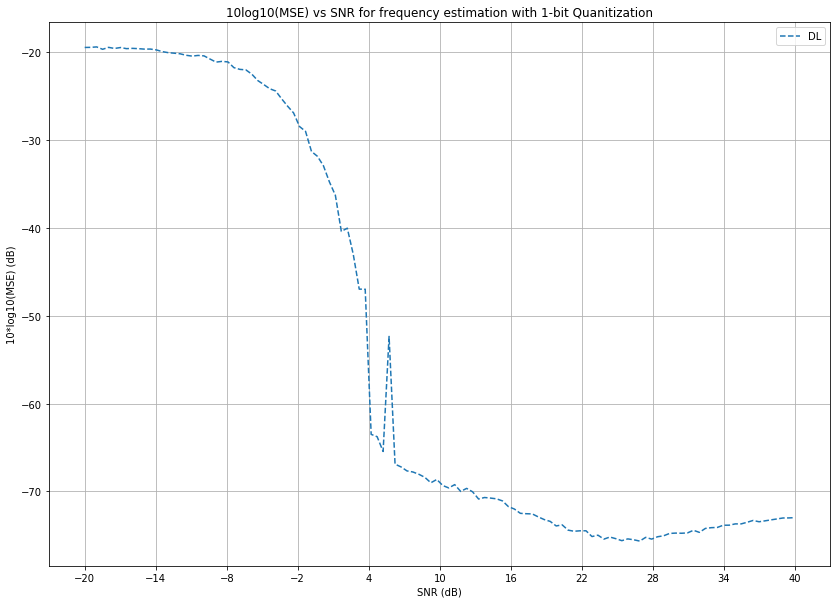

In [0]:
nset = [64, 128]
import os


for ni in nset:
    print(f"Working on n={ni}")
    msepath = 'drive/My Drive/Colab Notebooks_UT/CFO/MSES/' + str(ni) + "-point/"
    m_path = 'drive/My Drive/Colab Notebooks_UT/CFO/Models/'+str(ni)+'-point/'
    estimators = os.listdir(m_path)
    # estimators.remove('classic.pickle')
    for estimator in estimators:
        print(f"Starting {estimator}")
        update_snrs(estimator, ni)

## Total Model Evaluation

### Unquantized Comparison

Graph for n=8


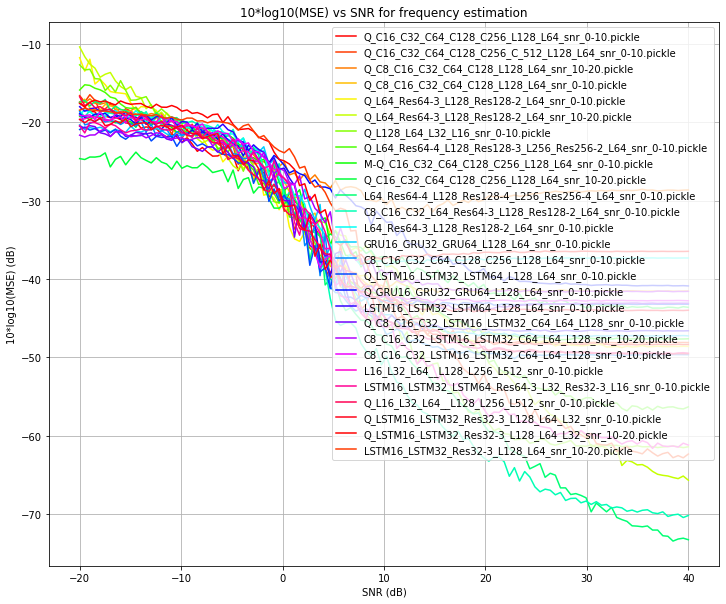

Graph for n=16


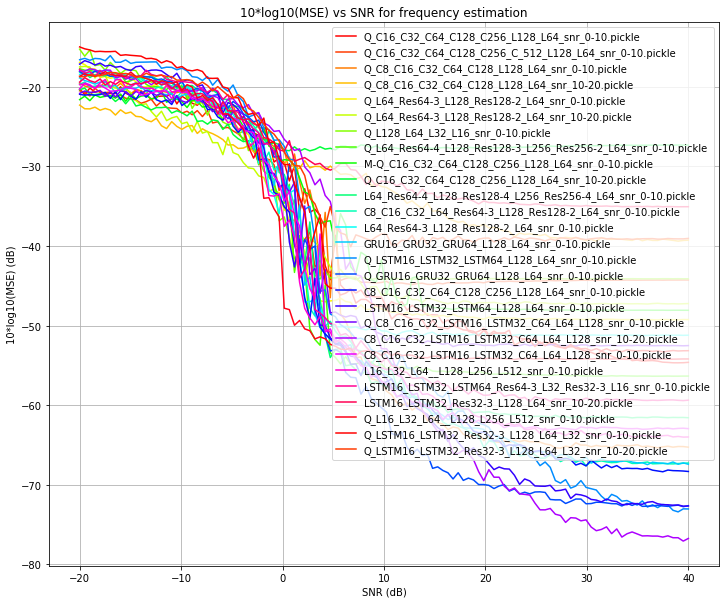

Graph for n=32


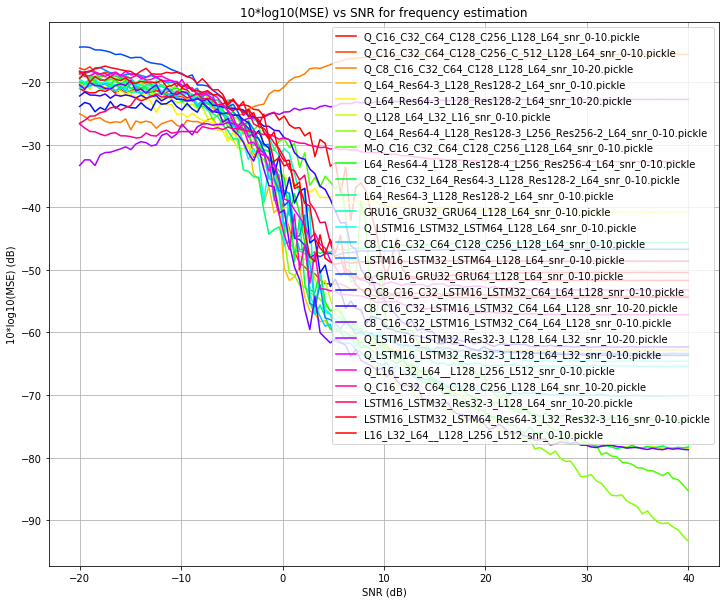

Graph for n=64


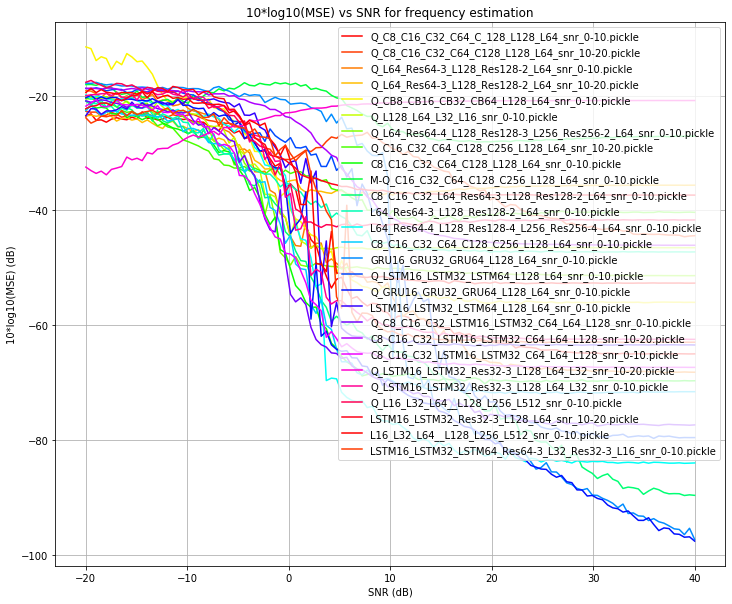

Graph for n=128


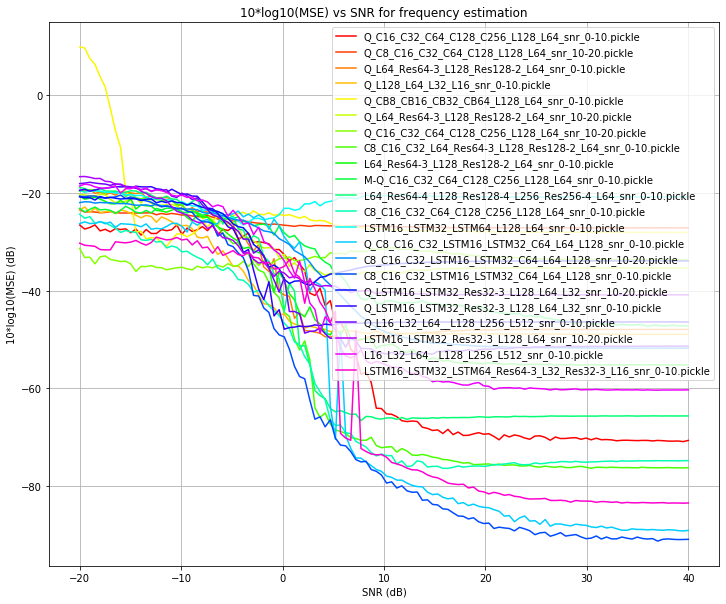

In [0]:
import os

cmap = matplotlib.cm.get_cmap('hsv')

n = np.linspace(0, 1, 25)
colors = cmap(n)

nset = [8, 16, 32, 64, 128]

main_path = 'drive/My Drive/Colab Notebooks_UT/CFO/MSES/'
base_names = ["Periodogram", "Weighted Phase Averager", "Unweighted Phase Averager", "Weighted Linear", "Unweighted Linear"]

## set up plotting
matplotlib.rcParams['figure.figsize'] = [12, 10]

for ni in nset:
    fig, ax = plt.subplots()
    ax.set_prop_cycle(color=colors)

    print(f"Graph for n={ni}")
    msepath = 'drive/My Drive/Colab Notebooks_UT/CFO/MSES/' + str(ni) + "-point/"
    estimators = os.listdir(msepath)
    estimators.remove('classic.pickle')
        
    for estimator in estimators:   
        filen = open(msepath+estimator, "rb")
        (snrs, mses), (quant_snrs, quant_mses) = pickle.load(filen)
        filen.close()
        
        if estimator=='classic.pickle':
            for i in range(len(mses)):
                plt.plot(snrs, mses[i])
        else:
            plt.plot(snrs.reshape(120, 1), mses.reshape(120, 1))
            

    plt.legend(estimators, loc='upper right')
    plt.title(f"10*log10(MSE) vs SNR for frequency estimation")
    plt.xlabel("SNR (dB)")
    plt.ylabel("10*log10(MSE) (dB)")
    plt.grid()
    plt.show()

### Quantized Comparison

Graph for n=8


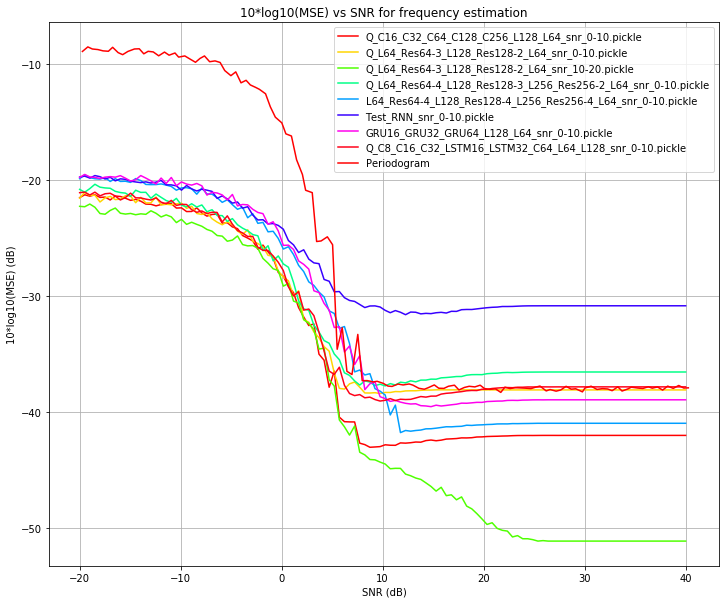

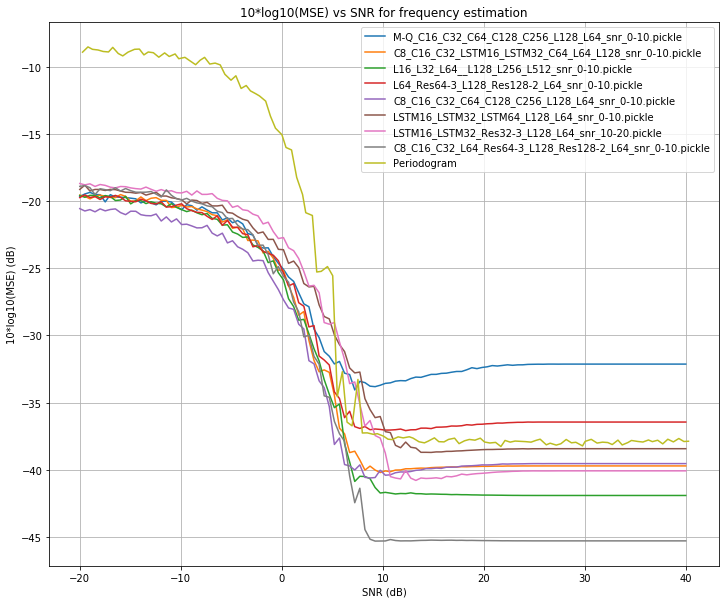

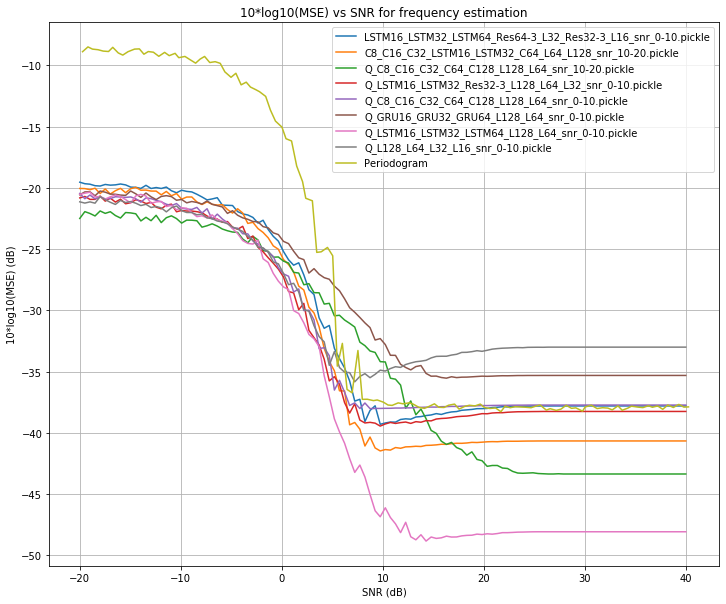

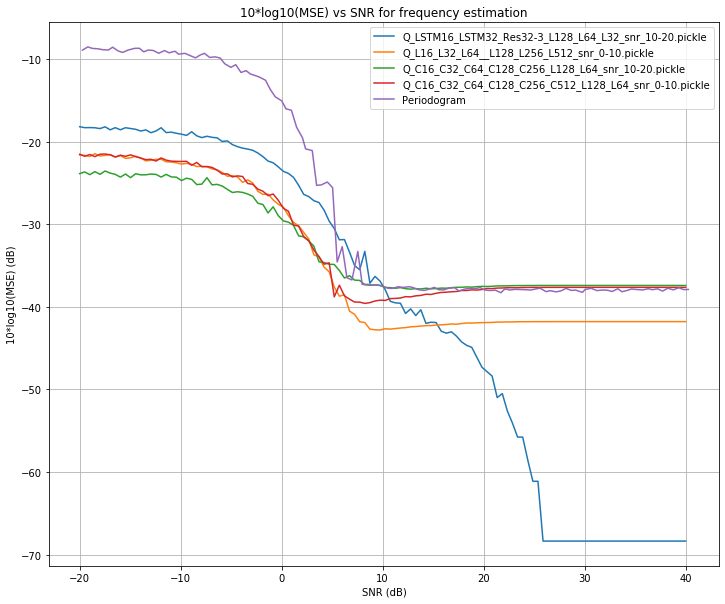

Graph for n=16


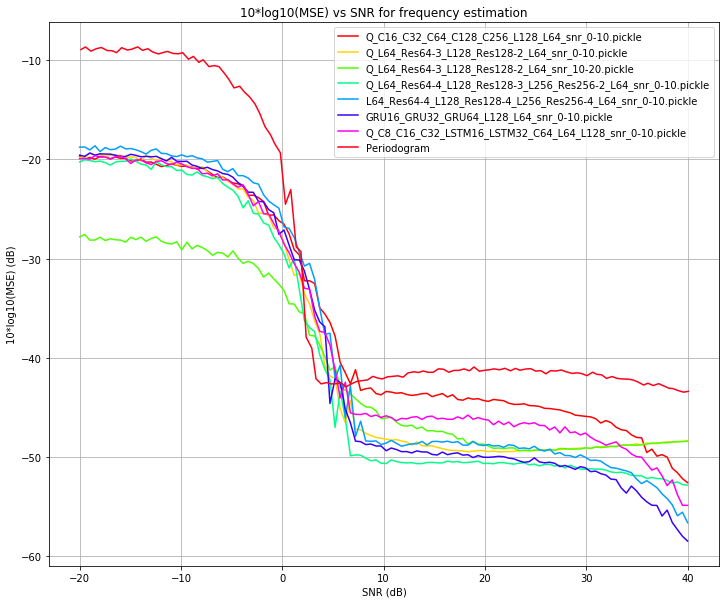

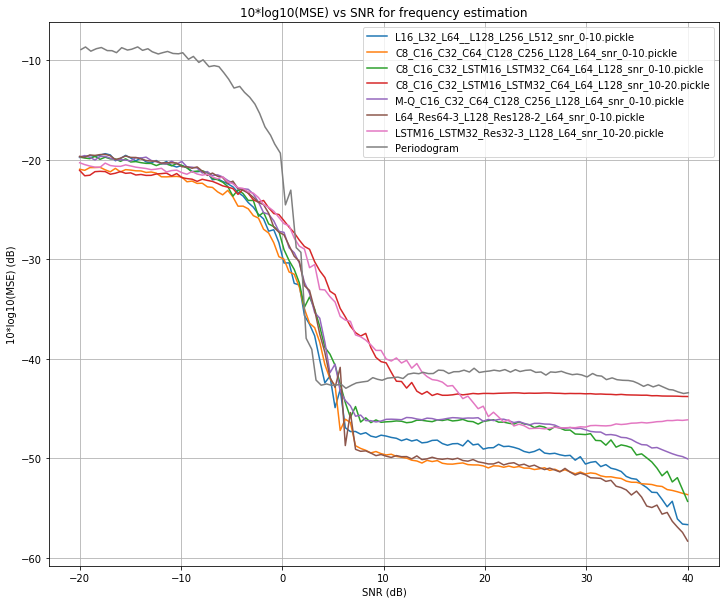

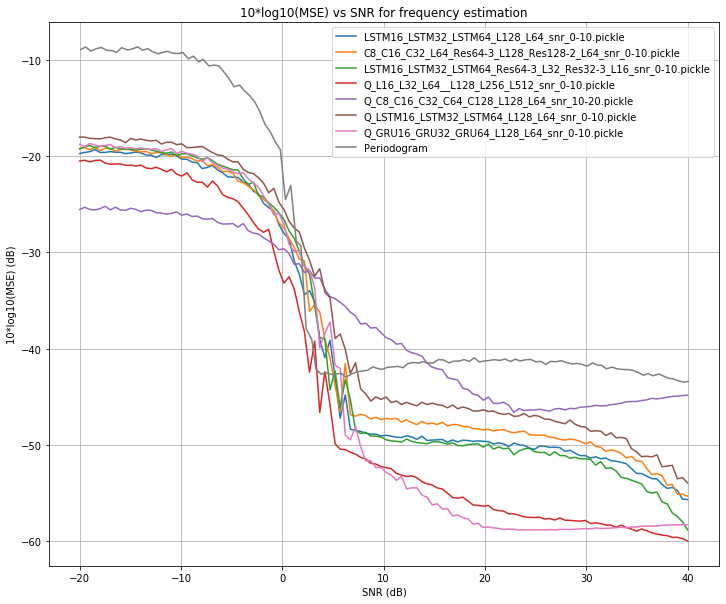

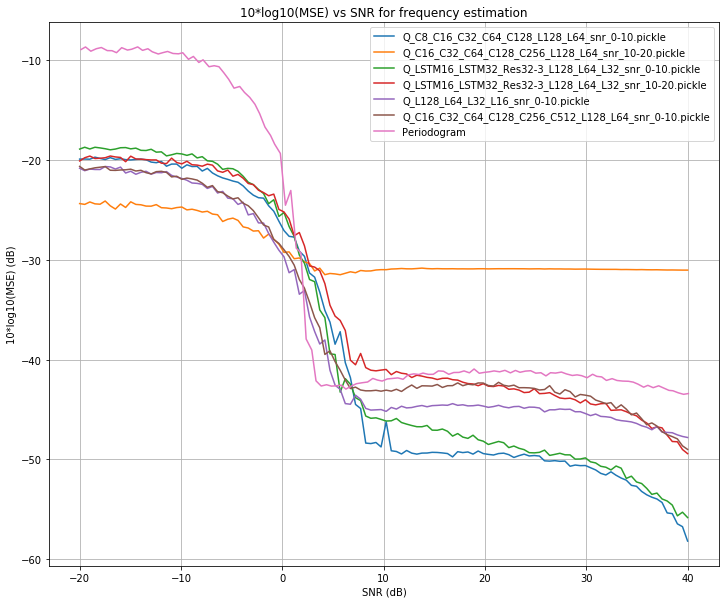

Graph for n=32


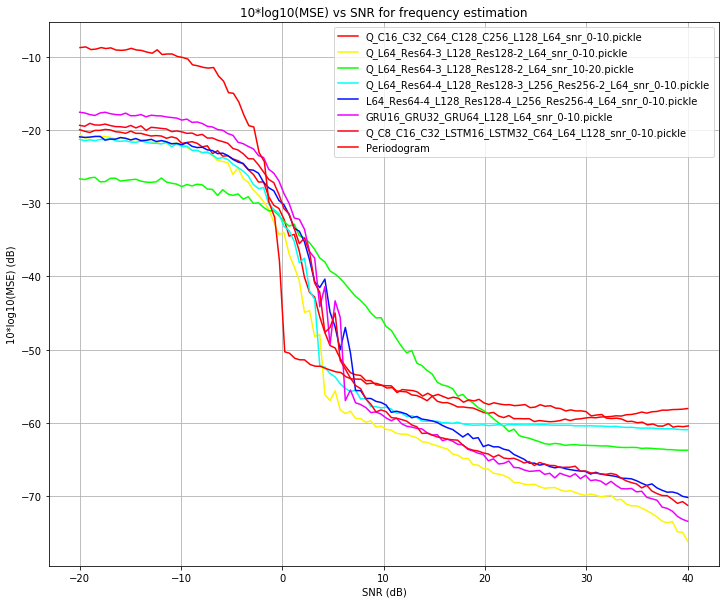

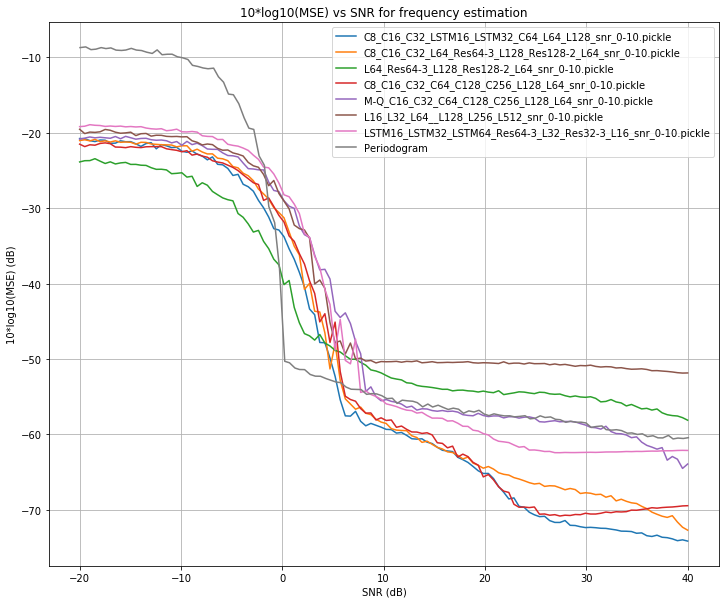

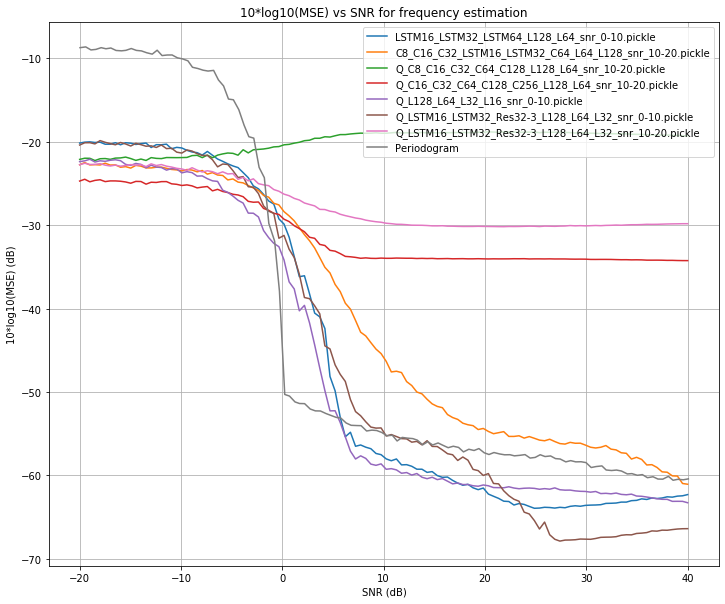

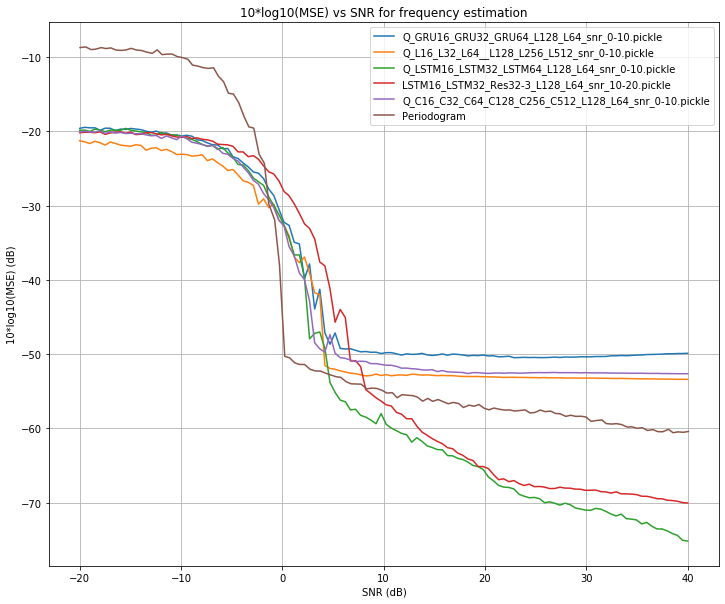

Graph for n=64


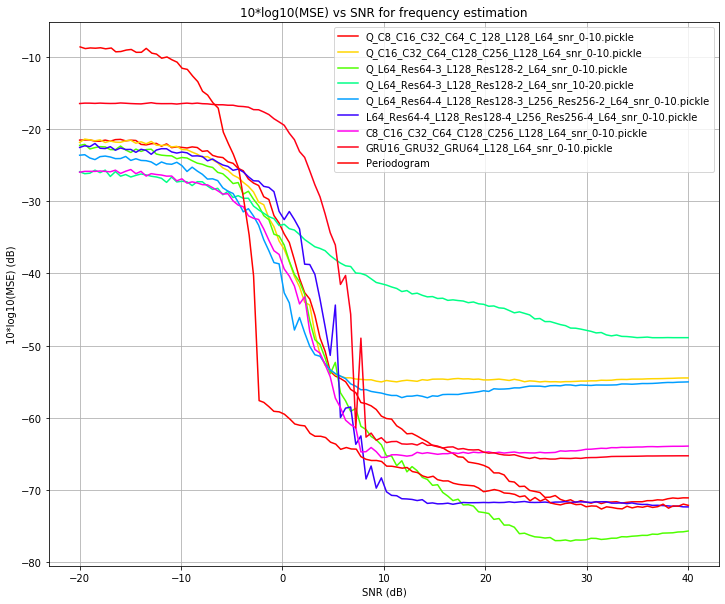

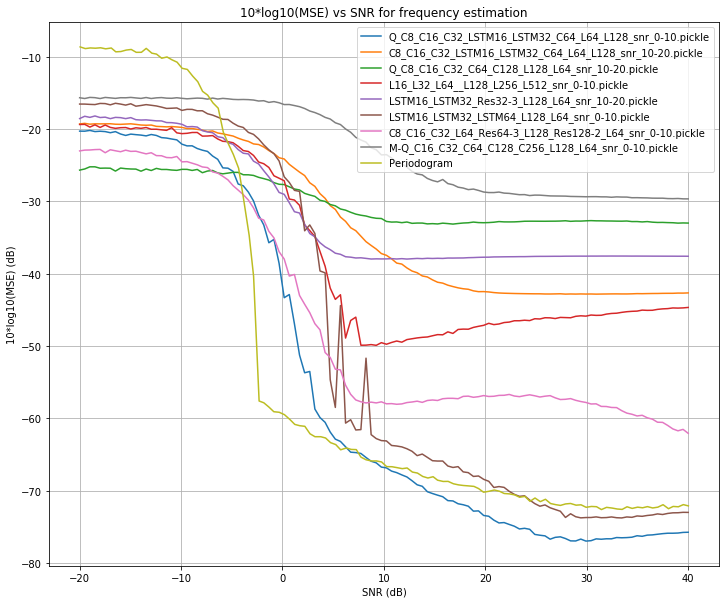

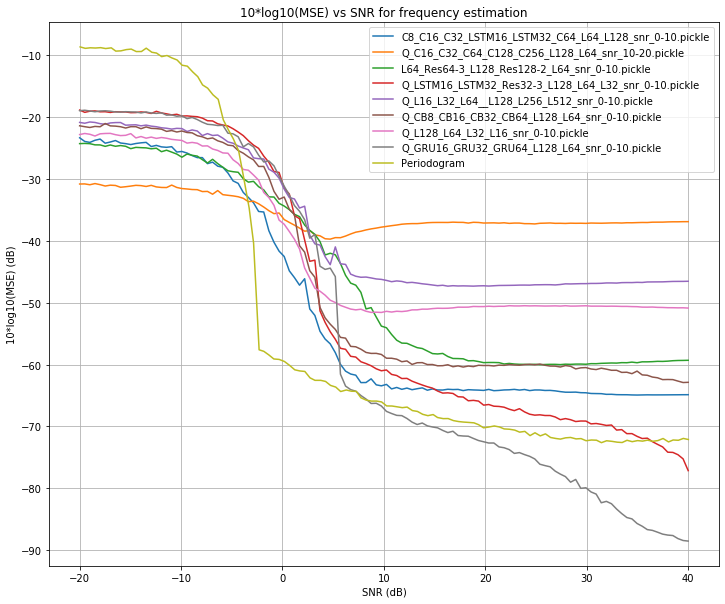

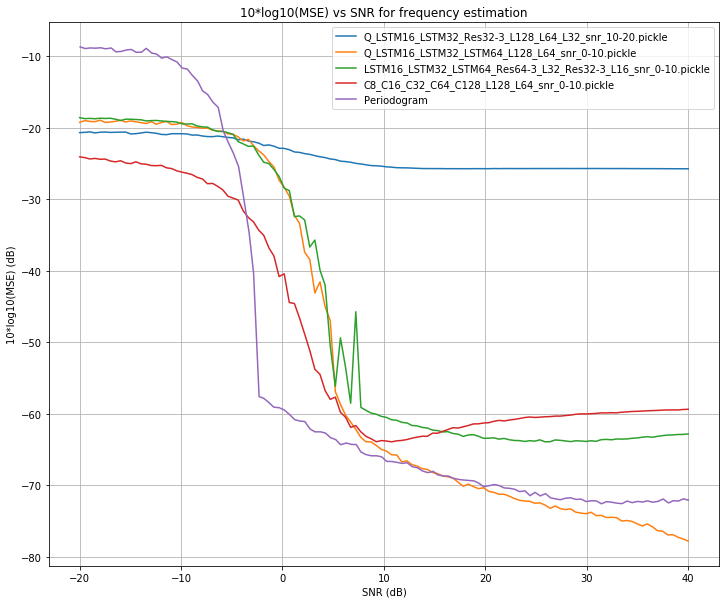

Graph for n=128


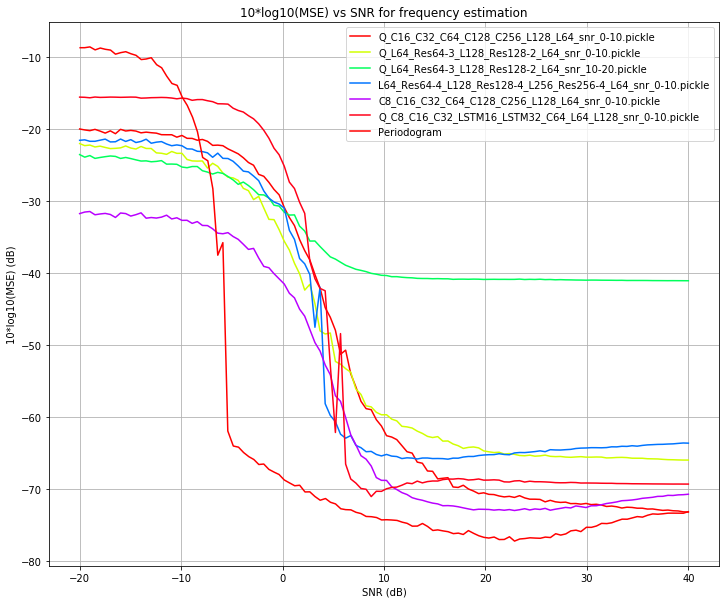

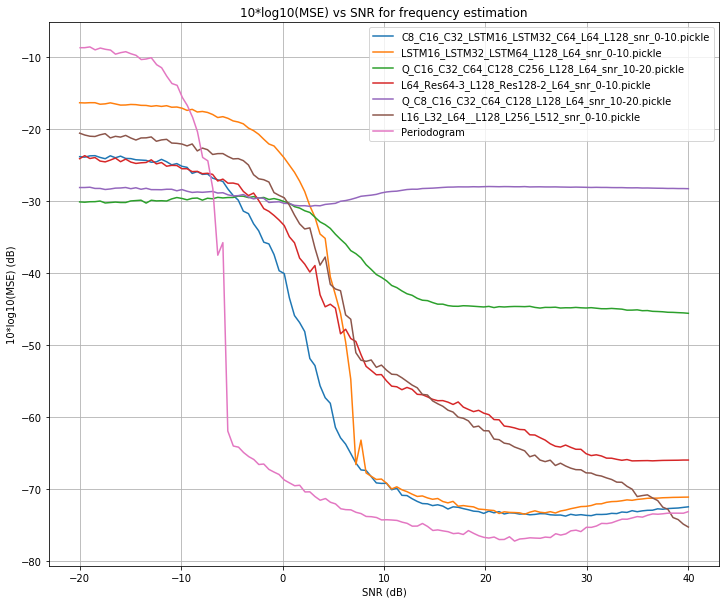

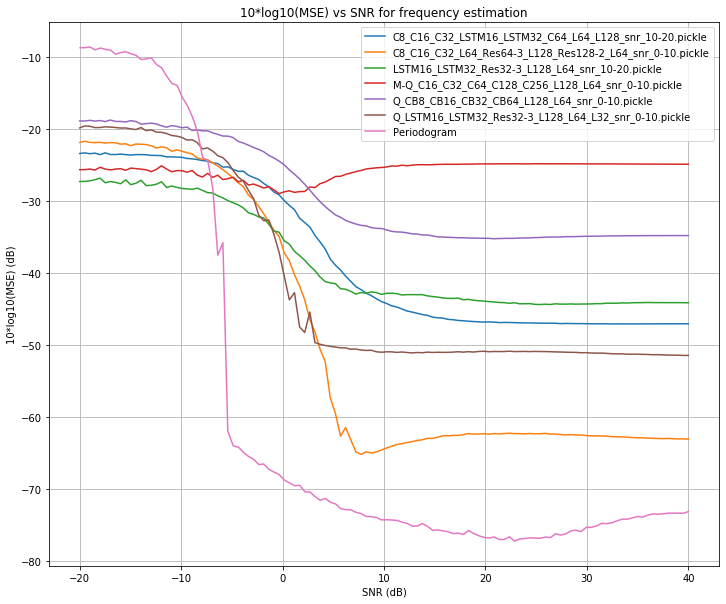

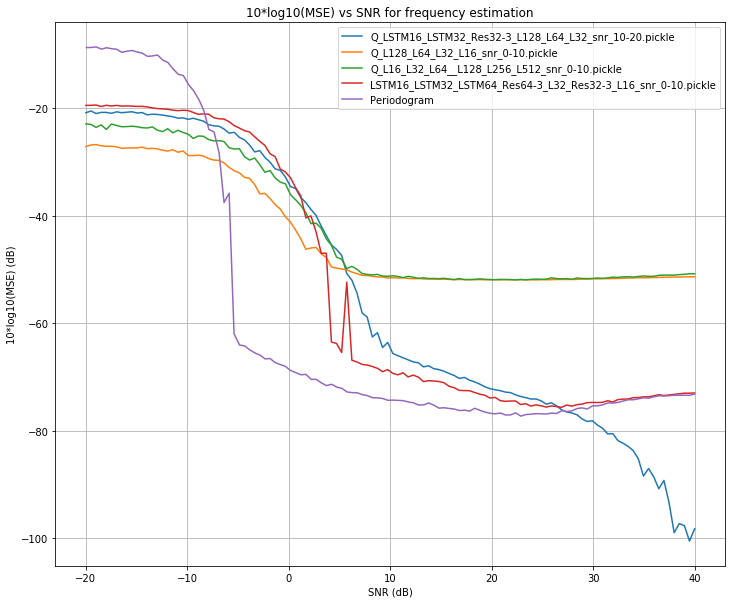

In [0]:
import os

cmap = matplotlib.cm.get_cmap('hsv')

nset = [8, 16, 32, 64, 128]

main_path = 'drive/My Drive/Colab Notebooks_UT/CFO/MSES/'
base_names = ["Periodogram", "Weighted Phase Averager", "Unweighted Phase Averager", "Weighted Linear", "Unweighted Linear"]

## set up plotting
matplotlib.rcParams['figure.figsize'] = [12, 10]

for ni in nset:

    used = []
    count = 0
    print(f"Graph for n={ni}")
    msepath = 'drive/My Drive/Colab Notebooks_UT/CFO/MSES/' + str(ni) + "-point/"

    classic_path = msepath +'classic.pickle'
    filen = open(classic_path, "rb") 
    (snrs, mses), (quant_snrs, quant_mses) = pickle.load(filen)
    filen.close()
    periodogram = [quant_snrs, quant_mses[0]]

    estimators = os.listdir(msepath)

    plots = 4.0
    maximum = (len(estimators) + 4)/plots
    estimators.remove('classic.pickle')
    ncolors = np.linspace(0, 1, maximum)
    colors = cmap(ncolors)
    fig, ax = plt.subplots()
    ax.set_prop_cycle(color=colors)

        
    for estimator in estimators:   
        filen = open(msepath+estimator, "rb")
        try:
            (snrs, mses), (quant_snrs, quant_mses) = pickle.load(filen)
        except EOFError as e:
            print(estimator)
        filen.close()
        
        if estimator=='classic.pickle':
            count += 1
            for i in range(1):
                plt.plot(quant_snrs[i], quant_mses[i])
                used.append(base_names[i])
        else:
            count += 1
            plt.plot(quant_snrs.reshape(120, 1), quant_mses.reshape(120, 1))
            used.append(estimator)

        if count >= maximum-1:
            plt.plot(periodogram[0], periodogram[1])
            used.append(base_names[0])
            plt.legend(used, loc='upper right')
            # plt.xlim((-20, 50))
            # bot, top = plt.ylim()
            # plt.ylim((bot, 0))
            plt.title(f"10*log10(MSE) vs SNR for frequency estimation")
            plt.xlabel("SNR (dB)")
            plt.ylabel("10*log10(MSE) (dB)")
            plt.grid()
            plt.show()
            count = 0
            used = []
            
    # estimators.remove('classic.pickle')
    # print(count, len(estimators))
    if len(used) >= 1:
        plt.plot(periodogram[0], periodogram[1])
        used.append(base_names[0])  
        plt.legend(used, loc='upper right')
        # plt.xlim((-20, 50))
        # bot, top = plt.ylim()
        # plt.ylim((bot, 0))
        plt.title(f"10*log10(MSE) vs SNR for frequency estimation")
        plt.xlabel("SNR (dB)")
        plt.ylabel("10*log10(MSE) (dB)")
        plt.grid()
        plt.show()

## Specific Plotting

Graph for n=8
21 21


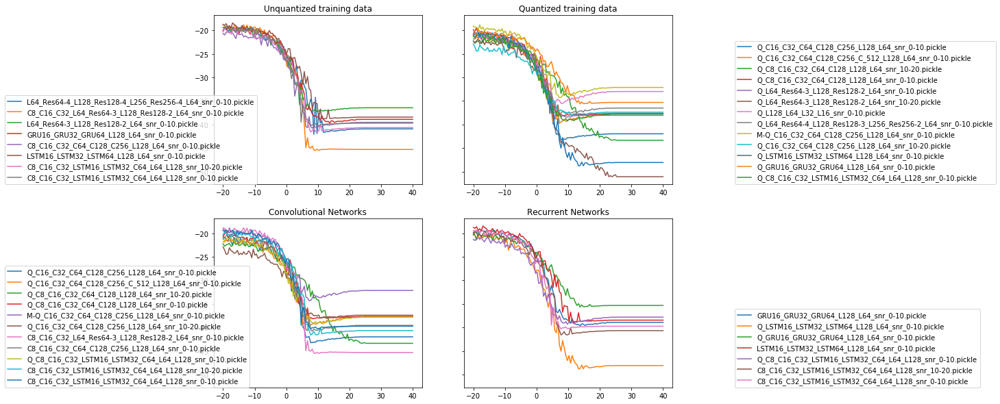

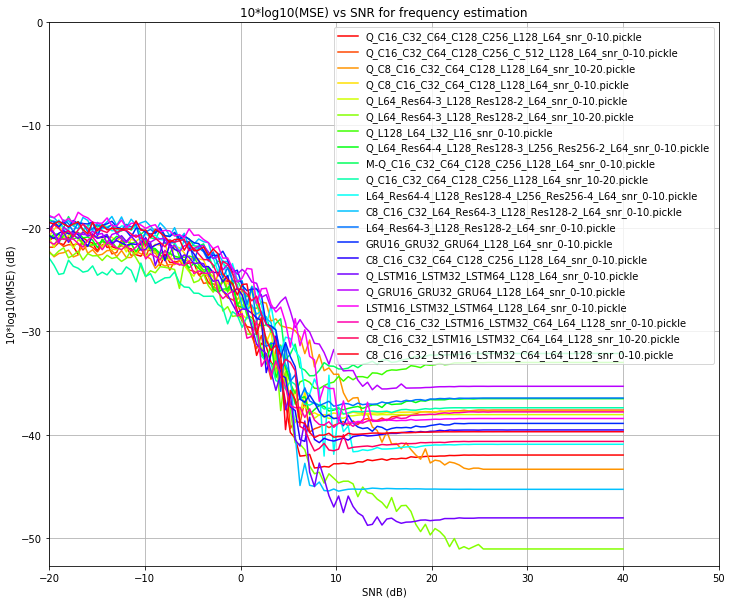

In [0]:
# specific plotting

import os

cmap = matplotlib.cm.get_cmap('hsv')

nset = [8] #, 16, 32, 64, 128]

main_path = 'drive/My Drive/Colab Notebooks_UT/CFO/MSES/'
base_names = ["Periodogram", "Weighted Phase Averager", "Unweighted Phase Averager", "Weighted Linear", "Unweighted Linear"]

## set up plotting
matplotlib.rcParams['figure.figsize'] = [12, 10]

for ni in nset:
    fig, axes = plt.subplots(2, 2, sharey=True)
    # subplots for unquantized, quantized, Conv, and one for RNN
    names = [[], [], [], []]
    axes[0][0].title.set_text("Unquantized training data")
    axes[0][1].title.set_text("Quantized training data")
    axes[1][0].title.set_text("Convolutional Networks")
    axes[1][1].title.set_text("Recurrent Networks")

    count = 0
    print(f"Graph for n={ni}")
    msepath = 'drive/My Drive/Colab Notebooks_UT/CFO/MSES/' + str(ni) + "-point/"
    estimators = os.listdir(msepath)
    estimators.remove('classic.pickle')
    ncolors = np.linspace(0, 1, len(estimators))
    colors = cmap(ncolors)
    fig, ax = plt.subplots()
    ax.set_prop_cycle(color=colors)
        
    for estimator in estimators:   
        filen = open(msepath+estimator, "rb")
        (snrs, mses), (quant_snrs, quant_mses) = pickle.load(filen)
        filen.close()
        
        if estimator=='classic.pickle':
            for i in range(len(mses)):
                plt.plot(quant_snrs, quant_mses[i])
        else:
            count += 1
            if "Q" not in estimator:
                axes[0][0].plot(quant_snrs.reshape(120, 1), quant_mses.reshape(120, 1))
                names[0].append(estimator)
                axes[0][0].legend(names[0], loc=(-1, 0))

            else:
                axes[0][1].plot(quant_snrs.reshape(120, 1), quant_mses.reshape(120, 1))
                names[1].append(estimator)
                axes[0][1].legend(names[1], loc=(1.3, 0))

            if "C" in estimator:
                axes[1][0].plot(quant_snrs.reshape(120, 1), quant_mses.reshape(120, 1))
                names[2].append(estimator)
                axes[1][0].legend(names[2], loc=(-1, 0))

            if "LSTM" in estimator or "GRU" in estimator:
                axes[1][1].plot(quant_snrs.reshape(120, 1), quant_mses.reshape(120, 1))
                names[3].append(estimator)
                axes[1][1].legend(names[3], loc=(1.3, 0))

            plt.plot(quant_snrs.reshape(120, 1), quant_mses.reshape(120, 1))
            
    # estimators.remove('classic.pickle')
    print(count, len(estimators))
    plt.legend(estimators, loc='upper right')
    plt.xlim((-20, 50))
    bot, top = plt.ylim()
    plt.ylim((bot, 0))
    plt.title(f"10*log10(MSE) vs SNR for frequency estimation")
    plt.xlabel("SNR (dB)")
    plt.ylabel("10*log10(MSE) (dB)")
    plt.grid()
    plt.show()

# Best Results

Graph for n=8


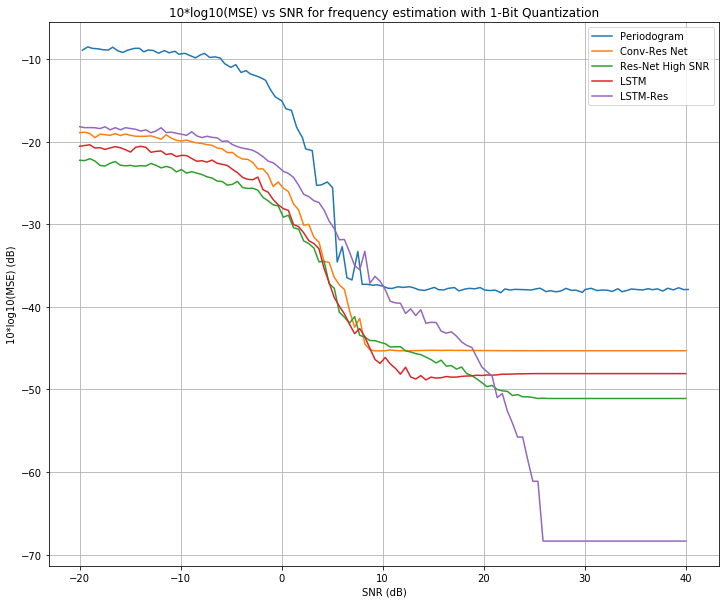

Graph for n=16


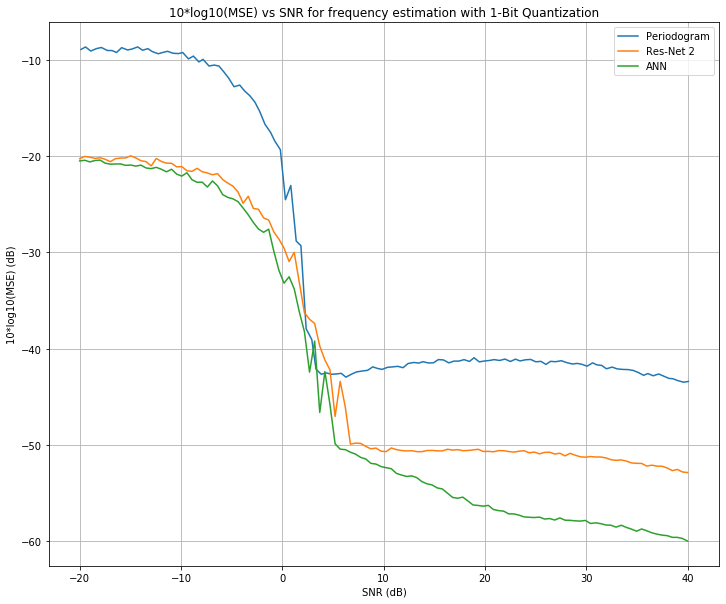

Graph for n=32


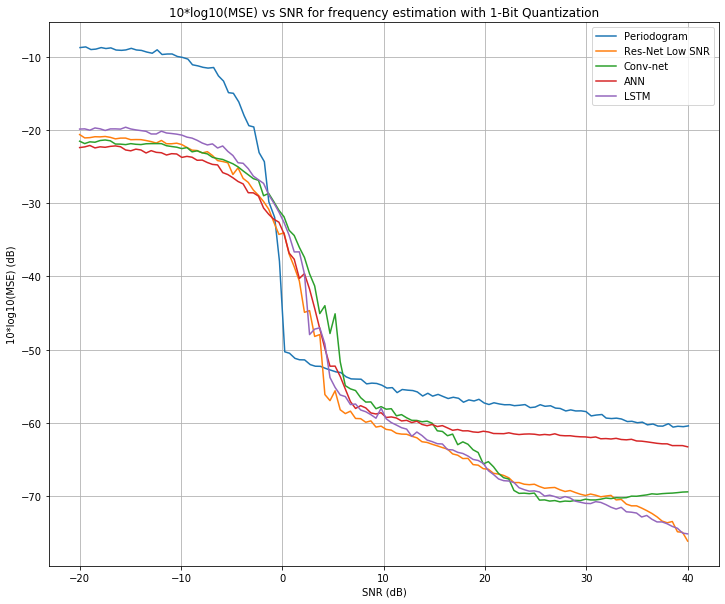

Graph for n=64


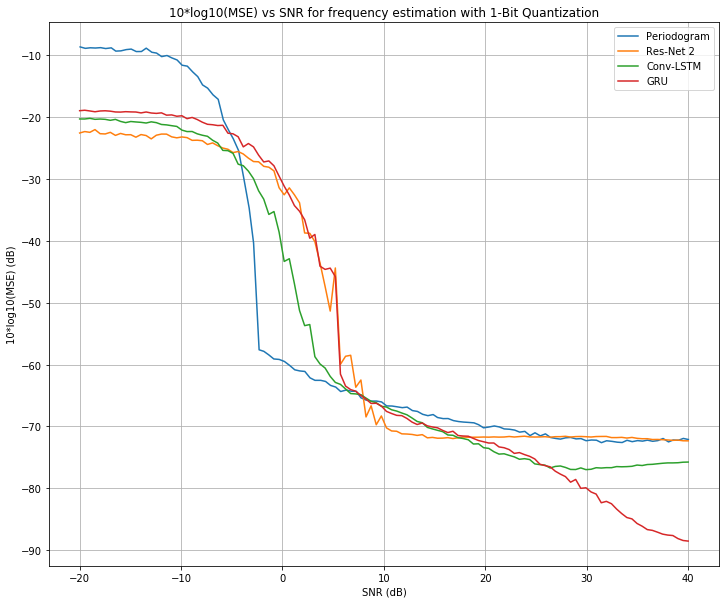

Graph for n=128


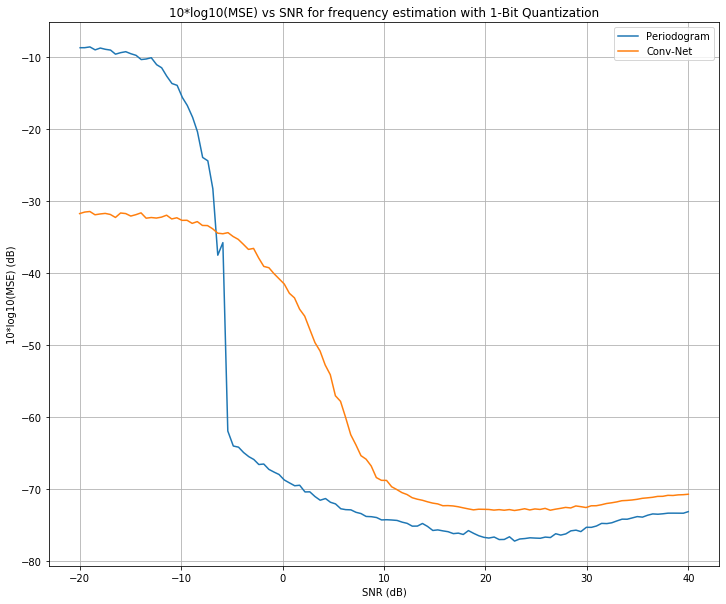

In [0]:
nset = [8, 16, 32, 64, 128]

main_path = 'drive/My Drive/Colab Notebooks_UT/CFO/MSES/'
base_names = ["Periodogram"]
DL_est = [
    ['C8_C16_C32_L64_Res64-3_L128_Res128-2_L64_snr_0-10.pickle', 'Q_L64_Res64-3_L128_Res128-2_L64_snr_10-20.pickle', 'Q_LSTM16_LSTM32_LSTM64_L128_L64_snr_0-10.pickle', 'Q_LSTM16_LSTM32_Res32-3_L128_L64_L32_snr_10-20.pickle'],
    ['Q_L64_Res64-4_L128_Res128-3_L256_Res256-2_L64_snr_0-10.pickle', 'Q_L16_L32_L64__L128_L256_L512_snr_0-10.pickle'],
    ['Q_L64_Res64-3_L128_Res128-2_L64_snr_0-10.pickle', 'C8_C16_C32_C64_C128_C256_L128_L64_snr_0-10.pickle', 'Q_L128_L64_L32_L16_snr_0-10.pickle', 'Q_LSTM16_LSTM32_LSTM64_L128_L64_snr_0-10.pickle'],
    ['L64_Res64-4_L128_Res128-4_L256_Res256-4_L64_snr_0-10.pickle', 'Q_C8_C16_C32_LSTM16_LSTM32_C64_L64_L128_snr_0-10.pickle', 'Q_GRU16_GRU32_GRU64_L128_L64_snr_0-10.pickle'],
    ['C8_C16_C32_C64_C128_C256_L128_L64_snr_0-10.pickle']
    ]
DL_names = [
    ['Conv-Res Net', 'Res-Net High SNR', 'LSTM', 'LSTM-Res'],
    ['Res-Net 2', 'ANN'],
    ['Res-Net Low SNR', 'Conv-net', 'ANN', 'LSTM'],
    ['Res-Net 2', 'Conv-LSTM', 'GRU'],
    ['Conv-Net'],
    ]


## set up plotting
matplotlib.rcParams['figure.figsize'] = [12, 10]

for i, ni in enumerate(nset):
    print(f"Graph for n={ni}")
    msepath = 'drive/My Drive/Colab Notebooks_UT/CFO/MSES/' + str(ni) + "-point/"
           
    filen = open(msepath+'classic.pickle', "rb")
    (snrs, mses), (quant_snrs, quant_mses) = pickle.load(filen)
    filen.close()
        
    for k in range(len(mses)):
        plt.plot(quant_snrs, quant_mses[k])
        
    for estimator in DL_est[i]:
        filen = open(msepath+estimator, "rb")
        (snrs, mses), (quant_snrs, quant_mses) = pickle.load(filen)
        filen.close()
        
        plt.plot(quant_snrs.reshape(120, 1), quant_mses.reshape(120, 1))
            
    plt.legend(base_names + DL_names[i])
    plt.title(f"10*log10(MSE) vs SNR for frequency estimation with 1-Bit Quantization")
    plt.xlabel("SNR (dB)")
    plt.ylabel("10*log10(MSE) (dB)")
    plt.grid()
    plt.show()

In [0]:
number = 5
cmap = plt.get_cmap('gnuplot')
colors = [cmap(i) for i in np.linspace(0, 1, number)]

for i, color in enumerate(colors, start=1):
    plt.plot(x, i * x + i, color=color, label='$y = {i}x + {i}$'.format(i=i))
plt.legend(loc='best')
plt.show()

# Phase Dependence

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:297: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:300: ComplexWarning: Casting complex values to real discards the imaginary part


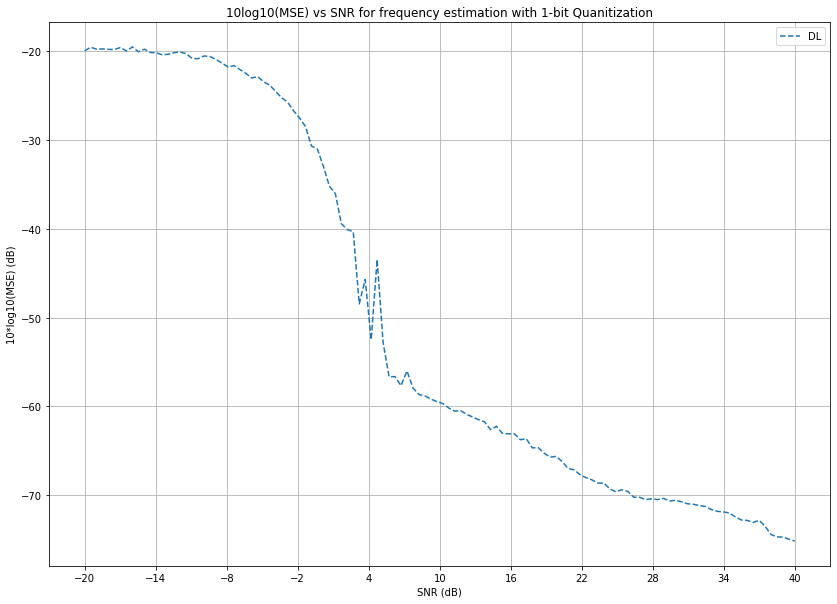

In [0]:
n = 32

name1 = 'Q_LSTM16_LSTM32_LSTM64_L128_L64_snr_0-10.h5py'
model_path = 'drive/My Drive/Colab Notebooks_UT/CFO/Models/'+str(n)+'-point/'
model_name = model_path + name1
msepath = 'drive/My Drive/Colab Notebooks_UT/CFO/MSES/'+str(n)+'-point/'
DL_path = msepath + name1[:-4] + "pickle"
model = keras.models.load_model(model_name)

def multi_est_model(data):
    data = np.array(data)
    # model1 = keras.models.load_model(model_name1)
    datam = np.array([])
    for i in range(len(data)):
        datam = np.append(datam, convert_complex_to_real(data[i]))
    results = model.predict(datam.reshape(len(data), n, 2))
    # del model1
    return results

x, _ = data_generator(min_fc=fc, max_fc=fc, amplitude=amplitude, n=n, digital_freq=1.0/sampling_ratio)

(quant_dlsnrs, quant_dlmses) = plot_over_snr_DL(x, -20, 40, fs=fs, fc=fc/fs, estimators=[multi_est_model], names=["DL"], quantizer=linear_quantizer, bits=bits, monte_carlos=1100)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:297: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:300: ComplexWarning: Casting complex values to real discards the imaginary part


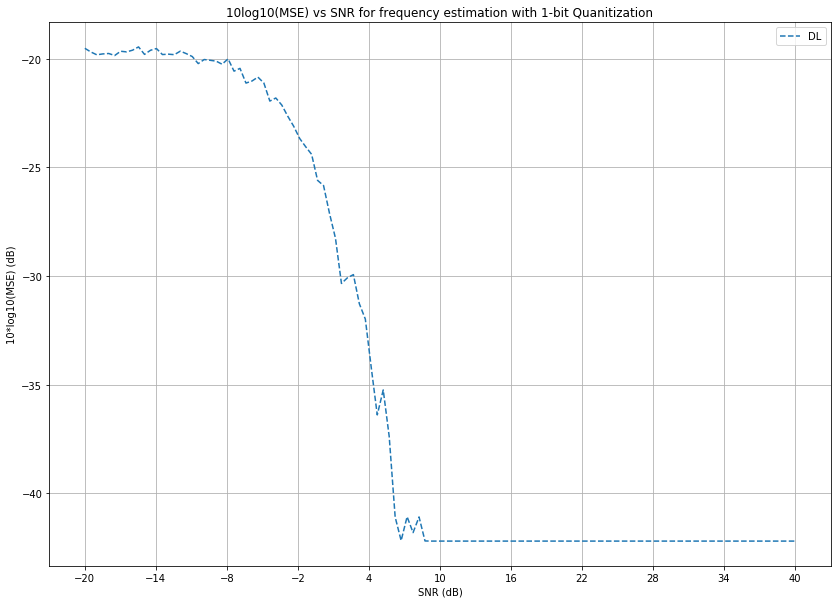

In [0]:
n = 32

name1 = 'Q_LSTM16_LSTM32_LSTM64_L128_L64_snr_0-10.h5py'
model_path = 'drive/My Drive/Colab Notebooks_UT/CFO/Models/'+str(n)+'-point/'
model_name = model_path + name1
msepath = 'drive/My Drive/Colab Notebooks_UT/CFO/MSES/'+str(n)+'-point/'
DL_path = msepath + name1[:-4] + "pickle"
model = keras.models.load_model(model_name)

def multi_est_model(data):
    data = np.array(data)
    # model1 = keras.models.load_model(model_name1)
    datam = np.array([])
    for i in range(len(data)):
        datam = np.append(datam, convert_complex_to_real(data[i]))
    results = model.predict(datam.reshape(len(data), n, 2))
    # del model1
    return results

x, _ = data_generator(min_fc=fc, max_fc=fc, amplitude=amplitude, n=n, digital_freq=1.0/sampling_ratio)

(quant_dlsnrs2, quant_dlmses2) = plot_over_snr_DL(x, -20, 40, fs=fs, fc=fc/fs, estimators=[multi_est_model], names=["DL"], phase=True, quantizer=linear_quantizer, bits=bits, monte_carlos=1100)
